In [1]:
# Imports
import numpy as np
import csv
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import randint as sp_randint
import sklearn
import lightgbm as lgb  # brew install lightgbm (on MacOS)
import pickle
from IPython.display import Image
from subprocess import call
from imblearn.over_sampling import SMOTE
import itertools

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import export_graphviz
from sklearn.metrics import f1_score, confusion_matrix
from imblearn.over_sampling import SMOTE

/Users/hanae/opt/anaconda3/envs/default/lib/python3.7/site-packages/lightgbm/__init__.py:48: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)
/Users/hanae/opt/anaconda3/envs/default/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_test

# Load data

In [2]:
train = pd.read_csv(os.path.join("cs5228", "train.csv"))
X_train = train.drop(["exceeds50K"], axis=1)
y_train = train["exceeds50K"]
X_test = pd.read_csv(os.path.join("cs5228", "test.csv"))
print(list(X_train.columns))
print(X_train.shape, X_test.shape)

['age', 'workclass', 'fnlwgt', 'education', 'education-num', 'marital-status', 'occupation', 'relationship', 'sex', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country']
(24421, 13) (24421, 13)


# Preprocessing

In [3]:
# One-hot-encoding
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)
print(X_train.shape, X_test.shape)

(24421, 102) (24421, 103)


# Parameter optimisation: gridsearch using 5-fold CV for evaluation

In [4]:
## Create a parameter grid for gridsearch

# Create the random grid
random_grid = {
    'objective': ['binary'],
    'num_leaves': [5, 10, 20, 50], 
    'min_data_in_leaf': [0, 10, 20, 40],
    'max_depth': [5, 10, 15],
    'max_bin': [5, 10, 25, 50],
    'learning_rate':[0.001, 0.01, 0.1],
    'dart': [True, False],
    'reg_alpha': [0, 1e-2, 1e-1, 1, 10, 100],
    'reg_lambda': [0, 1e-2, 1e-1, 1, 10, 100],
    'n_estimators': [1000, 5000, 10000],
    'bootstrap': [True, False]
        }
               
print(random_grid)

{'objective': ['binary'], 'num_leaves': [5, 10, 20, 50], 'min_data_in_leaf': [0, 10, 20, 40], 'max_depth': [5, 10, 15], 'max_bin': [5, 10, 25, 50], 'learning_rate': [0.001, 0.01, 0.1], 'dart': [True, False], 'reg_alpha': [0, 0.01, 0.1, 1, 10, 100], 'reg_lambda': [0, 0.01, 0.1, 1, 10, 100], 'n_estimators': [1000, 5000, 10000], 'bootstrap': [True, False]}


In [ ]:
## Use the random grid to search for best hyperparameters

# First create the base model to tune
gb = lgb.LGBMClassifier()
# Random search of parameters, using 3 fold cross validation, search across n_iter different combinations, and use all available cores
gb_gridsearch = RandomizedSearchCV(estimator=gb, param_distributions=random_grid, n_jobs=2,
                                   scoring="f1_micro", n_iter=2000, cv=5, verbose=6, random_state=42)
# Fit the random searfch model
gb_gridsearch.fit(X_train, y_train)
# Print best parameters according to gridsearch
gb_gridsearch.best_params_

Fitting 5 folds for each of 2000 candidates, totalling 10000 fits
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8700102354145341, total=   2.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8771498771498771, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.872031122031122, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8708026208026208, total=   2.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8662981162981163, total=   2.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=  56.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.860388945752303, total= 1.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8626126126126126, total=  47.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total= 1.1min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done   9 tasks      | elapsed:  2.4min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.854042988741044, total=  15.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total=  14.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  12.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8572891072891073, total= 1.2min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8527846027846028, total=  23.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583418628454452, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8513513513513514, total=  16.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8603603603603603, total=   3.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560606060606061, total=   2.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556806550665302, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.856879606879607, total=   5.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total=   6.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.854042988741044, total=   6.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8712121212121212, total=   5.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=   6.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   5.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=   5.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605936540429888, total=   6.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8630221130221131, total=   6.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=   6.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593366093366094, total=   6.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8722620266120777, total=   2.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=   7.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8769451269451269, total=   3.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8697788697788698, total=   3.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.872031122031122, total=   3.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total=   3.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587512794268168, total=  47.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628173628173627, total=  53.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8599508599508598, total=  53.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  47.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648925281473899, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.8min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total=   4.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605651105651106, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8525798525798526, total=  48.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.832343909928352, total=  35.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8452088452088452, total=  31.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8327190827190827, total=  31.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8359950859950861, total=  31.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8335380835380836, total=  31.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587512794268168, total=  30.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=  32.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total=  35.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601556101556102, total=  32.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8525798525798526, total=  32.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8446264073694985, total= 2.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8654791154791155, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8376330876330876, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8486895986895987, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8567041965199591, total=  23.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8656838656838657, total=  22.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8585176085176086, total=  22.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  23.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8503276003276004, total= 2.5min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8644831115660184, total=   5.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total=  35.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8714168714168714, total=   7.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8644553644553644, total=   6.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8660933660933662, total=   5.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8493346980552713, total=  44.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8576986076986077, total=  47.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  48.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8533988533988534, total=  48.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466734902763562, total=   4.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8503276003276004, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8175675675675675, total=   4.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   4.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8202293202293203, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730808597748209, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8775593775593775, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8712121212121212, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8495085995085996, total=  51.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8705978705978705, total=   9.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589559877175026, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8693693693693695, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8564701064701065, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8624078624078625, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8133060388945752, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8409090909090909, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8183865683865684, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8364045864045864, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8361998361998362, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599795291709315, total=  43.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8566748566748567, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total=  57.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8605651105651106, total=  59.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8696008188331628, total=  11.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8552416052416052, total=  51.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8763308763308764, total=  21.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8665028665028666, total=  16.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=  16.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 109 tasks      | elapsed: 27.0min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8182190378710338, total=   4.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8292383292383292, total=   5.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8654791154791155, total=  14.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8304668304668305, total=   6.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8198198198198198, total=   5.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8263718263718264, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8174002047082907, total=  12.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8233005733005733, total=  13.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8237100737100738, total=  12.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.821048321048321, total=  12.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8187960687960688, total=  14.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8544524053224155, total=  27.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total=  31.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.856879606879607, total=  31.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=  33.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8321392016376663, total=   8.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8435708435708436, total=  10.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8527846027846028, total=  30.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8290335790335789, total=  10.5s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8306715806715808, total=   8.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.85957011258956, total=   5.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8364045864045864, total=   8.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=   5.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=   5.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8517608517608518, total=   7.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8552712384851586, total=  11.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8576986076986077, total=  17.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587223587223587, total=  42.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8515561015561015, total=  35.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=  11.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8626407369498464, total=  43.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  45.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593366093366094, total=  43.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  42.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8718526100307062, total=   9.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8759213759213759, total=  10.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8705978705978705, total=   9.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.866912366912367, total=   8.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8558558558558559, total=  54.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=  13.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581371545547595, total=  24.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8675266175266175, total=  25.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556511056511057, total=  23.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8611793611793612, total=  23.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564994882292732, total=  11.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total=  26.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total=  15.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total=  14.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8550368550368551, total=  13.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8521703521703522, total=  14.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8753326509723643, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.877968877968878, total= 1.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8746928746928747, total= 1.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.872031122031122, total= 1.3min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8708290685772775, total=  14.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8748976248976248, total=  15.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8708026208026208, total=  18.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  14.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8654791154791155, total= 1.7min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=  25.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8538382804503583, total=  15.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8599508599508598, total=  15.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8576986076986077, total=  15.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  15.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8665301944728762, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8726453726453727, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646601146601146, total=   3.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8658886158886159, total=   2.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8538083538083538, total=  16.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8603603603603603, total=   4.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714431934493346, total=  38.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8796068796068796, total=  43.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8712121212121212, total=  43.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8734643734643734, total=  42.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583418628454452, total=  26.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total=  46.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8656838656838657, total=  35.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589271089271089, total=  32.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total=  27.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8558558558558559, total=  25.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8704196519959058, total=  15.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8757166257166256, total=   9.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   9.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8703931203931204, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8483111566018425, total=   2.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8554463554463555, total=   2.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 44.4min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=  11.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.851965601965602, total=   3.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.851965601965602, total=   3.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8484848484848486, total=   3.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8182190378710338, total=   5.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8292383292383292, total=   5.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8300573300573301, total=   4.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8192055692055692, total=   5.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.821048321048321, total=   5.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8499488229273285, total=  14.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550368550368551, total=  16.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  16.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8536036036036037, total=  16.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8488943488943489, total=  16.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562947799385875, total=  25.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724406224406225, total=  27.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=  27.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=  27.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8171954964176049, total=   8.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=  27.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8222768222768223, total=  11.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8216625716625716, total=   8.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.819000819000819, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8368474923234391, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8175675675675675, total=   8.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8443898443898444, total=   5.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.83988533988534, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8409090909090909, total=   5.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.842956592956593, total=   5.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628454452405321, total= 1.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8703931203931204, total= 1.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.864045864045864, total= 1.2min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8654791154791155, total= 1.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593654042988741, total=  27.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8683456183456183, total=  40.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  26.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8548321048321048, total=  41.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601842374616172, total=   2.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8650696150696151, total=   4.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583128583128583, total=   4.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=   4.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8548321048321048, total=  33.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   6.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8669396110542477, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8775593775593775, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8628173628173627, total=   6.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8438075742067553, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583128583128583, total=   7.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8353808353808354, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8151105651105651, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8456183456183457, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8173628173628174, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542476970317298, total=  24.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8658886158886159, total=  26.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=  26.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total=  26.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8507371007371007, total=  25.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8612077789150461, total= 1.2min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total= 1.2min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8570843570843572, total= 1.2min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597461097461098, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624360286591607, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8738738738738738, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638411138411138, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8741044012282497, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8753071253071253, total=   2.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724406224406225, total=   2.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8708026208026208, total=   2.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8634316134316135, total=   2.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.855885363357216, total=  12.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8622031122031122, total=  13.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8517608517608518, total= 1.4min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  18.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589271089271089, total=  14.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8554463554463555, total=  14.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8628454452405321, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8718263718263718, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8652743652743653, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8667076167076169, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8133060388945752, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8409090909090909, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8183865683865684, total=   3.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8364045864045864, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8361998361998362, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.858546571136131, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8654791154791155, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8572891072891073, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.873899692937564, total=  12.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8808353808353808, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8611793611793612, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8683456183456183, total=  20.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726453726453727, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total=  13.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8569089048106449, total=  23.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8654791154791155, total=  26.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=  26.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=  26.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599795291709315, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8667076167076169, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=  26.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556511056511057, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8143295803480042, total=   3.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8224815724815725, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8136773136773137, total=   3.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8177723177723176, total=   3.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 309 tasks      | elapsed: 63.5min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8165438165438165, total=   3.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8538382804503583, total=  13.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8597461097461098, total=  14.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total=  14.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8544226044226044, total=  14.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8704196519959058, total=   4.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8746928746928747, total=   4.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total=  15.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.86998361998362, total=   6.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.867936117936118, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8542476970317298, total=  23.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8703931203931204, total=  26.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8572891072891073, total=  26.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=  25.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.85012285012285, total=  25.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8734902763561925, total= 1.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8808353808353808, total= 1.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8703931203931204, total= 1.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8714168714168714, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8298874104401228, total=  42.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8681408681408681, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.847051597051597, total=  47.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8271908271908271, total=  46.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8396805896805897, total=  42.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8419328419328419, total=  47.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8579324462640737, total=  33.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=  32.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.851965601965602, total=  32.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total=  30.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8665301944728762, total=  13.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8521703521703522, total=  35.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8712121212121212, total=  17.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8656838656838657, total=  15.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total=  15.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591318591318591, total=  14.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8655066530194473, total=  42.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8722358722358723, total=  45.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646601146601146, total=  45.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8654791154791155, total=  45.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589271089271089, total=  43.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421699078812692, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=  59.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421375921375921, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8439803439803439, total= 1.4min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638689866939611, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8751023751023751, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   6.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8443898443898444, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607983623336745, total=  43.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722358722358723, total=  43.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=  43.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=  43.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8583128583128583, total=  43.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8448311156601842, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636363636363636, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8452088452088452, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8419328419328419, total= 1.0min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8653019447287615, total=   4.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8703931203931204, total=   4.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644553644553644, total=   4.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8654791154791155, total=   4.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=   4.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8466420966420967, total= 1.2min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589559877175026, total=  30.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8677313677313677, total=  29.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599508599508598, total=  29.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8605651105651106, total=  29.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8667349027635618, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8533988533988534, total=  30.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8701883701883701, total=  12.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8660933660933662, total=  10.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   9.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8603603603603603, total=   9.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8278403275332651, total=  56.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8374283374283374, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8226863226863227, total=  57.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8259623259623259, total=  56.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8560900716479017, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8615888615888616, total=  12.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8599508599508598, total=  12.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8278050778050778, total= 1.2min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8677584442169908, total=   4.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  18.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8751023751023751, total=   5.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=   5.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=   5.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581081081081081, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8787878787878788, total=  27.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.871238485158649, total=  32.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  31.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726453726453727, total=  30.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=  35.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.87021494370522, total=  45.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8759213759213759, total=  53.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8695741195741195, total=  55.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.867936117936118, total=  45.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8282497441146366, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8603603603603603, total=  45.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8321048321048321, total=  13.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8337428337428336, total=   9.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8241195741195741, total=   9.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8243243243243243, total=   9.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8745138178096213, total=  43.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=  47.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total=  44.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8755118755118754, total=  42.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7862845445240533, total=   3.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7893120393120393, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7878787878787878, total=   2.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7895167895167895, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7882882882882883, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605936540429888, total=  21.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=  44.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8687551187551188, total=  26.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8611793611793612, total=  24.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total=  23.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  23.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.860388945752303, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=   4.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8548321048321048, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8714431934493346, total=  10.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8742833742833743, total=  10.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8736691236691236, total=  10.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.871007371007371, total=  10.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.864045864045864, total=   9.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8653019447287615, total=  44.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8728501228501229, total=  47.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646601146601146, total=  46.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total=  46.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562947799385875, total=  22.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8585176085176086, total=  49.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 99.1min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8718263718263718, total=  27.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total=  26.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total=  25.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8372569089048106, total=  38.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=  40.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8335380835380836, total=  40.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8437755937755937, total=  39.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8427518427518428, total=  39.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8610030706243603, total=  27.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8714168714168714, total=  25.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.864045864045864, total=  25.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  25.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  25.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548618219037871, total=   3.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8587223587223587, total=   1.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8554463554463555, total=   1.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   1.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8143295803480042, total=   3.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8224815724815725, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8136773136773137, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8177723177723176, total=   3.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8165438165438165, total=   3.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.7746161719549641, total=   6.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   6.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.7784602784602784, total=   6.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   6.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   6.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581371545547595, total=  24.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8652743652743653, total=  25.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8603603603603603, total=  26.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=  25.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8542178542178542, total=  25.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718526100307062, total=  38.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.878992628992629, total=  40.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.871007371007371, total=  40.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.867936117936118, total=  42.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=  42.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8696008188331628, total=  33.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8806306306306307, total=  31.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8712121212121212, total=  32.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  30.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  31.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8730808597748209, total=  53.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8785831285831286, total=  55.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total=  56.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734643734643734, total=  57.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8667076167076169, total=  56.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8700102354145341, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8794021294021294, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8687551187551188, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8697788697788698, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630501535312181, total=  24.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8740786240786241, total=  32.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8636363636363636, total=  29.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total=  29.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  28.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685772773797339, total=  35.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8777641277641277, total=  34.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8693693693693695, total=  35.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  34.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total=  34.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716479017400205, total=  40.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.878992628992629, total=  40.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8742833742833743, total=  41.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8746928746928747, total=  40.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638411138411138, total=  40.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605936540429888, total=  35.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8736691236691236, total=  35.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8572891072891073, total=  35.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8511770726714432, total=  13.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=  39.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  17.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8542178542178542, total=  15.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8533988533988534, total=  15.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8497133497133496, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726714431934494, total=  13.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.878992628992629, total=  13.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8701883701883701, total=  13.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  11.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  12.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542476970317298, total=  23.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8708026208026208, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8531941031941032, total=  25.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8704196519959058, total=  11.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total=  25.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8767403767403767, total=  13.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.86998361998362, total=  10.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total=  10.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=  11.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599795291709315, total=  16.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650696150696151, total=  17.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583128583128583, total=  17.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8603603603603603, total=  17.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=  16.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601842374616172, total=  15.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8595413595413596, total=  12.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  13.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8741044012282497, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8773546273546273, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8738738738738738, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8732596232596233, total= 1.3min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8567041965199591, total=  29.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8611793611793612, total=  30.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8646601146601146, total= 1.4min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8576986076986077, total=  37.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8531941031941032, total=  32.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8614124872057318, total=  22.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544226044226044, total=  35.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8677313677313677, total=  25.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  25.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  25.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  25.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552712384851586, total= 2.3min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total= 2.5min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605651105651106, total= 2.3min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total= 2.7min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.827021494370522, total=   8.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8337428337428336, total=   8.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8333333333333334, total=   7.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.823914823914824, total=   7.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8247338247338247, total=   7.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8659160696008188, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8531941031941032, total= 2.7min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8748976248976248, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8687551187551188, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724667349027636, total=   6.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8757166257166256, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8712121212121212, total=   6.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=   6.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=   8.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8624078624078625, total= 1.4min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8511770726714432, total=  16.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589271089271089, total=  10.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=  10.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=  10.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8482800982800983, total=   8.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8141248720573183, total=   8.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7786650286650286, total=   6.7s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 
[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8237100737100738, total=   7.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8136773136773137, total=   6.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8153153153153153, total=   6.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8714168714168714, total=   5.9s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 
[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624360286591607, total=   6.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646601146601146, total=   5.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8654791154791155, total=   6.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607983623336745, total=   2.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=   6.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.872031122031122, total=   3.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=   3.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.861998361998362, total=   2.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8552416052416052, total=   2.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601842374616172, total=  13.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.872031122031122, total=  16.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8605651105651106, total=  12.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8511466011466011, total=  21.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed: 142.8min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8429887410440123, total=   4.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8515561015561015, total=   4.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.856879606879607, total=  16.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8441850941850941, total=   5.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8441850941850941, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8480753480753482, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8663254861821904, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8761261261261262, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8626126126126126, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=  11.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8617936117936118, total=  10.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650972364380758, total=   5.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8695741195741195, total=   5.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632268632268633, total=   5.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8624078624078625, total=   5.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   5.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8734902763561925, total=  12.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.878992628992629, total=  13.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8742833742833743, total=  13.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8712121212121212, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=  12.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591606960081883, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8681408681408681, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8544226044226044, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8636363636363636, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681678607983623, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8798116298116299, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681408681408681, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8675266175266175, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8626126126126126, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8509723643807574, total=  13.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8626126126126126, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8480753480753482, total=  13.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8484848484848486, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8478705978705978, total=  20.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560606060606061, total= 2.5min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644831115660184, total=  55.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8714168714168714, total=  53.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8654791154791155, total=  49.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.861998361998362, total=  45.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8550368550368551, total=  45.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8632548618219038, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8693693693693695, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8634316134316135, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628173628173627, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581371545547595, total=   7.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.857903357903358, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8572891072891073, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=   7.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599795291709315, total=  14.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8683456183456183, total=  15.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total= 1.5min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599508599508598, total=  20.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=  17.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=  17.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8519959058341863, total=  24.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total=  25.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  25.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  24.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628454452405321, total=   2.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8734643734643734, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=   2.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total=   2.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.854013104013104, total=  27.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708290685772775, total=  21.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8791973791973792, total=  21.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728501228501229, total=  21.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8746928746928747, total=  21.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.857727737973388, total=   4.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593366093366094, total=   4.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=   4.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8544226044226044, total=   4.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=  22.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.854013104013104, total=   6.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556806550665302, total=  13.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8617936117936118, total=  14.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total=  16.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  15.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8689866939611054, total=   7.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556511056511057, total=  14.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8794021294021294, total=   8.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8667076167076169, total=   7.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8652743652743653, total=   7.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644553644553644, total=   7.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8511770726714432, total=  14.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.856879606879607, total=  15.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8542178542178542, total=  15.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8533988533988534, total=  15.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8278403275332651, total=   8.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8497133497133496, total=  14.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8323095823095823, total=   9.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8337428337428336, total=   7.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8241195741195741, total=   7.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8243243243243243, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8575230296827021, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=   9.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8595413595413596, total=   9.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8550368550368551, total=   9.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8531941031941032, total=   8.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8620266120777892, total=  52.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.86998361998362, total=  55.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8609746109746109, total=  50.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.861998361998362, total= 1.0min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546571136131014, total=   3.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8574938574938575, total=   3.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=   3.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8507371007371007, total=   3.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8533988533988534, total=   3.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8165813715455476, total=  10.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8237100737100738, total=  10.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8243243243243243, total=  10.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8548321048321048, total= 1.0min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8194103194103194, total=  14.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8192055692055692, total=  12.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8438075742067553, total=  50.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=  55.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8456183456183457, total=  54.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=  53.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.872057318321392, total=  11.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8777641277641277, total=  11.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8738738738738738, total=  11.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8722358722358723, total=  11.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.83988533988534, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8650696150696151, total=  18.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599795291709315, total=  21.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8675266175266175, total=  21.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  21.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=  21.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  22.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8616171954964176, total=  25.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8675266175266175, total=  25.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8617936117936118, total=  25.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8605651105651106, total=  25.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556511056511057, total=  26.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.865711361310133, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730548730548731, total=  26.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638411138411138, total=  26.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685503685503686, total=  26.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.861998361998362, total=  26.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591606960081883, total=  15.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671171171171173, total=  14.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=  14.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581081081081081, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8548321048321048, total=  13.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8659160696008188, total=  10.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8730548730548731, total=  10.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8648648648648649, total=  10.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8658886158886159, total=  10.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8617936117936118, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8636642784032752, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8738738738738738, total=  15.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=  14.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8701883701883701, total=  13.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8546571136131014, total=   4.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8574938574938575, total=  15.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=   4.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8507371007371007, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538083538083538, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8390992835209825, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.847051597051597, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8415233415233415, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8421375921375921, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8445945945945946, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8683725690890481, total=  31.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8726453726453727, total=  34.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667076167076169, total=  33.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8675266175266175, total=  33.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8454452405322416, total=   4.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8515561015561015, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8179770679770679, total=   5.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8327190827190827, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  39.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.860388945752303, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8697788697788698, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8601556101556102, total=  59.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8710337768679631, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8783783783783784, total=   2.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8712121212121212, total=   2.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   2.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8632268632268633, total=   2.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8710337768679631, total=  19.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed: 179.2min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8791973791973792, total=  24.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  21.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724406224406225, total=  21.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638689866939611, total=  12.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=  23.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.871007371007371, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  14.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8102354145342886, total=   2.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8196150696150696, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8108108108108109, total=   2.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=  15.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8153153153153153, total=   4.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.812858312858313, total=   3.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550665301944729, total=  13.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8609746109746109, total=  14.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  15.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  15.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550368550368551, total=  14.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591606960081883, total=  41.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8673218673218673, total=  44.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8576986076986077, total=  45.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=  44.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8487205731832139, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8533988533988534, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8486895986895987, total=   1.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8576986076986077, total=  46.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8681678607983623, total=  50.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8736691236691236, total=  50.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8671171171171173, total=  50.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total=  50.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599795291709315, total=   5.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8687551187551188, total=   5.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8585176085176086, total=   5.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624078624078625, total=   4.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total=  52.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544524053224155, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.857903357903358, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8517608517608518, total=   1.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544226044226044, total=   1.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8474923234390993, total=   7.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=   8.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8472563472563472, total=   8.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8488943488943489, total=   8.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8466420966420967, total=   8.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8499488229273285, total=  13.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  14.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=  14.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=  14.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8497133497133496, total=  14.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714431934493346, total=  34.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.877968877968878, total=  35.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.866912366912367, total=  35.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.872031122031122, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536335721596726, total=   1.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=   1.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8574938574938575, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8521703521703522, total=   1.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=   1.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8667349027635618, total=  17.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8667076167076169, total=  39.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8734643734643734, total=  21.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  20.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8667076167076169, total=  20.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=  20.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734902763561925, total=  25.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.88001638001638, total=  27.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8751023751023751, total=  26.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.872031122031122, total=  27.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536335721596726, total=  13.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8656838656838657, total=  29.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total=  16.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8558558558558559, total=  14.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8525798525798526, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.851965601965602, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.828863868986694, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8478705978705978, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8245290745290745, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8384520884520884, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.85957011258956, total=  47.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8771498771498771, total=  48.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8361998361998362, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626126126126126, total=  53.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.857727737973388, total=  14.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8728501228501229, total=  15.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=  15.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total= 1.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=  20.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8603603603603603, total=  16.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8450358239508701, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8474610974610974, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472563472563472, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8642784032753327, total=  52.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8511466011466011, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8701883701883701, total=  58.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total= 1.0min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648648648648649, total=  59.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.861998361998362, total=  59.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8655066530194473, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8742833742833743, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8630221130221131, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8673218673218673, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732855680655066, total=  44.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8587223587223587, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8781736281736282, total=  56.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.86998361998362, total=  55.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  52.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total=  54.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8632548618219038, total=  19.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8734643734643734, total=  18.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8658886158886159, total=  16.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8654791154791155, total=  13.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8595413595413596, total=  12.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591606960081883, total=   8.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.868959868959869, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8609746109746109, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8609746109746109, total=   7.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=   7.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.860388945752303, total=  34.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8718263718263718, total=  41.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=  38.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=  36.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=  33.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.837871033776868, total=  56.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8415233415233415, total=  59.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8415233415233415, total=  59.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8437755937755937, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8573183213920164, total=  47.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.872031122031122, total=  43.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  44.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8611793611793612, total=  42.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8614124872057318, total=  11.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8550368550368551, total=  45.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8740786240786241, total=  16.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8660933660933662, total=  12.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8613841113841114, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8622031122031122, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.857727737973388, total=  15.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8732596232596233, total=  16.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.856879606879607, total=  15.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560606060606061, total=  16.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=  17.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8474923234390993, total=   9.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564701064701065, total=  10.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=  10.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=  10.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8503276003276004, total=  10.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8728761514841351, total=   2.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8785831285831286, total=   2.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8761261261261262, total=   2.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8705978705978705, total=   2.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646878198567042, total=   7.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8746928746928747, total=   7.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8615888615888616, total=   7.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8677313677313677, total=   7.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=   7.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601842374616172, total=  14.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=  15.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=  14.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8591318591318591, total=  15.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=  13.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8573183213920164, total=  13.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=  16.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8566748566748567, total=  16.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=  14.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8525798525798526, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.860388945752303, total=  21.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  21.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=  21.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8569089048106449, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total=  22.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=   5.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8509418509418509, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8761514841351075, total=  57.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8791973791973792, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8734643734643734, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8716216216216216, total= 1.0min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8372569089048106, total=   4.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8441850941850941, total=   4.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.83988533988534, total=   4.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.83988533988534, total=   4.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8388615888615889, total=   4.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total= 1.1min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8544524053224155, total=  43.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  42.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589271089271089, total=  42.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8564701064701065, total=  41.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total=  42.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722620266120777, total=  28.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.88001638001638, total=  26.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8748976248976248, total=  26.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8748976248976248, total=  26.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8642506142506142, total=  25.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8569089048106449, total=  38.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622031122031122, total=  38.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8585176085176086, total=  38.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589271089271089, total=  38.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8525798525798526, total=  39.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587512794268168, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8585176085176086, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8607698607698608, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 1009 tasks      | elapsed: 233.3min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8640736949846469, total=  26.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8728501228501229, total=  26.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8564701064701065, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8677313677313677, total=  25.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=  36.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=  26.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8548618219037871, total=  32.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8628173628173627, total=  33.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8576986076986077, total=  34.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8538083538083538, total=  32.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8521703521703522, total=  32.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724667349027636, total=   9.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8759213759213759, total=   7.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8714168714168714, total=   7.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.868959868959869, total=   7.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=   7.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.87021494370522, total=  40.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8740786240786241, total=  44.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8628173628173627, total=  43.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=  44.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589559877175026, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.864045864045864, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8548321048321048, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8531941031941032, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583418628454452, total=   8.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=   8.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total=   8.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=  52.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total=  13.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=   9.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8272262026612078, total=  56.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.847051597051597, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8247338247338247, total=  59.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8355855855855855, total=  59.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8431934493346981, total=  13.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.851965601965602, total=  13.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8493038493038492, total=  13.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8364045864045864, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8437755937755937, total=  20.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8359950859950861, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8294779938587513, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8431613431613433, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8247338247338247, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8361998361998362, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8741044012282497, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8753071253071253, total=   2.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8724406224406225, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8708026208026208, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8634316134316135, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8415557830092119, total=  26.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=  26.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8343570843570843, total=  26.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8306715806715808, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8499180999181, total=  36.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8447993447993448, total=  29.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8169907881269192, total=  11.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.821048321048321, total=   8.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8251433251433251, total=   8.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8196150696150696, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.819000819000819, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.858546571136131, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628173628173627, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597461097461098, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8552416052416052, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8533988533988534, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8698055271238485, total=  31.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8781736281736282, total=  34.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8677313677313677, total=  36.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=  33.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8626407369498464, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8695741195741195, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  33.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8591318591318591, total=   9.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8677584442169908, total=  37.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8742833742833743, total=  40.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8697788697788698, total=  40.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8695741195741195, total=  40.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599795291709315, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8681408681408681, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591318591318591, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542178542178542, total=   2.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.855885363357216, total=   4.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.861998361998362, total=   4.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.857903357903358, total=   4.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   4.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8542178542178542, total=   4.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  49.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8673490276356193, total=  11.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.871007371007371, total=   9.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=   9.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8658886158886159, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8456499488229273, total= 1.7min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total= 1.9min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8507371007371007, total= 1.9min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8409090909090909, total= 2.3min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8673490276356193, total=  44.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8742833742833743, total=  44.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8490990990990991, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8644553644553644, total=  57.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  51.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.865711361310133, total=  18.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  53.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8722358722358723, total=  23.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=  21.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8662981162981163, total=  21.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8609746109746109, total=  21.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8550665301944729, total=  15.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8609746109746109, total=  14.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8576986076986077, total=  14.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8585176085176086, total=  14.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8542178542178542, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8550665301944729, total=  38.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=  41.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8531941031941032, total=  42.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total=  41.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8616171954964176, total=  11.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8755118755118754, total=  11.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.854013104013104, total=  43.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=  19.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8681408681408681, total=  12.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593366093366094, total=  13.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8575230296827021, total=   8.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650696150696151, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8626126126126126, total=   7.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8527846027846028, total=  14.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=   7.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8569089048106449, total=  32.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  35.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  34.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  33.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587512794268168, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8646601146601146, total=   2.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total=   2.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8572891072891073, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8499180999181, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622313203684749, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8742833742833743, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.85012285012285, total=  38.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total=   5.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8401228249744115, total=   8.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   8.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   8.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8404995904995906, total=   8.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.846878198567042, total=   4.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8353808353808354, total=   9.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8505323505323505, total=   4.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8319000819000819, total=   4.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.847051597051597, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8450040950040949, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593654042988741, total=  21.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8667076167076169, total=  23.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605651105651106, total=  23.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total=  23.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8440122824974411, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.85012285012285, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8443898443898444, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total=  23.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8474610974610974, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8450040950040949, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8614124872057318, total=  40.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8751023751023751, total=  46.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552416052416052, total=  49.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total=  48.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8417604912998976, total=   7.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8484848484848486, total=   7.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8421375921375921, total=   7.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8439803439803439, total=   9.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8570843570843572, total=  48.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8331285831285832, total=  17.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8587512794268168, total=  16.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8705978705978705, total=  15.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8630221130221131, total=  13.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8570843570843572, total=  12.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560900716479017, total=  14.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8615888615888616, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8599508599508598, total=  14.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8558558558558559, total=  14.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8618219037871032, total=  13.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8734643734643734, total=  12.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8595413595413596, total=  12.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646601146601146, total=  12.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=  12.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583418628454452, total=  49.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8630221130221131, total=  53.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total=  53.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8564701064701065, total=  52.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8462640736949847, total=  15.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8562653562653564, total=  14.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8538083538083538, total=  15.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total=  59.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8536036036036037, total=  19.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8478705978705978, total=  17.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8472876151484136, total=   9.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.856879606879607, total=   8.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8472563472563472, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8490990990990991, total=   8.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8468468468468469, total=   8.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8706243602865916, total=  25.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=  26.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8712121212121212, total=  26.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  30.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8673218673218673, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.854042988741044, total=  25.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.868959868959869, total=  26.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=  26.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560606060606061, total=  26.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8499180999181, total=  27.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8581371545547595, total=  30.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8644553644553644, total=  31.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  30.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  30.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8616171954964176, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8683456183456183, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8515561015561015, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8622031122031122, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8499180999181, total=   3.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8499180999181, total=  30.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8472876151484136, total=   8.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554463554463555, total=   5.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8527846027846028, total=   5.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=   5.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8495085995085996, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8552712384851586, total=  14.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  14.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8574938574938575, total=  14.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  14.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8552416052416052, total=  13.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8601842374616172, total=  41.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 1246 tasks      | elapsed: 283.4min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8673218673218673, total=  42.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8601556101556102, total=  42.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8603603603603603, total=  42.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  40.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8638689866939611, total=  35.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8685503685503686, total=  34.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8630221130221131, total=  34.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8634316134316135, total=  35.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8597461097461098, total=  36.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8685772773797339, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8804258804258803, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8671171171171173, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.866912366912367, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.836028659160696, total=   6.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8474610974610974, total=   6.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8327190827190827, total=   6.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8327190827190827, total=   6.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8421375921375921, total=   6.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8698055271238485, total=  25.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8658886158886159, total= 1.3min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8765356265356266, total=  33.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.86998361998362, total=  30.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8695741195741195, total=  28.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542476970317298, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8595413595413596, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=  30.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8574938574938575, total=   7.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=   4.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8517608517608518, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8820638820638821, total=  12.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714431934493346, total=  14.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732596232596233, total=  12.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714168714168714, total=  15.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8620266120777892, total=  11.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total=  15.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8728501228501229, total=  12.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8654791154791155, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8572891072891073, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8538382804503583, total=  15.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8595413595413596, total=  15.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total=  14.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544226044226044, total=  14.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8734902763561925, total=   8.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total=  15.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8796068796068796, total=   9.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8685503685503686, total=   8.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8714168714168714, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   7.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550665301944729, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8755118755118754, total=  11.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597461097461098, total=  12.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=  13.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8640736949846469, total=   2.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=   2.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.861998361998362, total=   2.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8611793611793612, total=   2.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=  14.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8708290685772775, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   2.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8755118755118754, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8738738738738738, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8705978705978705, total=   1.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8632268632268633, total=   1.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667349027635618, total=   5.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8748976248976248, total=   5.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8656838656838657, total=   5.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8574938574938575, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8663254861821904, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8712121212121212, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8638411138411138, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8589559877175026, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8595413595413596, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8548321048321048, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8531941031941032, total=   2.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8673490276356193, total=   2.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8728501228501229, total=   2.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.868959868959869, total=   2.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8654791154791155, total=   2.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593366093366094, total=   2.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8399181166837257, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8439803439803439, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8411138411138411, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8402948402948403, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8617936117936118, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8343570843570843, total=  15.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8517911975435004, total= 1.9min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.868959868959869, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8517608517608518, total= 2.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8509418509418509, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714431934493346, total=  31.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.877968877968878, total=  31.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total=  31.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8542178542178542, total= 2.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  42.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646878198567042, total=   7.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8759213759213759, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648648648648649, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8667076167076169, total=  38.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8685503685503686, total=  10.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8626126126126126, total=   7.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8497441146366428, total=  23.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8556511056511057, total=  24.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8521703521703522, total=  24.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=  24.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8476658476658476, total=  24.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.858546571136131, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8740786240786241, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total= 1.0min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8663254861821904, total=  17.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total=  17.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.856879606879607, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=  23.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8656838656838657, total=  24.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=  21.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.845854657113613, total=  31.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8671171171171173, total=  32.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.851965601965602, total=  32.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8509418509418509, total=  32.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648925281473899, total=  15.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8433660933660935, total=  37.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=  17.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8660933660933662, total=  17.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8642506142506142, total=  16.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8605651105651106, total=  21.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8687819856704195, total=  25.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8763308763308764, total=  25.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8712121212121212, total=  25.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671171171171173, total=  24.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8603603603603603, total=  24.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546571136131014, total=  50.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8701883701883701, total=  58.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=  56.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560900716479017, total=   1.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8611793611793612, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544226044226044, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8542178542178542, total=   1.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8630501535312181, total=  22.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8558558558558559, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8734643734643734, total=  29.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8611793611793612, total=  26.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total=  26.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8528147389969294, total=  13.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=  28.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8593366093366094, total=  16.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  15.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.854013104013104, total=  14.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8521703521703522, total=  14.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581371545547595, total=  32.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8714168714168714, total=  33.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total=  33.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=  34.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.860388945752303, total=   8.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8646601146601146, total=   8.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=   8.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583128583128583, total=   9.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=  45.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8444216990788127, total=   5.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8554463554463555, total=  11.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8450040950040949, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466420966420967, total=   5.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8386568386568387, total=   5.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8710337768679631, total=   9.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8753071253071253, total=   9.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8722358722358723, total=   9.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8705978705978705, total=  10.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8636363636363636, total=   9.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8679631525076765, total=  10.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8732596232596233, total=  14.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  17.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.866912366912367, total=  10.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8616171954964176, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732596232596233, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.861998361998362, total=   3.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599508599508598, total=  11.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=   2.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=   3.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8640736949846469, total=  10.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8705978705978705, total=   9.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.864045864045864, total=   9.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644553644553644, total=   9.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8587223587223587, total=   8.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8614124872057318, total=  55.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.857903357903358, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.857903357903358, total=  59.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554759467758444, total=  11.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8730548730548731, total=  11.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=  11.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=  11.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.854013104013104, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8564701064701065, total=  17.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8698055271238485, total=  13.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8787878787878788, total=  13.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8695741195741195, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8716216216216216, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=  13.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648925281473899, total=  50.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8751023751023751, total=  56.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.861998361998362, total=  55.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8675266175266175, total=  55.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=  55.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8626407369498464, total= 2.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8748976248976248, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8617936117936118, total= 2.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8660933660933662, total= 2.5min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8429887410440123, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8509418509418509, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8460278460278459, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8386568386568387, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8704196519959058, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.877968877968878, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8701883701883701, total=   2.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.86998361998362, total=   2.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total=   2.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8620266120777892, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8742833742833743, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8628173628173627, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.856879606879607, total=   2.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8653019447287615, total=   2.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.872031122031122, total=   2.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8658886158886159, total=   2.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   2.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   2.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8567041965199591, total=   1.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   1.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583128583128583, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   1.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546273546273546, total=   1.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8624078624078625, total= 2.5min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8718526100307062, total=  56.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8791973791973792, total=  49.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8718263718263718, total=  48.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8685503685503686, total=  48.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8491299897645854, total=   9.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581081081081081, total=   9.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8607698607698608, total=  51.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8554463554463555, total=  13.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=   9.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8482800982800983, total=   9.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8401228249744115, total=  19.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8525798525798526, total=  20.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8384520884520884, total=  20.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8495085995085996, total=  20.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8353808353808354, total=  20.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8534288638689866, total=  23.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total=  23.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  24.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  24.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8517608517608518, total=  25.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552712384851586, total=   6.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8628173628173627, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593366093366094, total=   4.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 1509 tasks      | elapsed: 340.5min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8525798525798526, total=   4.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8679631525076765, total=  49.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8775593775593775, total=  56.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=  57.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8660933660933662, total=  56.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593654042988741, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8654791154791155, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total=   4.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8624078624078625, total= 1.0min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8620266120777892, total=  45.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.867936117936118, total=  40.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total=  41.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8603603603603603, total=  39.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644831115660184, total=   4.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8673218673218673, total=   4.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total=   4.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total=  42.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601556101556102, total=   7.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593654042988741, total=   5.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8630221130221131, total=   5.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   5.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=   5.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.852989352989353, total=   5.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.865711361310133, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8695741195741195, total=  11.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636363636363636, total=  10.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=   9.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8726714431934494, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.881040131040131, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8701883701883701, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8712121212121212, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.85957011258956, total=  10.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=   9.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.857903357903358, total=  10.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=  10.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=  10.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8671171171171173, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.87021494370522, total=  27.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8771498771498771, total=  26.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8724406224406225, total=  27.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.872031122031122, total=  27.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total=  26.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724667349027636, total=   9.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8771498771498771, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8691646191646192, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548618219037871, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8722358722358723, total=  14.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=  13.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8486895986895987, total=  14.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8566748566748567, total=  13.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.860388945752303, total=  27.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.866912366912367, total=  32.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8533988533988534, total=  32.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.861998361998362, total=  26.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8544226044226044, total=  27.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8683725690890481, total=  43.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8742833742833743, total=  45.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8609746109746109, total=  44.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8644553644553644, total=  44.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=  44.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8319344933469806, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8509418509418509, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8286240786240786, total=  59.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8409090909090909, total=  57.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560900716479017, total=  12.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8617936117936118, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  12.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8364045864045864, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  18.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556511056511057, total=  14.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8517911975435004, total=  12.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556511056511057, total=  12.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total=  12.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8480753480753482, total=  12.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8507371007371007, total=  12.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644831115660184, total=  12.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732596232596233, total=  11.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8558558558558559, total=  12.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8660933660933662, total=  11.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8589271089271089, total=  12.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560900716479017, total=  53.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  59.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560606060606061, total=  58.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8548321048321048, total=  58.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8661207778915047, total=   6.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732596232596233, total=   6.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total=   6.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.861998361998362, total=   6.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8591318591318591, total=   6.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8548321048321048, total=  58.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.857727737973388, total=  38.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=  35.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=  35.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=  35.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8364380757420675, total=   7.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8468468468468469, total=   7.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8300573300573301, total=   6.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=  37.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8333333333333334, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8392710892710894, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8476970317297849, total=  41.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8611793611793612, total=  44.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8450040950040949, total=  45.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8462325962325963, total=  44.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8706243602865916, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8785831285831286, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8482800982800983, total=  48.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total=  24.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.871007371007371, total=  22.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628454452405321, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8742833742833743, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564701064701065, total=   2.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=  23.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8411463664278404, total=  12.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=  10.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8404995904995906, total=  10.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.851965601965602, total=  11.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=  11.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8573183213920164, total=  36.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8609746109746109, total=  41.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8597461097461098, total=  42.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  40.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8431934493346981, total=   4.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.851965601965602, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8460278460278459, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8433660933660935, total=   4.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8466734902763562, total=   4.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  43.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8509418509418509, total=   8.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8181818181818182, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.847051597051597, total=   4.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8206388206388207, total=   4.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8653019447287615, total=  13.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  13.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8617936117936118, total=  13.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total=  12.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.869396110542477, total=  38.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8755118755118754, total=  42.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8708026208026208, total=  41.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8705978705978705, total=  42.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8615888615888616, total=  41.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552712384851586, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8665028665028666, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8542178542178542, total=  35.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total=  33.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8515561015561015, total=  34.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556806550665302, total=  11.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8595413595413596, total=   9.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8574938574938575, total=   9.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=   9.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8102354145342886, total=   2.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=  10.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8196150696150696, total=   3.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8108108108108109, total=   3.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8153153153153153, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.812858312858313, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8698055271238485, total=  31.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8763308763308764, total=  34.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8681408681408681, total=  36.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8687551187551188, total=  36.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8526100307062436, total=   2.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=   2.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=   2.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total=   2.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8523751023751024, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=  39.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.85957011258956, total=  27.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8697788697788698, total=  29.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8583128583128583, total=  29.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  29.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total=  28.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8771498771498771, total=  17.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716479017400205, total=  29.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8724406224406225, total=  20.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691646191646192, total=  20.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8622031122031122, total=  26.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8524053224155578, total=  31.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total=  30.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552416052416052, total=  31.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8490990990990991, total=  29.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.851965601965602, total=  31.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.865711361310133, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8757166257166256, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8671171171171173, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8685503685503686, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593654042988741, total=  46.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8617936117936118, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total=  53.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total=  53.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8564701064701065, total=  52.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730808597748209, total=   7.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8775593775593775, total=   7.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8734643734643734, total=   7.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total=  55.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728501228501229, total=  11.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642784032753327, total=   5.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8716216216216216, total=   5.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8648648648648649, total=   5.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638411138411138, total=   5.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   5.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632548618219038, total=  12.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8734643734643734, total=  12.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.856879606879607, total=  11.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8636363636363636, total=  12.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8591318591318591, total=  11.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8483111566018425, total=  12.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8554463554463555, total=  13.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.851965601965602, total=  12.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.851965601965602, total=  13.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.858546571136131, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8484848484848486, total=  13.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8658886158886159, total=   3.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=   3.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.856879606879607, total=   3.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8509418509418509, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583418628454452, total= 2.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8681408681408681, total= 2.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8636363636363636, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total= 2.5min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542476970317298, total=   5.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583128583128583, total=   4.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581081081081081, total=   5.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.85012285012285, total=   5.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8538083538083538, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8517911975435004, total= 1.6min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total= 2.8min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8671171171171173, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8503276003276004, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8617936117936118, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8470829068577277, total=  16.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8511466011466011, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8609746109746109, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8435708435708436, total=  19.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=  18.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8706243602865916, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.881040131040131, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8771498771498771, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8503276003276004, total=  19.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8730548730548731, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   3.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630501535312181, total=  55.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8697788697788698, total=  59.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=  51.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587223587223587, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718526100307062, total=  20.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8783783783783784, total=  20.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605651105651106, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8728501228501229, total=  26.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8748976248976248, total=  23.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total=  23.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421699078812692, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8521703521703522, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8388615888615889, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8441850941850941, total= 1.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8614124872057318, total=  11.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total=  12.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=  12.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8587223587223587, total=  11.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8374283374283374, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8550368550368551, total=  18.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599795291709315, total=  24.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.867936117936118, total=  26.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8558558558558559, total=  26.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=  25.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.865711361310133, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8728501228501229, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8654791154791155, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=   2.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8178096212896624, total=   4.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8572891072891073, total=  29.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8276003276003276, total=   7.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8261670761670762, total=   5.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8187960687960688, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8206388206388207, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.87021494370522, total=  56.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 1796 tasks      | elapsed: 410.6min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8798116298116299, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8736691236691236, total=  52.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.866912366912367, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8612077789150461, total=   3.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.867936117936118, total=   3.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=   3.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601556101556102, total=   3.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=   3.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550665301944729, total=   1.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   1.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total=   1.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8533988533988534, total=   1.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8531941031941032, total=   1.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589559877175026, total=  17.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.867936117936118, total=  23.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  20.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8603603603603603, total=  20.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593366093366094, total=  22.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.865711361310133, total=  25.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.872031122031122, total=  26.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=  26.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8667076167076169, total=  26.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632548618219038, total=   4.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=  26.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8675266175266175, total=   7.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.857903357903358, total=   5.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total=   5.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622313203684749, total=  34.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8683456183456183, total=  39.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total=  40.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8591318591318591, total=  40.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8626407369498464, total=  24.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8570843570843572, total=  44.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8736691236691236, total=  29.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total=  29.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8648648648648649, total=  29.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626407369498464, total=   9.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total=  30.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8714168714168714, total=  13.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total=  10.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.866912366912367, total=  10.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8615888615888616, total=  10.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8444216990788127, total=   5.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8452088452088452, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8462325962325963, total=   5.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8386568386568387, total=   5.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552712384851586, total=   9.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total=   9.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   9.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8628454452405321, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.871007371007371, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8630221130221131, total=   4.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8570843570843572, total=   4.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.7862845445240533, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.7891072891072892, total=   3.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.7878787878787878, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.7895167895167895, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.7884930384930385, total=   3.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8542476970317298, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8574938574938575, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8521703521703522, total=   4.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=   4.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8511770726714432, total=  14.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8566748566748567, total=  15.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544226044226044, total=  15.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total=  15.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8499180999181, total=  16.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8448311156601842, total=  16.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8486895986895987, total=  15.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8458230958230958, total=  15.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8503276003276004, total=  14.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8441850941850941, total=  14.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8505629477993859, total=  23.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=  25.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550368550368551, total=  24.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8488943488943489, total=  25.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556806550665302, total=   7.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8615888615888616, total=   8.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total=  29.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=  10.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=   9.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   9.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8466734902763562, total=  39.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8558558558558559, total=  42.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8542178542178542, total=  42.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  43.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536335721596726, total=  22.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8482800982800983, total=  45.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8677313677313677, total=  27.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  25.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=  25.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.846878198567042, total=   9.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.852989352989353, total=  27.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=  10.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   8.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8488943488943489, total=   8.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8468468468468469, total=   8.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8700102354145341, total=   8.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8761261261261262, total=   8.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8701883701883701, total=   8.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8691646191646192, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total=   8.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8462640736949847, total=   8.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8458230958230958, total=   8.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8480753480753482, total=   8.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8464373464373465, total=   9.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8579324462640737, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8697788697788698, total=  10.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8624078624078625, total=   9.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=  10.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708290685772775, total=  24.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8740786240786241, total=  27.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8714168714168714, total=  27.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8714168714168714, total=  27.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8626126126126126, total=  26.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8536335721596726, total=  39.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8585176085176086, total=  40.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  40.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8493038493038492, total=  39.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8706243602865916, total=   5.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8744881244881245, total=   5.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8650696150696151, total=   5.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  41.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8687551187551188, total=   9.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587223587223587, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589559877175026, total=  10.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8613841113841114, total=  10.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599508599508598, total=  11.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8572891072891073, total=  10.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=   8.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8444216990788127, total=   7.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=   6.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8458230958230958, total=   6.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8419328419328419, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8417280917280917, total=   6.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589559877175026, total=  12.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8716216216216216, total=  12.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8615888615888616, total=  12.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8624078624078625, total=  12.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=  12.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.857727737973388, total=  44.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.864045864045864, total=  47.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583128583128583, total=  47.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8599508599508598, total=  48.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8214943705220061, total=   6.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8306715806715808, total=   7.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8314905814905814, total=   7.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.819000819000819, total=   7.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.854013104013104, total=  47.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8218673218673219, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8673490276356193, total=  40.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8804258804258803, total=  43.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8654791154791155, total=  44.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8675266175266175, total=  44.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8650972364380758, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8691646191646192, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8609746109746109, total=  46.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8642784032753327, total=  42.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8712121212121212, total=  41.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total=  41.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8677313677313677, total=  41.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8413510747185261, total=  37.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622031122031122, total=  45.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8591318591318591, total=  39.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.842956592956593, total=  41.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8443898443898444, total=  42.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8456183456183457, total=  42.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.869396110542477, total= 2.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8775593775593775, total= 2.2min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8726453726453727, total= 1.9min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.871007371007371, total= 2.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8716479017400205, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8765356265356266, total=   1.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.86998361998362, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8687551187551188, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8613841113841114, total=   1.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8614124872057318, total=  17.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8656838656838657, total=  17.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=  19.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=  17.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=  17.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8532241555783009, total=   7.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   8.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562653562653564, total=   7.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8531941031941032, total=   8.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8646601146601146, total= 2.7min
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total=  20.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8538382804503583, total=  13.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8554463554463555, total=  14.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  14.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8525798525798526, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.851965601965602, total=  13.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8583418628454452, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8593366093366094, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8521703521703522, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8632548618219038, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8716216216216216, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8648648648648649, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8650696150696151, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8538382804503583, total=   8.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8607698607698608, total= 1.6min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562653562653564, total=  16.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8517608517608518, total=   9.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8525798525798526, total=   9.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8445945945945946, total=  45.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8356192425793244, total=  57.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8366093366093366, total=  46.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8251433251433251, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624360286591607, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8744881244881245, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.842956592956593, total=  58.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8569089048106449, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8736691236691236, total=  57.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8517608517608518, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587223587223587, total=  59.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8630501535312181, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8746928746928747, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8572891072891073, total=   2.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587512794268168, total=   3.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650696150696151, total=   3.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   2.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=   3.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8507371007371007, total=   9.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724406224406225, total=  51.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.851381780962129, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607698607698608, total=  52.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8488943488943489, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8530194472876151, total=   6.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.856879606879607, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8527846027846028, total=   6.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8527846027846028, total=   6.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8548321048321048, total= 1.0min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8601842374616172, total=  38.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8691646191646192, total=  36.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  36.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8597461097461098, total=  35.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=  37.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8681678607983623, total=  16.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.877968877968878, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8665028665028666, total=  13.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8675266175266175, total=  13.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8634316134316135, total=  13.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628454452405321, total=  12.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8771498771498771, total=  11.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=  12.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=  11.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8399181166837257, total=   8.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total=  13.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8439803439803439, total=   8.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8417280917280917, total=   9.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8404995904995906, total=   9.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.834971334971335, total=   9.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8687819856704195, total=  12.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8757166257166256, total=  13.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=  12.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.867936117936118, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=  12.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8370522006141249, total=  39.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8468468468468469, total=  41.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8333333333333334, total=  42.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8404995904995906, total=  42.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587512794268168, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8572891072891073, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8499180999181, total=   2.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8329238329238329, total=  45.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8524053224155578, total=  33.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8595413595413596, total=  32.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8552416052416052, total=  32.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8503276003276004, total=  33.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593654042988741, total=   2.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8660933660933662, total=   2.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8566748566748567, total=   2.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8615888615888616, total=   2.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=   2.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8525798525798526, total=  36.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.855885363357216, total=  34.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total=  34.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  36.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8550368550368551, total=  32.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601842374616172, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=   8.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583128583128583, total=   8.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   8.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.851965601965602, total=  40.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8640736949846469, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8693693693693695, total=  10.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8648648648648649, total=  10.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8636363636363636, total=  10.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 2109 tasks      | elapsed: 473.3min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8613841113841114, total=  10.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8698055271238485, total=  38.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8728501228501229, total=  40.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8667076167076169, total=  40.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8662981162981163, total=  40.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8628173628173627, total=  40.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599795291709315, total=  51.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8628173628173627, total=  53.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  53.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=  51.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  53.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8569089048106449, total=  44.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=  43.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8513513513513514, total=  44.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607698607698608, total=  43.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8554759467758444, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8548321048321048, total=  45.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  17.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587223587223587, total=  15.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681678607983623, total=   5.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8554463554463555, total=  16.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=   7.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.867936117936118, total=   6.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8658886158886159, total=   6.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601556101556102, total=   6.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8575230296827021, total=  12.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8665028665028666, total=  13.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597461097461098, total=  13.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  13.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8648925281473899, total=   7.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8572891072891073, total=  13.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8638411138411138, total=   6.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8718263718263718, total=  13.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8626126126126126, total=   7.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8607698607698608, total=   7.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8538382804503583, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8597461097461098, total=  14.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  14.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8542178542178542, total=  14.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8533988533988534, total=  14.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.855885363357216, total=  14.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8609746109746109, total=  14.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total=  14.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8642784032753327, total=  24.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8744881244881245, total=  25.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8662981162981163, total=  25.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8630221130221131, total=  25.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7862845445240533, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7893120393120393, total=   2.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7878787878787878, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7895167895167895, total=   2.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7886977886977887, total=   2.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.865711361310133, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8556511056511057, total=  26.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.872031122031122, total=   6.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593366093366094, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8655066530194473, total=   7.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=   7.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=   7.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=   7.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8591606960081883, total=   5.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8630221130221131, total=   7.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8691646191646192, total=   7.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8523751023751024, total=   8.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8607698607698608, total=   5.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542178542178542, total=   6.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8620266120777892, total=  19.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8740786240786241, total=  21.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8564701064701065, total=  21.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607698607698608, total=  21.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.871238485158649, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8759213759213759, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8667076167076169, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8660933660933662, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=  21.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8634316134316135, total=   5.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8667349027635618, total=  58.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8773546273546273, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=  53.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8317297850562948, total=  30.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8609746109746109, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.842956592956593, total=  35.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8276003276003276, total=  33.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8376330876330876, total=  32.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472876151484136, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560606060606061, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8523751023751024, total=   8.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8273955773955773, total=  42.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=  12.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8480753480753482, total=   8.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552712384851586, total=  14.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8607698607698608, total=  14.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8576986076986077, total=  14.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583128583128583, total=  14.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8544226044226044, total=  14.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8669396110542477, total=  33.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8759213759213759, total=  33.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8675266175266175, total=  34.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.86998361998362, total=  34.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8650972364380758, total=  23.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8609746109746109, total=  39.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  27.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8677313677313677, total=  28.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total=  27.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=  27.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8399181166837257, total=  37.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=  38.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8347665847665847, total=  38.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8478705978705978, total=  38.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8450040950040949, total=  40.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8734902763561925, total= 2.0min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8794021294021294, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.86998361998362, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8753071253071253, total= 2.0min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8476970317297849, total=  10.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=  10.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8533988533988534, total=   9.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=   8.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.85012285012285, total=   8.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8610030706243603, total=  54.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8662981162981163, total= 2.6min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8646601146601146, total= 1.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total= 1.0min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total= 1.0min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total= 1.0min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724667349027636, total=  19.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8822686322686323, total=  13.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8697788697788698, total=  14.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724406224406225, total=  14.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8662981162981163, total=  15.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.852200614124872, total=  10.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.856879606879607, total=   9.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=   9.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8486895986895987, total=   9.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8509723643807574, total=   2.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   1.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8511466011466011, total=   9.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   2.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564701064701065, total=   1.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8482800982800983, total=   1.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8460593654042988, total=   4.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8316953316953317, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8476658476658476, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8445945945945946, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8302968270214943, total=   7.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8421375921375921, total=   7.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.834152334152334, total=   7.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8427518427518428, total=   6.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8579324462640737, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8626126126126126, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8300573300573301, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=   1.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8542178542178542, total=   1.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593654042988741, total=  21.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8677313677313677, total=  23.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8574938574938575, total=  21.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8501535312180143, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8533988533988534, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8566748566748567, total=  25.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8495085995085996, total=   6.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589559877175026, total=   4.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607698607698608, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.856879606879607, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8560900716479017, total=  12.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8552416052416052, total=  12.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8536036036036037, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8382804503582395, total=  39.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8462325962325963, total=  41.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8284193284193284, total=  41.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8361998361998362, total=  40.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.852200614124872, total=  22.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8327190827190827, total=  46.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8734643734643734, total=  27.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8513513513513514, total=  25.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=  26.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=  25.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8575230296827021, total= 1.8min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8728501228501229, total= 2.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8560606060606061, total= 2.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total= 2.3min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.836028659160696, total=   6.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=   6.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8402948402948403, total=   6.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8374283374283374, total=   6.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8376330876330876, total=   6.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8698055271238485, total=  10.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8773546273546273, total=  10.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8701883701883701, total=  10.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708026208026208, total=  10.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8660933660933662, total=  10.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562653562653564, total= 2.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.858546571136131, total=  35.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total=  28.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total=  28.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=  27.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total=  26.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.85957011258956, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.867936117936118, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8636363636363636, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605936540429888, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total= 2.3min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607698607698608, total= 1.6min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8456499488229273, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8452088452088452, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8462325962325963, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8386568386568387, total=  12.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.869396110542477, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8771498771498771, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8718263718263718, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8736691236691236, total=   4.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=   4.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8689866939611054, total=  17.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8769451269451269, total=  19.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=  16.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.864045864045864, total=  31.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=  22.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8614124872057318, total=  28.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8724406224406225, total=  29.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8617936117936118, total=  29.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total=  29.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total=  28.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8528147389969294, total=  23.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8751023751023751, total=  21.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.856879606879607, total=  19.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=  20.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554759467758444, total=   1.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=  21.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8566748566748567, total=   2.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8521703521703522, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8368474923234391, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8437755937755937, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.83988533988534, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8409090909090909, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.842956592956593, total=   5.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8626407369498464, total=  27.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8736691236691236, total=  30.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646601146601146, total=  29.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total=  29.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  28.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8429887410440123, total=  39.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=  44.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8450040950040949, total=  44.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8464373464373465, total=  42.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8450040950040949, total=  41.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8327533265097237, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8376330876330876, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8237100737100738, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.828009828009828, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8438075742067553, total=   4.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.834971334971335, total=   4.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8153153153153153, total=   4.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8456183456183457, total=   4.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8173628173628174, total=   4.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8296478296478297, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8403275332650972, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8564701064701065, total= 2.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.842956592956593, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8447993447993448, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8634595701125896, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.872031122031122, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8630221130221131, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=   6.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.865711361310133, total=  16.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716216216216216, total=  15.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=  16.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=  16.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8460278460278459, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8609746109746109, total=  28.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8653019447287615, total=  24.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8714168714168714, total=  27.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8636363636363636, total=  27.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8658886158886159, total=  26.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  25.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8710337768679631, total=  23.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8796068796068796, total=  21.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8716216216216216, total=  21.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8734643734643734, total=  21.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8683725690890481, total=   7.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8660933660933662, total=  22.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8761261261261262, total=   9.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8683456183456183, total=   8.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8548618219037871, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8712121212121212, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8587223587223587, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.852989352989353, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.858546571136131, total=  20.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.866912366912367, total=  20.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8607698607698608, total=  20.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8542178542178542, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587223587223587, total=  26.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472876151484136, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  23.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8495085995085996, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8519959058341863, total=  12.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624078624078625, total=  13.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8503276003276004, total=  14.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8507371007371007, total=  12.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8700102354145341, total=  25.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.877968877968878, total=  27.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8671171171171173, total=  27.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.866912366912367, total=  27.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8636363636363636, total=  27.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.869396110542477, total=  39.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8806306306306307, total=  41.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8660933660933662, total=  41.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8695741195741195, total=  40.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8622031122031122, total=  39.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.842374616171955, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 2446 tasks      | elapsed: 557.8min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624078624078625, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8464373464373465, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8431613431613433, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8431613431613433, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8722620266120777, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8759213759213759, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.872031122031122, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8708026208026208, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8454452405322416, total=  13.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8636363636363636, total= 1.3min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8525798525798526, total=  22.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8462325962325963, total=  15.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8443898443898444, total=  14.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8374283374283374, total=  16.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.85957011258956, total=  25.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.86998361998362, total=  29.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total=  29.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8603603603603603, total=  29.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  28.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8571136131013306, total=  41.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8615888615888616, total=  43.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  42.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8552416052416052, total=  41.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8538083538083538, total=  44.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691914022517911, total=  40.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8755118755118754, total=  35.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8722358722358723, total=  35.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=  42.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  41.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8368474923234391, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8533988533988534, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8345618345618345, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8366093366093366, total= 1.1min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8599795291709315, total=  46.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8388615888615889, total= 1.2min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8652743652743653, total=  53.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8585176085176086, total=  53.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8564701064701065, total=  54.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.872057318321392, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8767403767403767, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.872031122031122, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8691646191646192, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597748208802458, total=   1.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.864045864045864, total=   1.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   1.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8548321048321048, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8648648648648649, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8321392016376663, total=  50.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8450040950040949, total=  44.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8271908271908271, total=  51.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8376330876330876, total=  43.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8402948402948403, total=  49.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8718526100307062, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8753071253071253, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8708026208026208, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8683456183456183, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8698055271238485, total=  16.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8773546273546273, total=  15.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8626126126126126, total= 1.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8705978705978705, total=  23.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8695741195741195, total=  18.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648648648648649, total=  17.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8569089048106449, total=  24.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8746928746928747, total=  26.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8560606060606061, total=  26.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=  25.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583418628454452, total=   1.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   1.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.857903357903358, total=   1.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8595413595413596, total=   1.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8533988533988534, total=   1.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8560606060606061, total=  26.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8530194472876151, total=  41.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8585176085176086, total=  43.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  42.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8513513513513514, total=  42.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8579324462640737, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8626126126126126, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564701064701065, total=   4.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8531941031941032, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8523751023751024, total=  46.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554759467758444, total=  16.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.872031122031122, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  11.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8497133497133496, total=  26.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8505629477993859, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564701064701065, total=   1.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=   1.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=   1.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=  22.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8503276003276004, total=   2.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8748976248976248, total=   9.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8700102354145341, total=  10.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8673218673218673, total=   9.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8683456183456183, total=  10.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601556101556102, total=   8.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550665301944729, total=  22.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8654791154791155, total=  23.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  23.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  23.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8460593654042988, total=  13.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8538083538083538, total=  25.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=  15.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total=  14.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.854013104013104, total=  14.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8472563472563472, total=  13.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8704196519959058, total=  20.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8775593775593775, total=  21.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8662981162981163, total=  23.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8685503685503686, total=  23.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8544524053224155, total=   8.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=   8.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8628173628173627, total=  26.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  10.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8513513513513514, total=   9.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=   9.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8530194472876151, total=  18.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8691646191646192, total=  19.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.851965601965602, total=  19.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8544226044226044, total=  19.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8511466011466011, total=  19.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581371545547595, total=  34.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=  34.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8595413595413596, total=  34.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644553644553644, total=  36.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8585176085176086, total=  38.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638689866939611, total=  35.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8685503685503686, total=  35.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630221130221131, total=  35.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634316134316135, total=  34.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8597461097461098, total=  34.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8716479017400205, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.881040131040131, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8708026208026208, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8687551187551188, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724667349027636, total=   6.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.877968877968878, total=   7.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=   7.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8738738738738738, total=   7.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=   7.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8612077789150461, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732596232596233, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8630221130221131, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=   2.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8671171171171173, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8671443193449335, total=  27.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8787878787878788, total=  24.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8654791154791155, total=  25.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8662981162981163, total=  26.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8603603603603603, total=  26.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716479017400205, total=  37.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8785831285831286, total=  36.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8673218673218673, total=  35.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  35.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8534288638689866, total=   1.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8572891072891073, total=   1.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total=   1.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8484848484848486, total=   1.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8503276003276004, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8622031122031122, total=  38.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8663254861821904, total=  47.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8714168714168714, total=  49.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total=  49.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8642506142506142, total=  48.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8575230296827021, total=  24.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8605651105651106, total=  51.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8622031122031122, total=  28.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total=  26.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8564701064701065, total=  26.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8499180999181, total=  26.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544524053224155, total=  32.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.861998361998362, total=  33.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8570843570843572, total=  32.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8536036036036037, total=  31.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8503582395087002, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8515561015561015, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8538083538083538, total=  38.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total=  16.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8474610974610974, total=  14.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8495085995085996, total=  14.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587512794268168, total=  14.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8718263718263718, total=  16.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8517608517608518, total=  15.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8609746109746109, total=  15.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554463554463555, total=  15.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8182190378710338, total=   5.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8292383292383292, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8304668304668305, total=   5.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8198198198198198, total=   5.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8460593654042988, total=   3.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8263718263718264, total=   5.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8566748566748567, total=   4.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=   4.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total=   4.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8493038493038492, total=   4.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8589559877175026, total=   5.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=   5.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total=   5.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8574938574938575, total=   5.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.851965601965602, total=   5.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8575230296827021, total=  33.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8675266175266175, total=  36.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552416052416052, total=  37.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626126126126126, total=  35.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8483111566018425, total=  21.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=  40.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=  23.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8513513513513514, total=  22.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8525798525798526, total=  22.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8698055271238485, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8781736281736282, total=   2.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8691646191646192, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=   1.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8462325962325963, total=  23.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8659160696008188, total=  25.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8742833742833743, total=  25.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8654791154791155, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8636363636363636, total=  25.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8722620266120777, total=   6.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8761261261261262, total=   6.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=   6.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.857903357903358, total=  26.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total=   7.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=   6.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  16.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593654042988741, total=  19.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=  18.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  20.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.854013104013104, total=  17.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8741044012282497, total=  46.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8783783783783784, total=  49.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8726453726453727, total=  49.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.871007371007371, total=  50.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8133060388945752, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8355855855855855, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8364045864045864, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8361998361998362, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  51.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8345957011258957, total= 1.7min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8437755937755937, total= 1.8min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8251433251433251, total= 1.8min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8310810810810809, total= 1.8min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.854042988741044, total=   1.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   1.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   1.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total=   1.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   1.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8548618219037871, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587223587223587, total=   3.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8570843570843572, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=   3.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8464687819856704, total=  24.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8636363636363636, total=  27.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8493038493038492, total=  26.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8271908271908271, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.847051597051597, total=  34.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8445945945945946, total=  28.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8415557830092119, total=  31.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=  30.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8439803439803439, total=  31.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8431613431613433, total=  31.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8454135954135954, total=  33.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8456499488229273, total=  38.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  42.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  41.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  42.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8476658476658476, total=  42.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8440122824974411, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8466420966420967, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8476658476658476, total= 1.1min
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8472876151484136, total=   7.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=   7.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.852989352989353, total=   8.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8538083538083538, total=   8.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8482800982800983, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716479017400205, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8744881244881245, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8695741195741195, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8484848484848486, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8660933660933662, total=  15.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8603603603603603, total=   9.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.871238485158649, total=  37.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8794021294021294, total=  40.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8734643734643734, total=  42.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8748976248976248, total=  42.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.854042988741044, total=  27.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total=  44.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  31.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total=  31.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  30.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.85012285012285, total=  30.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8665301944728762, total=  21.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.871007371007371, total=  20.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=  20.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650696150696151, total=  19.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8724667349027636, total=   9.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593366093366094, total=  20.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8732596232596233, total=  11.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8740786240786241, total=  11.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8712121212121212, total=  12.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8638411138411138, total=  11.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8638689866939611, total=  46.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8673218673218673, total=  51.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  60.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  49.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589559877175026, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8701883701883701, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587223587223587, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8605651105651106, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8718526100307062, total=   5.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8787878787878788, total=   4.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8697788697788698, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.86998361998362, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8646601146601146, total=   3.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560606060606061, total= 1.4min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.871238485158649, total=  37.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.877968877968878, total=  34.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.872031122031122, total=  34.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.871007371007371, total=  32.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8460593654042988, total=  12.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562653562653564, total=  12.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total=  38.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total=  16.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8478705978705978, total=  12.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8716479017400205, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8767403767403767, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8716216216216216, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8718263718263718, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.855885363357216, total=   3.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=   3.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593366093366094, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total=   3.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=   3.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8655066530194473, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8746928746928747, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8648648648648649, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   2.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8505629477993859, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8572891072891073, total=  11.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8650696150696151, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=  19.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.854013104013104, total=  15.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8490990990990991, total=  15.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648925281473899, total=  13.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8697788697788698, total=  13.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8656838656838657, total=  13.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total=  13.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8128966223132037, total=   2.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8409090909090909, total=   2.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8183865683865684, total=   2.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8364045864045864, total=   3.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8601556101556102, total=  15.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 2809 tasks      | elapsed: 647.9min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593654042988741, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8361998361998362, total=   3.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8630221130221131, total=   2.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583128583128583, total=   1.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8523751023751024, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546571136131014, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   4.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8548321048321048, total=   4.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8708290685772775, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8769451269451269, total=   4.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8701883701883701, total=   4.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8673218673218673, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8421699078812692, total= 1.7min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8409090909090909, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8452088452088452, total= 1.9min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8710337768679631, total=  19.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8738738738738738, total=  19.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8681408681408681, total=  21.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.867936117936118, total=  19.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.861998361998362, total=  19.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8466734902763562, total=   4.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8544226044226044, total=   4.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8333333333333334, total=   4.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8361998361998362, total= 2.3min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8464373464373465, total=  14.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8450040950040949, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560900716479017, total=  27.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  30.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  32.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  32.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8575230296827021, total=  22.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8490990990990991, total=  30.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8642506142506142, total=  24.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589271089271089, total=  24.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total=  23.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8509418509418509, total=  23.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8745138178096213, total=  24.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8781736281736282, total=  25.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8765356265356266, total=  26.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8712121212121212, total=  26.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=  25.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628454452405321, total=  28.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8736691236691236, total=  29.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8636363636363636, total=  28.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8634316134316135, total=  29.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total=  28.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597748208802458, total=  16.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.867936117936118, total=  14.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total=  17.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=  17.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8616171954964176, total=  10.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8558558558558559, total=  16.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8697788697788698, total=   9.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=  12.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626126126126126, total=   8.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   8.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8519959058341863, total=  23.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total=  24.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8564701064701065, total=  22.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8507371007371007, total=  22.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8223132036847492, total=   6.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8314905814905814, total=   6.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8536036036036037, total=  23.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8329238329238329, total=   8.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8241195741195741, total=   6.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8251433251433251, total=   6.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8511770726714432, total=  24.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8681408681408681, total=  26.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8511466011466011, total=  26.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8576986076986077, total=  26.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=  26.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.87021494370522, total=  26.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8773546273546273, total=  26.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8693693693693695, total=  26.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8714168714168714, total=  26.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  26.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8605936540429888, total=   7.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8738738738738738, total=   4.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8572891072891073, total=   4.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8648648648648649, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   5.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556806550665302, total=  13.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  14.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8585176085176086, total=  14.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total=  14.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8714431934493346, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8773546273546273, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.872031122031122, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8742833742833743, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total=  16.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=   3.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599795291709315, total=  23.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8683456183456183, total=  26.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=  25.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8609746109746109, total=  24.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.871238485158649, total=  17.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=  28.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=  22.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732596232596233, total=  20.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=  20.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8567041965199591, total=  31.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8662981162981163, total=  32.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8525798525798526, total=  32.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8615888615888616, total=  33.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8536036036036037, total=  33.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8669396110542477, total=  58.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.871007371007371, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.864045864045864, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8632268632268633, total= 1.0min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total= 1.0min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8718526100307062, total=  45.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8767403767403767, total=  42.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8691646191646192, total=  42.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8683456183456183, total=  44.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8613841113841114, total=  45.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8483111566018425, total=  14.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=  12.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8517608517608518, total=  15.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.851965601965602, total=  14.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8484848484848486, total=  12.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8659160696008188, total=  11.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8712121212121212, total=  11.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650696150696151, total=  12.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  10.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=  10.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.871238485158649, total=  38.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8794021294021294, total=  41.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734643734643734, total=  40.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8748976248976248, total=  40.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536335721596726, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8531941031941032, total=   4.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.85957011258956, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8533988533988534, total=   2.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8658886158886159, total=  47.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626407369498464, total=  14.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total=  11.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.864045864045864, total=  11.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=  11.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546571136131014, total=   7.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.861998361998362, total=  13.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.861998361998362, total=   8.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=   8.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total=   8.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=   8.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8421699078812692, total=   8.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560606060606061, total=   8.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8450040950040949, total=   8.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8437755937755937, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8468468468468469, total=   8.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642784032753327, total=  40.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.871007371007371, total=  45.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8646601146601146, total=  45.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8652743652743653, total=  44.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589271089271089, total=  45.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8440122824974411, total=  42.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8603603603603603, total=  40.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.85012285012285, total=  40.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=  39.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8497133497133496, total=  39.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.7772773797338792, total=   7.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.7823505323505323, total=   3.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.7788697788697789, total=   3.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.7805077805077805, total=   3.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.7798935298935299, total=   3.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718526100307062, total=  31.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8783783783783784, total=  34.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.867936117936118, total=  35.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8730548730548731, total=  34.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8591606960081883, total=   2.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8683456183456183, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=   2.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8531941031941032, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8143295803480042, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8173628173628174, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8136773136773137, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8177723177723176, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8157248157248158, total=   2.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8626126126126126, total=  40.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.860388945752303, total=  14.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8751023751023751, total=  14.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=  15.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8665028665028666, total=  13.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=  16.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8169907881269192, total=  15.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8237100737100738, total=  12.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8241195741195741, total=   9.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8196150696150696, total=   8.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8187960687960688, total=   9.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8552712384851586, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8701883701883701, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8554463554463555, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546273546273546, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8174002047082907, total=   5.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8503276003276004, total=   6.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8175675675675675, total=   7.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   7.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8202293202293203, total=   5.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8650972364380758, total=  40.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8701883701883701, total=  46.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8523751023751024, total= 3.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8630221130221131, total=  50.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8698055271238485, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8742833742833743, total=   6.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  51.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8644553644553644, total=  15.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626126126126126, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589271089271089, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622313203684749, total=  27.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8724406224406225, total=  30.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8632268632268633, total=  29.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total=  27.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8182190378710338, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8292383292383292, total=   6.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8306715806715808, total=   4.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8192055692055692, total=   4.9s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552416052416052, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8220720720720721, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589559877175026, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8753071253071253, total=   6.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597461097461098, total=   6.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=   6.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593366093366094, total=   7.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8636642784032752, total=  24.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8726453726453727, total=  26.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634316134316135, total=  26.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.861998361998362, total=  26.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8556806550665302, total=   9.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8587223587223587, total=   8.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  31.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8566748566748567, total=  10.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552416052416052, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8174002047082907, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8226863226863227, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.823914823914824, total=   6.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8185913185913186, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546571136131014, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8179770679770679, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8548321048321048, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.852200614124872, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.856879606879607, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=   1.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8486895986895987, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8511466011466011, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8431934493346981, total=   6.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.851965601965602, total=   6.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   5.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8456183456183457, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8433660933660935, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8569089048106449, total=  33.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.861998361998362, total=  35.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8593366093366094, total=  36.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.854013104013104, total=  34.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  36.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8493346980552713, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8667076167076169, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8488943488943489, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8515561015561015, total=  59.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8536335721596726, total=  14.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=  14.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total= 1.1min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total=  21.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8525798525798526, total=  15.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.852989352989353, total=  17.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8706243602865916, total=  44.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8744881244881245, total=  46.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8691646191646192, total=  45.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.867936117936118, total=  46.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8348004094165814, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8462325962325963, total=   7.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8296478296478297, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8611793611793612, total=  48.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8327190827190827, total=  12.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8413185913185913, total=   8.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8640736949846469, total=   8.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=   8.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total=   7.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=   7.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=   8.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581371545547595, total=  25.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total=  26.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587223587223587, total=  26.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8570843570843572, total=  26.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8507371007371007, total=  26.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8722620266120777, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8820638820638821, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8697788697788698, total= 2.3min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8703931203931204, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.855885363357216, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.856879606879607, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8527846027846028, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8593654042988741, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622031122031122, total= 2.4min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8697788697788698, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total= 1.3min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8554463554463555, total= 1.2min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544524053224155, total=  39.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  39.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8576986076986077, total=  39.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8495085995085996, total=  38.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8241555783009212, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8312858312858313, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.834152334152334, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.823914823914824, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.826986076986077, total=   4.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=  41.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8655066530194473, total=  59.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8718263718263718, total= 1.0min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total=  58.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total=  58.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8653019447287615, total=   9.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714168714168714, total=  10.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=  10.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=   9.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8587223587223587, total=  16.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.869396110542477, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8773546273546273, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8695741195741195, total=  12.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.864045864045864, total=  12.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.855885363357216, total=  30.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total=  33.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605651105651106, total=  32.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total=  32.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=  33.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8640736949846469, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8759213759213759, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8652743652743653, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8691646191646192, total= 1.4min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8618219037871032, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8716216216216216, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=   6.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8677313677313677, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8574938574938575, total=   6.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.861998361998362, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548618219037871, total=  25.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8740786240786241, total=  21.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552416052416052, total=  21.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599508599508598, total=  21.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total=  21.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8610030706243603, total=  22.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8687551187551188, total=  22.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8615888615888616, total=  23.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8609746109746109, total=  22.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8640736949846469, total=   9.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=   9.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  27.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.861998361998362, total=  11.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8611793611793612, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=  10.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607983623336745, total=  56.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8748976248976248, total=  58.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8622031122031122, total=  59.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  59.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562947799385875, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8615888615888616, total=  12.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  12.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8556511056511057, total=  12.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total= 1.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8433981576253838, total=  13.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8476658476658476, total=   8.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8423423423423423, total=   8.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8427518427518428, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8404995904995906, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562947799385875, total=  11.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


[Parallel(n_jobs=2)]: Done 3196 tasks      | elapsed: 734.7min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total=  13.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=  14.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552416052416052, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8521703521703522, total=  13.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.860388945752303, total=   6.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=   5.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=   5.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564701064701065, total=   5.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8531941031941032, total=   5.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8509723643807574, total=   5.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   5.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.852989352989353, total=   5.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8482800982800983, total=   5.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8653019447287615, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8738738738738738, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8648648648648649, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8671171171171173, total=   5.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8636363636363636, total=   5.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8483111566018425, total=   9.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8558558558558559, total=   9.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=   9.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556806550665302, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8484848484848486, total=   9.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=   4.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.87021494370522, total=  12.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.877968877968878, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8746928746928747, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.871007371007371, total=  13.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  12.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.869396110542477, total=  39.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.877968877968878, total=  42.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671171171171173, total=  42.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8701883701883701, total=  42.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8618219037871032, total=  24.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=  47.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8683456183456183, total=  30.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8617936117936118, total=  29.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587223587223587, total=  29.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8544226044226044, total=  29.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8464687819856704, total= 2.5min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8662981162981163, total= 2.6min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total= 2.8min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total= 2.8min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8704196519959058, total=   8.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8781736281736282, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716216216216216, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8685503685503686, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8613841113841114, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8579324462640737, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8703931203931204, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8562653562653564, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593366093366094, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8585176085176086, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638689866939611, total=  23.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8722358722358723, total=  21.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8636363636363636, total=  22.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8515561015561015, total= 3.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8673218673218673, total=  33.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8569089048106449, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8515561015561015, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=  26.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   8.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8486895986895987, total=   5.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.858546571136131, total=  12.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8658886158886159, total=  13.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8585176085176086, total=  13.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8630221130221131, total=  13.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total=  13.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591606960081883, total=  26.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8665028665028666, total=  28.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581081081081081, total=  29.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=  27.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8714431934493346, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8753071253071253, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708026208026208, total=   4.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=  28.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8685503685503686, total=   7.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8542476970317298, total=   8.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8576986076986077, total=   8.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=   9.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8507371007371007, total=   8.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total=   8.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.832343909928352, total=   8.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8441850941850941, total=   7.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8292383292383292, total=   7.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8308763308763308, total=   7.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8351760851760852, total=   7.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646601146601146, total=  54.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587512794268168, total=  56.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total=  52.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8591318591318591, total=  59.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.854042988741044, total=  12.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8695741195741195, total=  11.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8527846027846028, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593366093366094, total=  11.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8515561015561015, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=  18.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8646878198567042, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8748976248976248, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8642506142506142, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.868959868959869, total= 1.3min
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8501535312180143, total=  13.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8574938574938575, total=  13.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.852989352989353, total=  13.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542178542178542, total=  12.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8495085995085996, total=  12.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544524053224155, total=   1.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.857903357903358, total=   1.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.856879606879607, total=   1.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8497133497133496, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   1.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total= 1.5min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8683725690890481, total=  18.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8742833742833743, total=  12.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=  12.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8665028665028666, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589271089271089, total=  13.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8519959058341863, total=  25.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  29.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8564701064701065, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8484848484848486, total=  29.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8511466011466011, total=  31.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587512794268168, total=  31.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8652743652743653, total=  31.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589271089271089, total=  30.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8564701064701065, total=  30.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.846878198567042, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8558558558558559, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.852989352989353, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8538083538083538, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8478705978705978, total=   1.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8507371007371007, total=  30.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8452405322415558, total=   8.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8450040950040949, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466420966420967, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8388615888615889, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8753326509723643, total=  57.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.877968877968878, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8726453726453727, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8722358722358723, total= 1.1min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7598771750255885, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   2.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8616171954964176, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.868959868959869, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8612077789150461, total=  11.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8771498771498771, total=  11.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8609746109746109, total=  17.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632268632268633, total=  12.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=  12.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8601842374616172, total= 2.0min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8722358722358723, total= 2.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total= 1.9min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total= 2.4min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8470829068577277, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562653562653564, total=   1.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=   1.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8486895986895987, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722620266120777, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8775593775593775, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714168714168714, total=   4.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.871007371007371, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8617936117936118, total=   4.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8696008188331628, total=   5.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8738738738738738, total=   5.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.86998361998362, total=   5.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8658886158886159, total=   5.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=   5.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632548618219038, total=  22.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8736691236691236, total=  21.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8603603603603603, total=  22.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.856879606879607, total= 2.6min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total=  35.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8622031122031122, total=  26.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8546571136131014, total=  13.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.861998361998362, total=  11.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8572891072891073, total=  12.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8533988533988534, total=  11.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total=  11.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8704196519959058, total=  33.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=  34.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=  30.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8708026208026208, total=  29.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8528147389969294, total=  12.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=  33.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total=  16.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total=  14.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  14.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.7598771750255885, total=   2.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   2.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   2.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8521703521703522, total=  15.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.76003276003276, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8503582395087002, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8572891072891073, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.852989352989353, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8544226044226044, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8493038493038492, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8599795291709315, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.867936117936118, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8677584442169908, total=  56.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8724406224406225, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8632268632268633, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8585176085176086, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8618219037871032, total=  36.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8697788697788698, total=  33.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8624078624078625, total=  32.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8609746109746109, total=  32.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8579324462640737, total=  10.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8564701064701065, total=  37.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8662981162981163, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=  11.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total=  12.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8655066530194473, total=   9.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=  11.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=   8.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8628173628173627, total=   8.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=   8.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=   8.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8419651995905835, total=  14.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8484848484848486, total=  13.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8462325962325963, total=  13.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8437755937755937, total=  15.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8402948402948403, total=  16.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8687819856704195, total=  45.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8742833742833743, total=  50.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.868959868959869, total=  50.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total=  50.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728761514841351, total=  21.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total=  51.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8804258804258803, total=  24.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716216216216216, total=  21.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.872031122031122, total=  19.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  19.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8698055271238485, total=  25.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8765356265356266, total=  27.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8736691236691236, total=  27.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  26.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591606960081883, total=   2.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8671171171171173, total=   2.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=   2.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   2.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8656838656838657, total=  28.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.854042988741044, total=   7.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   5.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587223587223587, total=   5.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8515561015561015, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.844216990788127, total=  49.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8548321048321048, total=  55.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8450040950040949, total=  55.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total=  54.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718526100307062, total=  22.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.881040131040131, total=  22.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8421375921375921, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8742833742833743, total=  30.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=  26.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8575230296827021, total=   1.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8574938574938575, total=   1.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8558558558558559, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8527846027846028, total=   2.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  28.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8638689866939611, total=  50.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8671171171171173, total=  52.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total=  53.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  52.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597748208802458, total=   4.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8658886158886159, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=   4.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.861998361998362, total=   4.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=   4.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583418628454452, total=  15.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  56.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  26.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=  21.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  17.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8523751023751024, total=  17.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8667349027635618, total=  11.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.86998361998362, total=  11.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646601146601146, total=  13.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total=  12.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638689866939611, total=   5.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total=  11.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8734643734643734, total=   6.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8605651105651106, total=   5.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8671171171171173, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.860388945752303, total=  33.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8736691236691236, total=  35.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8548321048321048, total=  40.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total=  39.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728761514841351, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8777641277641277, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8701883701883701, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691646191646192, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=  40.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8575230296827021, total=  52.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8644553644553644, total=  57.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8595413595413596, total=  57.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8597461097461098, total=  55.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8538083538083538, total=  57.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8698055271238485, total=  52.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8746928746928747, total=  45.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8667076167076169, total=  43.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8660933660933662, total=  57.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8585176085176086, total=  57.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8698055271238485, total=  46.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8753071253071253, total=  48.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8693693693693695, total=  45.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8673218673218673, total=  45.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8542476970317298, total=   8.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=   9.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=   9.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.85012285012285, total=   9.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total=  53.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538083538083538, total=  14.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8618219037871032, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.878992628992629, total=   7.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8626126126126126, total=   7.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total=   7.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8617936117936118, total=   7.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708290685772775, total=  13.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8804258804258803, total=  14.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8765356265356266, total=  14.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  14.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8640736949846469, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total=  14.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644553644553644, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   6.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8759213759213759, total=  14.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607983623336745, total=  16.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  17.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  19.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8704196519959058, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8783783783783784, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total=  16.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8703931203931204, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.868959868959869, total=   6.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597748208802458, total=  26.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=  29.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=  29.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646878198567042, total=   8.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8697788697788698, total=   9.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=  30.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8660933660933662, total=  10.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8660933660933662, total=   7.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536335721596726, total=   1.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   1.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   1.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562653562653564, total=   1.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total=   1.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=   9.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8575230296827021, total=  51.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=  50.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8525798525798526, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8599795291709315, total=  24.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8546273546273546, total=  58.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8667076167076169, total=  30.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8605651105651106, total=  27.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total=  28.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8610030706243603, total=   6.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=   6.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=   6.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544226044226044, total=  27.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=   6.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581371545547595, total=  28.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8652743652743653, total=  31.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8583128583128583, total=  30.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total=  30.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8728761514841351, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8798116298116299, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8765356265356266, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8722358722358723, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8513513513513514, total=  31.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8519959058341863, total=  15.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8677313677313677, total=  13.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8515561015561015, total=  13.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597461097461098, total=  13.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546273546273546, total=  13.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8460593654042988, total=   6.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560606060606061, total=   5.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8441850941850941, total=   5.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8472563472563472, total=   5.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 3609 tasks      | elapsed: 819.5min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8447993447993448, total=   5.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8581371545547595, total=  42.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642506142506142, total=  45.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8585176085176086, total=  45.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  44.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8527846027846028, total=  42.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8669396110542477, total=  42.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8722358722358723, total=  43.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8648648648648649, total=  43.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.864045864045864, total=  42.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total=  42.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8653019447287615, total=  15.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734643734643734, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8656838656838657, total=  13.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=  13.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667349027635618, total=   5.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=   5.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total=  14.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8613841113841114, total=   6.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   5.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=   5.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8744881244881245, total=  16.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8718526100307062, total=  22.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=  17.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8712121212121212, total=  21.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8241555783009212, total=   5.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8325143325143325, total=   6.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8624078624078625, total=  17.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8343570843570843, total=   7.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8228910728910729, total=   5.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8265765765765767, total=   6.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8538382804503583, total=  14.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8599508599508598, total=  15.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  16.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  15.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8620266120777892, total=  25.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8701883701883701, total=  26.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8624078624078625, total=  26.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  25.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587512794268168, total=   4.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   4.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560606060606061, total=   4.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560606060606061, total=  26.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=   6.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8548321048321048, total=   4.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591606960081883, total= 1.9min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8701883701883701, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8587223587223587, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556806550665302, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8607698607698608, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8538083538083538, total=   4.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8689866939611054, total=  48.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total= 2.3min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8773546273546273, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.871007371007371, total=  44.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.872057318321392, total=  26.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605651105651106, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8794021294021294, total=  31.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  29.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=  29.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8300921187308086, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8390663390663391, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8216625716625716, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8292383292383292, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730808597748209, total=  23.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8290335790335789, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8785831285831286, total=  29.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8736691236691236, total=  27.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=  28.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8630221130221131, total=  29.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8616171954964176, total=  30.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8732596232596233, total=  30.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8632268632268633, total=  30.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8644553644553644, total=  30.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.858546571136131, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8675266175266175, total=   3.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8554463554463555, total=  30.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8542178542178542, total=   7.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8628173628173627, total=   3.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.856879606879607, total=   4.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8661207778915047, total=   5.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8705978705978705, total=   5.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8660933660933662, total=   5.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644553644553644, total=   5.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8609746109746109, total=   5.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8618219037871032, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8726453726453727, total=  13.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8644553644553644, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8644553644553644, total=  13.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=  13.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8659160696008188, total=  24.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8738738738738738, total=  26.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8630221130221131, total=  26.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total=  26.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599795291709315, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=  26.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626126126126126, total=   9.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8609746109746109, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8485158648925282, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.854013104013104, total=   7.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total=   3.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total=   3.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8484848484848486, total=   3.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.87021494370522, total=  43.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8744881244881245, total=  47.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8675266175266175, total=  43.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8654791154791155, total=  42.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8714431934493346, total=  24.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599508599508598, total=  46.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8771498771498771, total=  28.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718263718263718, total=  27.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=  27.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=  26.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8640736949846469, total=  41.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.872031122031122, total=  41.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8644553644553644, total=  42.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.866912366912367, total=  40.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8102354145342886, total=   2.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8196150696150696, total=   2.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8106060606060606, total=   2.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8155200655200655, total=   2.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8126535626535627, total=   2.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8612077789150461, total=   5.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8644553644553644, total=   5.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.861998361998362, total=  45.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.857903357903358, total=   8.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=   6.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   6.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8202661207778915, total=   3.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8241195741195741, total=   3.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8214578214578214, total=   3.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8212530712530712, total=   3.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8212530712530712, total=   3.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8683725690890481, total=  40.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8767403767403767, total=  44.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8650696150696151, total=  44.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8683456183456183, total=  44.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8642784032753327, total=  25.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8615888615888616, total=  50.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8744881244881245, total=  27.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total=  26.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  26.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552416052416052, total=  25.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8632548618219038, total=  55.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8773546273546273, total=  56.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=  58.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.864045864045864, total= 1.0min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8710337768679631, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8783783783783784, total=   2.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8712121212121212, total=   2.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8722358722358723, total=   2.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632268632268633, total=   2.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.858546571136131, total=   9.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.864045864045864, total=   9.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=   9.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   9.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607698607698608, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.857727737973388, total=   2.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=   2.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.856879606879607, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.861998361998362, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542178542178542, total=  15.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=   1.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8610030706243603, total=   3.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=   3.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8626126126126126, total=   3.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=   3.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8544226044226044, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8642784032753327, total=  46.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8716216216216216, total=  50.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total=  50.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8642506142506142, total=  50.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8599508599508598, total=  52.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8388945752302969, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8329238329238329, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8427518427518428, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536335721596726, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562653562653564, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8548321048321048, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8620266120777892, total=  20.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8439803439803439, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8681408681408681, total=  27.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8630221130221131, total=  23.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597461097461098, total=  23.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  23.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8554759467758444, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714168714168714, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8542178542178542, total= 1.6min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total= 1.5min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591606960081883, total=  26.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8755118755118754, total=  25.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=  21.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8560606060606061, total= 1.4min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8566748566748567, total=  25.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8683725690890481, total=   2.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8728501228501229, total=   2.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607698607698608, total=  21.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638411138411138, total=   3.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   2.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   2.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8476970317297849, total=  24.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8654791154791155, total=  27.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8480753480753482, total=  29.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544226044226044, total=  25.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8280450358239508, total=   8.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8323095823095823, total=   8.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8507371007371007, total=  24.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8337428337428336, total=  11.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.823914823914824, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8245290745290745, total=   8.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8417604912998976, total=  26.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=  28.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8394758394758395, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=  27.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8722620266120777, total=   4.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8777641277641277, total=   4.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8703931203931204, total=   4.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8726453726453727, total=   4.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8654791154791155, total=   4.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8464373464373465, total=  30.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.845854657113613, total=   8.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.85012285012285, total=   5.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8407043407043407, total=   5.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   5.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.837018837018837, total=   5.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8716479017400205, total=  12.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8796068796068796, total=  13.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8736691236691236, total=  13.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8732596232596233, total=  13.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8652743652743653, total=  13.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597748208802458, total=  18.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8703931203931204, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=  20.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8603603603603603, total=  20.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=  18.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8171954964176049, total=   9.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8222768222768223, total=   8.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8216625716625716, total=   7.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.819000819000819, total=   7.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8175675675675675, total=   8.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8575230296827021, total=   8.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=   9.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8548321048321048, total=   8.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=  10.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8536036036036037, total=   8.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8382804503582395, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8615888615888616, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8447993447993448, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8423423423423423, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8445945945945946, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8745138178096213, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8728501228501229, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8787878787878788, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8708026208026208, total= 1.2min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646601146601146, total= 1.2min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8505629477993859, total=  13.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591318591318591, total=   5.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8533988533988534, total=   5.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552416052416052, total=   5.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8490990990990991, total=   5.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.854042988741044, total=  14.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8595413595413596, total=  15.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  15.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8527846027846028, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8274309109518936, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8513513513513514, total=  15.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8304668304668305, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8337428337428336, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8286240786240786, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8624360286591607, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8245290745290745, total=   8.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8742833742833743, total=   3.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8632268632268633, total=   3.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8630221130221131, total=   3.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8558558558558559, total=   3.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8507676560900717, total=  10.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=  10.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548321048321048, total=  10.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8570843570843572, total=  10.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8474610974610974, total=   9.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8491299897645854, total=   9.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8585176085176086, total=   8.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8495085995085996, total=   8.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8493038493038492, total=   8.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.847051597051597, total=   9.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605936540429888, total=   3.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8695741195741195, total=   3.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=   3.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=   3.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   3.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8501535312180143, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8697788697788698, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.85012285012285, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8493038493038492, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8653019447287615, total=  23.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8734643734643734, total=  23.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8531941031941032, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  29.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  27.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597461097461098, total=  27.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8710337768679631, total=   8.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8773546273546273, total=   5.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=   6.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8726453726453727, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8634316134316135, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644831115660184, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8748976248976248, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8650696150696151, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8677313677313677, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8687819856704195, total=   9.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8771498771498771, total=   8.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8681408681408681, total=   8.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8662981162981163, total=   7.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total=   7.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8718526100307062, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8767403767403767, total=   2.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8705978705978705, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8712121212121212, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8630221130221131, total=   1.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8550665301944729, total=  26.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8654791154791155, total=  24.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  23.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8558558558558559, total=  22.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total=  23.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8618219037871032, total=  30.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8685503685503686, total=  31.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.861998361998362, total=  28.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589271089271089, total=  31.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8544226044226044, total=  31.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8626407369498464, total=  28.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8740786240786241, total=  28.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8634316134316135, total=  32.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8638411138411138, total=  35.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560606060606061, total=  34.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8460593654042988, total=   5.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538083538083538, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8480753480753482, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583418628454452, total=  28.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648648648648649, total=  31.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total=  32.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  32.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.85012285012285, total=  29.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597748208802458, total= 2.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total= 2.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8576986076986077, total= 2.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8570843570843572, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726714431934494, total=  25.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8767403767403767, total=  23.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  22.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724406224406225, total=  22.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total= 2.5min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8617936117936118, total=  34.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8474923234390993, total=   7.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554463554463555, total=   5.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8521703521703522, total=   5.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8521703521703522, total=   5.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8478705978705978, total=   5.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8440122824974411, total=   8.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=   8.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.847051597051597, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8486895986895987, total=   8.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8464373464373465, total=   8.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597748208802458, total=  16.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=  18.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589271089271089, total=  17.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=  16.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8544226044226044, total=  17.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8534288638689866, total=  25.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8671171171171173, total=  27.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8509418509418509, total=  27.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8556511056511057, total=  27.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8696008188331628, total=   9.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8548321048321048, total=  28.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8773546273546273, total=  12.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8712121212121212, total=  10.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8716216216216216, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8632268632268633, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8616171954964176, total=   8.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8765356265356266, total=   6.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total=   7.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.866912366912367, total=   7.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8626126126126126, total=   7.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8677584442169908, total=  44.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8730548730548731, total=  50.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8683456183456183, total=  47.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8652743652743653, total=  47.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8591318591318591, total=  46.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8534288638689866, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.872031122031122, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8538083538083538, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8636363636363636, total= 1.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8572891072891073, total= 1.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8579324462640737, total=  29.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total=  25.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  24.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total=  24.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8505323505323505, total=  24.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605936540429888, total=  26.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8675266175266175, total=  26.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8572891072891073, total=  26.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8617936117936118, total=  25.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8546571136131014, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=  28.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=  14.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8497133497133496, total=  13.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8536036036036037, total=  15.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8632548618219038, total=  19.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.872031122031122, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.864045864045864, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8656838656838657, total=  12.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8616171954964176, total=   5.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8597461097461098, total=  13.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8646601146601146, total=   6.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8576986076986077, total=   6.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.857903357903358, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8538083538083538, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8718526100307062, total=  59.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8763308763308764, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8703931203931204, total=  59.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8716216216216216, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638689866939611, total=  36.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642506142506142, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


[Parallel(n_jobs=2)]: Done 4046 tasks      | elapsed: 920.4min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8751023751023751, total=  45.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  43.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.866912366912367, total=  41.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8106448311156602, total=   2.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7815315315315315, total=   2.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7786650286650286, total=   2.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8212530712530712, total=   2.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7805077805077805, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8570843570843572, total=  44.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8681678607983623, total=  39.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8763308763308764, total=  39.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.867936117936118, total=  37.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  35.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626126126126126, total=  35.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8626407369498464, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8693693693693695, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642506142506142, total= 1.4min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630221130221131, total= 1.4min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8618219037871032, total=  19.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8765356265356266, total=  21.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8624078624078625, total=  18.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total= 1.6min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8662981162981163, total=  19.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8624078624078625, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.873899692937564, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8804258804258803, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=   8.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8751023751023751, total=   8.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=   8.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8552712384851586, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8624078624078625, total=  15.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.857903357903358, total=  15.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total=  15.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8550368550368551, total=  14.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.85957011258956, total=  11.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  10.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=  10.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=  10.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total=  10.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8648925281473899, total=   8.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8753071253071253, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=   8.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8677313677313677, total=   8.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total=  10.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8519959058341863, total=  28.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  30.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8564701064701065, total=  30.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8482800982800983, total=  30.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8509418509418509, total=  30.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728761514841351, total=  45.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8787878787878788, total=  46.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708026208026208, total=  47.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708026208026208, total=  46.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8650696150696151, total=  47.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589559877175026, total=  31.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8677313677313677, total=  30.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8597461097461098, total=  30.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8601556101556102, total=  30.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total=  30.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8358239508700103, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8409090909090909, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8343570843570843, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8634595701125896, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=   4.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=   4.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.852200614124872, total=   3.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8589271089271089, total=   3.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=   3.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.85012285012285, total=   3.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8531941031941032, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8388615888615889, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.836028659160696, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8472563472563472, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8290335790335789, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8392710892710894, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622313203684749, total=  20.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8703931203931204, total=  20.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8321048321048321, total= 1.3min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8636363636363636, total=  27.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605651105651106, total=  23.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8566748566748567, total=  23.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.860388945752303, total=  40.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  42.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=  45.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593366093366094, total=  44.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8527846027846028, total=  41.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8333674513817809, total=  53.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8462325962325963, total=  53.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8345618345618345, total=  54.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8388615888615889, total=  51.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8481064483111566, total=  23.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8402948402948403, total=  58.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550368550368551, total=  28.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8509418509418509, total=  26.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total=  26.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8614124872057318, total=   5.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8486895986895987, total=  26.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=   8.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583128583128583, total=   6.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=   6.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.854013104013104, total=   6.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.846878198567042, total=  25.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8587223587223587, total=  30.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8464373464373465, total=  29.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8546273546273546, total=  28.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8468468468468469, total=  28.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8479017400204707, total= 2.5min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8650696150696151, total= 2.7min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8509418509418509, total= 2.6min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8497133497133496, total= 2.6min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8732855680655066, total=  21.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8791973791973792, total=  20.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8705978705978705, total=  20.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.868959868959869, total=  20.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=  20.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8509418509418509, total= 2.9min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8550665301944729, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8595413595413596, total=  54.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.856879606879607, total=  54.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8527846027846028, total=  52.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=  53.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8591606960081883, total=  38.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8757166257166256, total=  36.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total=  38.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=  35.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716479017400205, total=   4.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=   4.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total=   4.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8701883701883701, total=   4.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589271089271089, total=  39.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593366093366094, total=   8.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8456499488229273, total=   5.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   5.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8443898443898444, total=   5.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8472563472563472, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8447993447993448, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8550665301944729, total=  54.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  59.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8566748566748567, total=  50.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8515561015561015, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8397134083930399, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538083538083538, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8372235872235873, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8474610974610974, total= 2.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8438075742067553, total=  56.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8376330876330876, total= 2.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8581081081081081, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8404995904995906, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8388615888615889, total=  59.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8517911975435004, total=   6.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8431613431613433, total= 1.0min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  13.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=   8.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8480753480753482, total=   8.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8507371007371007, total=   8.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542476970317298, total=  11.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8562653562653564, total=  11.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=  11.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8507371007371007, total=  11.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8525798525798526, total=  11.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8708290685772775, total= 2.0min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8787878787878788, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8691646191646192, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8732596232596233, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.845854657113613, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=  19.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8460278460278459, total=  19.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=  19.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=  19.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8660933660933662, total= 2.4min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8698055271238485, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8769451269451269, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8728501228501229, total=  58.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646878198567042, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8746928746928747, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8683456183456183, total=   7.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=   7.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8534288638689866, total=   1.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=   1.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554463554463555, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8484848484848486, total=   1.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8509418509418509, total=   1.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.87021494370522, total=  28.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8769451269451269, total=  22.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8728501228501229, total=  20.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total=  19.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8171954964176049, total=   7.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8222768222768223, total=   8.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8632268632268633, total=  20.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8216625716625716, total=   8.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.819000819000819, total=   8.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8175675675675675, total=   7.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8542476970317298, total=  29.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.871007371007371, total=  33.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=  39.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=  42.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8499488229273285, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8566748566748567, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8497133497133496, total=   1.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total=  38.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8614124872057318, total=  30.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8671171171171173, total=  34.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  34.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=  28.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  27.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8614124872057318, total=  14.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8757166257166256, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8681408681408681, total=  12.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8615888615888616, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.838689866939611, total=  31.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8511466011466011, total=  33.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8384520884520884, total=  30.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8435708435708436, total=  30.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724667349027636, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8773546273546273, total=   7.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8712121212121212, total=   7.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.837018837018837, total=  32.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  11.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8650696150696151, total=   8.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.85957011258956, total=  52.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8644553644553644, total=  57.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  53.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8574938574938575, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722620266120777, total=  20.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8794021294021294, total=  20.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8533988533988534, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8726453726453727, total=  26.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8732596232596233, total=  22.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8658886158886159, total=  23.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560900716479017, total=  16.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  17.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total=  16.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8597461097461098, total=  15.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8558558558558559, total=  15.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8579324462640737, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8626126126126126, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8591318591318591, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8558558558558559, total=   5.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8542178542178542, total=   5.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8663254861821904, total=   4.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8703931203931204, total=   4.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646601146601146, total=   3.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=   3.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8605936540429888, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685503685503686, total=   3.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=   3.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591318591318591, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8614124872057318, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8714168714168714, total=   6.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   6.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8611793611793612, total=   6.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   7.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.860388945752303, total=  39.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691646191646192, total=  43.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=  42.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8613841113841114, total=  41.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8704196519959058, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.88001638001638, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8742833742833743, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8724406224406225, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8632268632268633, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718526100307062, total=  11.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=  46.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8814496314496314, total=  15.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8767403767403767, total=  13.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  13.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.85957011258956, total=   9.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  14.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total=  10.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593366093366094, total=  10.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total=   9.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=  11.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8681678607983623, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8748976248976248, total= 1.5min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8695741195741195, total= 1.5min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8675266175266175, total= 1.5min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583418628454452, total=  14.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8642506142506142, total=  20.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total=  22.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8615888615888616, total=  14.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8581081081081081, total= 1.6min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=  23.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.857727737973388, total=  36.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=  37.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552416052416052, total=  38.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total=  37.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8548321048321048, total=  39.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8493346980552713, total=  49.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  52.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.854013104013104, total=  53.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8533988533988534, total=  49.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.867553735926305, total=   7.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8495085995085996, total=  50.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716216216216216, total=  11.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=   7.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total=   7.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581081081081081, total=   7.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.7746161719549641, total=   6.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   6.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.7784602784602784, total=   6.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.777027027027027, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601842374616172, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.867936117936118, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8570843570843572, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8622031122031122, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8474923234390993, total=  42.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8570843570843572, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8675266175266175, total=  47.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8476658476658476, total=  45.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8523751023751024, total=  47.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628454452405321, total=  12.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8740786240786241, total=  12.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8495085995085996, total=  49.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=  16.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=  13.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=  14.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589559877175026, total=  33.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.864045864045864, total=  36.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587223587223587, total=  35.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8603603603603603, total=  37.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8399181166837257, total=   8.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8439803439803439, total=   8.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8542178542178542, total=  38.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8419328419328419, total=  11.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8404995904995906, total=   8.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.834971334971335, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.871238485158649, total=  47.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.878992628992629, total=  51.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8724406224406225, total=  51.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8695741195741195, total=  51.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714431934493346, total=  12.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8777641277641277, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8742833742833743, total=  11.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8607698607698608, total=  56.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8705978705978705, total=  17.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8632268632268633, total=  13.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552712384851586, total=  21.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8722358722358723, total=  21.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=  21.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=  23.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8517911975435004, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=  27.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=  14.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8497133497133496, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8613841113841114, total=  13.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.85012285012285, total=  13.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8710337768679631, total=  11.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8740786240786241, total=  10.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716216216216216, total=  10.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8705978705978705, total=  10.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8624078624078625, total=   9.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8636642784032752, total= 1.9min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8775593775593775, total= 2.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667076167076169, total= 2.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8677313677313677, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8663254861821904, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8728501228501229, total=  10.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8628173628173627, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8630221130221131, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8615888615888616, total=   9.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589559877175026, total=  26.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8677313677313677, total=  26.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8626126126126126, total= 2.6min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597461097461098, total=  40.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  30.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8531941031941032, total=  30.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8591606960081883, total=   8.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8611793611793612, total=   5.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8599508599508598, total=   5.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total=   5.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597748208802458, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8675266175266175, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8595413595413596, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8474923234390993, total=  39.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8546273546273546, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  47.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8474610974610974, total=  47.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8538083538083538, total=  47.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8345957011258957, total=  31.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8454135954135954, total=  48.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8503276003276004, total=  38.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8335380835380836, total=  34.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8425470925470925, total=  35.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8384520884520884, total=  33.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8554759467758444, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589559877175026, total=  20.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=  21.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8574938574938575, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583128583128583, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8626126126126126, total=  28.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=  23.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8683725690890481, total=  45.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8765356265356266, total=  47.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691646191646192, total=  45.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8695741195741195, total=  45.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638689866939611, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671171171171173, total=   5.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8622031122031122, total=   5.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732855680655066, total=  10.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8630221130221131, total=  48.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.878992628992629, total=   9.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8742833742833743, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724406224406225, total=   8.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.87021494370522, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8783783783783784, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8724406224406225, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.86998361998362, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646601146601146, total=   2.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8696008188331628, total=  38.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8744881244881245, total=  43.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=  43.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681408681408681, total=  43.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8595413595413596, total=  43.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8648925281473899, total= 1.1min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8705978705978705, total= 1.1min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8646601146601146, total= 1.0min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8624078624078625, total= 1.2min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556806550665302, total=   4.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8585176085176086, total=   4.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591318591318591, total=   5.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total= 1.2min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8548321048321048, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542178542178542, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8564994882292732, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8570843570843572, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=   9.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=   9.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8188331627430911, total=   7.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8276003276003276, total=   7.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8257575757575757, total=   7.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8202293202293203, total=   7.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8192055692055692, total=   7.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8569089048106449, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8703931203931204, total= 2.4min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8583128583128583, total= 1.9min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8495085995085996, total= 2.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8687819856704195, total=   4.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8748976248976248, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8681408681408681, total=   4.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644553644553644, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   5.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 4509 tasks      | elapsed: 1055.6min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8534288638689866, total=   1.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=   1.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8564701064701065, total=   1.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8495085995085996, total=   1.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total=   1.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.858546571136131, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total= 2.3min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8656838656838657, total= 1.3min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8533988533988534, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8726714431934494, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8804258804258803, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8691646191646192, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8714168714168714, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732855680655066, total=  38.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.866912366912367, total= 1.5min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8794021294021294, total=  45.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8740786240786241, total=  45.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8755118755118754, total=  45.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718526100307062, total=   6.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total=  46.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8771498771498771, total=  13.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=   6.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.86998361998362, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.864045864045864, total=   6.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8438075742067553, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.834971334971335, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8151105651105651, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8456183456183457, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8173628173628174, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8470829068577277, total=  11.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564701064701065, total=  11.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.854013104013104, total=  11.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=  12.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8605936540429888, total=   6.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8480753480753482, total=  11.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=   7.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8585176085176086, total=   6.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8611793611793612, total=   6.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8525798525798526, total=   6.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538382804503583, total=   8.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=   9.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583128583128583, total=   9.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8499180999181, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8546273546273546, total=  10.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8730808597748209, total=  25.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8791973791973792, total=  27.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8765356265356266, total=  27.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.872031122031122, total=  27.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8143295803480042, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8224815724815725, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8136773136773137, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8177723177723176, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8165438165438165, total=   2.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8706243602865916, total=   1.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8761261261261262, total=   1.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8624078624078625, total=  29.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8705978705978705, total=   4.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8648648648648649, total=   1.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624078624078625, total=   1.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722620266120777, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8757166257166256, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8708026208026208, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8712121212121212, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8630221130221131, total=   3.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8102354145342886, total=   3.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8196150696150696, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8108108108108109, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8153153153153153, total=   3.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.812858312858313, total=   3.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8745138178096213, total= 1.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.88001638001638, total= 1.4min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8728501228501229, total= 1.4min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8736691236691236, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583418628454452, total=  26.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.871007371007371, total=  25.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8656838656838657, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=  32.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601556101556102, total=  28.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8558558558558559, total=  28.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8526100307062436, total= 2.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8703931203931204, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8576986076986077, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8364380757420675, total=  56.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8388615888615889, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8361998361998362, total=  58.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.871238485158649, total=   6.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8781736281736282, total=   4.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.86998361998362, total=   5.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8697788697788698, total=   5.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546571136131014, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8552416052416052, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8548321048321048, total=   1.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8382473382473382, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8374616171954964, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8357903357903358, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8495085995085996, total= 8.7min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8470829068577277, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8460278460278459, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8458230958230958, total=13.5min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total= 1.8min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8495085995085996, total= 1.0min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560900716479017, total= 4.6min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total= 5.0min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total= 4.9min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total= 4.6min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8521703521703522, total= 4.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8554759467758444, total= 9.4min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total= 8.9min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8478705978705978, total= 8.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.856879606879607, total= 7.1min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8653019447287615, total=   5.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8701883701883701, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8646601146601146, total=   5.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8662981162981163, total=   5.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=   5.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708290685772775, total=  13.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8767403767403767, total=  15.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.86998361998362, total=  16.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8671171171171173, total=  14.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8603603603603603, total=  13.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8478705978705978, total= 5.7min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8706243602865916, total= 4.9min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8773546273546273, total= 5.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8724406224406225, total= 5.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.872031122031122, total= 4.5min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8663254861821904, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total= 4.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8718263718263718, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8636363636363636, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8636363636363636, total= 1.6min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total= 1.7min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8730808597748209, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8787878787878788, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8746928746928747, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8736691236691236, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.87021494370522, total= 2.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8755118755118754, total= 2.4min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.866912366912367, total= 2.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total= 2.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8626407369498464, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8712121212121212, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642506142506142, total= 1.6min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8581081081081081, total= 1.6min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8579324462640737, total=  40.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  37.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=  36.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8613841113841114, total=  36.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=  37.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564994882292732, total=  32.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8622031122031122, total=  32.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597461097461098, total=  34.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8550368550368551, total=  32.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8521703521703522, total=  32.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8569089048106449, total=  59.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8638411138411138, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8585176085176086, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593654042988741, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  59.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=  59.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8548321048321048, total=  59.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8169907881269192, total=  27.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=  26.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=  26.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.82002457002457, total=  24.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8175675675675675, total=  26.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562947799385875, total=  24.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601556101556102, total=  25.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=  25.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=  25.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556806550665302, total=  14.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8542178542178542, total=  25.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8603603603603603, total=  11.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total=  11.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total=  12.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8544226044226044, total=  12.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642784032753327, total= 4.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8751023751023751, total= 4.5min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8624078624078625, total= 4.3min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8656838656838657, total= 4.3min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8616171954964176, total=  39.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8697788697788698, total=  39.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=  44.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8615888615888616, total=  47.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8550368550368551, total=  39.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8615888615888616, total= 4.8min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.871238485158649, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8767403767403767, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8687551187551188, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=  59.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.864045864045864, total=  59.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.857727737973388, total=  15.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total=  12.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8585176085176086, total=  12.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8544226044226044, total=  11.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.854013104013104, total=  12.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8638411138411138, total= 1.1min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599795291709315, total= 1.4min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total= 1.2min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607698607698608, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564994882292732, total=  28.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total=  31.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552416052416052, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8517608517608518, total=  38.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8611793611793612, total=  35.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8533988533988534, total=  30.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8736949846468782, total=  49.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8802211302211302, total=  44.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708026208026208, total=  45.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8730548730548731, total=  43.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8704196519959058, total=  11.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8777641277641277, total=  11.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648648648648649, total=  47.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.871007371007371, total=  13.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8687551187551188, total=  12.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=  13.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8698055271238485, total=  36.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8751023751023751, total=  38.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8703931203931204, total=  40.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8662981162981163, total=  38.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8609746109746109, total=  38.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8567041965199591, total=  51.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8716216216216216, total=  50.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8515561015561015, total=  51.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8605651105651106, total=  51.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8133060388945752, total=   6.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8183865683865684, total=   7.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8550368550368551, total=  54.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8364045864045864, total=  11.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8361998361998362, total=   8.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8169907881269192, total=  24.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8220720720720721, total=  23.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8241195741195741, total=  22.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8196150696150696, total=  22.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8187960687960688, total=  22.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556806550665302, total= 1.6min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total= 1.7min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total= 1.7min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total= 1.6min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8509418509418509, total= 1.6min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8343909928352098, total= 2.5min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.852989352989353, total= 2.8min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8306715806715808, total= 2.7min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8419328419328419, total= 2.7min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8439803439803439, total= 2.6min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8411463664278404, total= 3.6min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8624078624078625, total= 3.7min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8447993447993448, total= 3.6min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8419328419328419, total= 3.7min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8482800982800983, total= 3.7min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421699078812692, total= 6.9min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8626126126126126, total= 7.3min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8458230958230958, total= 7.2min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8439803439803439, total= 7.2min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597748208802458, total=  10.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.864045864045864, total=  10.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=  10.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.857903357903358, total=  10.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546273546273546, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8483111566018425, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.856879606879607, total=  10.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=  10.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total=  10.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.85012285012285, total=   9.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8364380757420675, total=  17.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.847051597051597, total=  17.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8296478296478297, total=  17.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8333333333333334, total=  16.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.83988533988534, total=  17.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8698055271238485, total=  21.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8767403767403767, total=  22.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8724406224406225, total=  23.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716216216216216, total=  22.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8478705978705978, total= 7.9min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8724667349027636, total=   6.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8806306306306307, total=   7.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8634316134316135, total=  47.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8744881244881245, total=   6.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732596232596233, total=   6.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650696150696151, total=   6.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601842374616172, total=  58.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8658886158886159, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8615888615888616, total= 1.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8570843570843572, total= 1.0min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.872057318321392, total= 1.9min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8775593775593775, total= 1.9min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total= 1.9min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8736691236691236, total= 1.9min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total= 1.9min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.872057318321392, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8769451269451269, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.871007371007371, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8712121212121212, total= 2.1min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8661207778915047, total=  43.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total= 2.3min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total=  50.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8658886158886159, total=  42.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=  43.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583128583128583, total=  43.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8534288638689866, total= 7.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8693693693693695, total= 7.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total= 7.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total= 7.4min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8618219037871032, total=  26.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=  26.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=  26.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=  26.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=  28.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8679631525076765, total=  21.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8781736281736282, total=  19.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8632268632268633, total=  19.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.871007371007371, total=  19.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=  19.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8479017400204707, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8660933660933662, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.852989352989353, total= 8.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8476658476658476, total= 1.8min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8521703521703522, total= 1.6min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8497133497133496, total= 1.6min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8698055271238485, total= 4.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.88001638001638, total= 4.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8712121212121212, total= 4.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8708026208026208, total= 4.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8710337768679631, total=   5.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8781736281736282, total=   5.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8730548730548731, total=   5.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8683456183456183, total=   5.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8624078624078625, total=   5.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556806550665302, total=  27.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732596232596233, total=  27.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  27.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8605651105651106, total=  27.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=  27.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8665028665028666, total= 4.3min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.846878198567042, total=  32.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8591318591318591, total=  22.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8482800982800983, total=  21.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8472563472563472, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650972364380758, total=   5.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8730548730548731, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.85012285012285, total=  24.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632268632268633, total=   7.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8673218673218673, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8605651105651106, total=   7.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8573183213920164, total= 1.5min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8624078624078625, total= 1.5min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8595413595413596, total= 1.6min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8571136131013306, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8533988533988534, total= 1.7min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total= 1.2min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8431934493346981, total=  14.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8509418509418509, total=  12.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8495085995085996, total= 1.2min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8450040950040949, total=  17.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8458230958230958, total=  12.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8386568386568387, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8667349027635618, total=  59.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.871007371007371, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8654791154791155, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8665028665028666, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8572891072891073, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8452405322415558, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8474610974610974, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8476658476658476, total= 1.3min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8493038493038492, total= 1.4min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8640736949846469, total= 1.0min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714168714168714, total=  58.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total=  57.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total=  57.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8581081081081081, total=  56.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8429887410440123, total= 2.7min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8607698607698608, total= 3.0min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8450040950040949, total= 3.1min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8392710892710894, total= 2.9min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726714431934494, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8452088452088452, total= 3.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.88001638001638, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8701883701883701, total= 1.7min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8567041965199591, total=  10.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.866912366912367, total=  10.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8544226044226044, total=  10.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  10.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552416052416052, total=  16.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8509723643807574, total=  34.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  35.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.854013104013104, total=  35.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8533988533988534, total=  35.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8667349027635618, total=  10.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8773546273546273, total=  11.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8497133497133496, total=  34.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8662981162981163, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.866912366912367, total=  10.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total=  10.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8665301944728762, total=  12.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8701883701883701, total=  12.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8636363636363636, total=  12.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8603603603603603, total=  12.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=  11.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8612077789150461, total= 3.6min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8769451269451269, total= 3.8min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total= 3.7min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total= 3.6min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.867553735926305, total= 3.6min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total= 4.3min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8746928746928747, total= 3.7min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.868959868959869, total= 3.8min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.866912366912367, total= 3.9min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8579324462640737, total=   3.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624078624078625, total=   3.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=   3.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8593366093366094, total= 4.0min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  19.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8558558558558559, total=   3.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8661207778915047, total=   4.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724406224406225, total=   5.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8660933660933662, total=   4.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   4.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=   4.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8390992835209825, total=  12.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.847051597051597, total=  12.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8407043407043407, total=  12.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8421375921375921, total=  12.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8445945945945946, total=  12.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8309109518935516, total=  18.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.842956592956593, total=  19.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8361998361998362, total=  19.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8431613431613433, total=  18.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8302620802620803, total=  17.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589559877175026, total=  20.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8703931203931204, total=  20.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  20.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=  20.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8143295803480042, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8224815724815725, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  22.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8136773136773137, total=   7.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8177723177723176, total=   6.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8165438165438165, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8642784032753327, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8712121212121212, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8652743652743653, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8658886158886159, total= 1.9min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7862845445240533, total=   6.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7893120393120393, total=   6.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7878787878787878, total=   6.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7895167895167895, total=   6.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.7882882882882883, total=   5.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.845854657113613, total=  11.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.85012285012285, total=  11.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8407043407043407, total=  11.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8460278460278459, total=  11.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.837018837018837, total=  11.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.861998361998362, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8659160696008188, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8718263718263718, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8667076167076169, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8650696150696151, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8706243602865916, total=  10.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=  10.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=  10.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  10.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8601556101556102, total=  10.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593654042988741, total=  19.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=  21.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 4996 tasks      | elapsed: 1367.5min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8585176085176086, total= 2.3min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total=  30.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593366093366094, total=  22.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  23.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648925281473899, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8740786240786241, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8665028665028666, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589559877175026, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8677313677313677, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599508599508598, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total= 1.2min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total= 1.2min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8661207778915047, total= 2.9min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8724406224406225, total= 3.0min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total= 3.1min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8638411138411138, total= 3.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587512794268168, total=  15.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=  16.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=  15.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593366093366094, total=  16.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8542178542178542, total=  16.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8433981576253838, total=  11.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8523751023751024, total=  11.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8437755937755937, total=  10.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8458230958230958, total=  11.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8433660933660935, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8611793611793612, total= 3.3min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8509723643807574, total=  54.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8626126126126126, total=  50.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8480753480753482, total=  50.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8484848484848486, total=  46.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8478705978705978, total=  46.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587512794268168, total= 3.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8658886158886159, total= 3.5min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8611793611793612, total= 3.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total= 4.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8544524053224155, total=  13.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8705978705978705, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8513513513513514, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=  12.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593654042988741, total=  27.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8712121212121212, total=  26.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=  26.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8652743652743653, total=  26.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8554463554463555, total= 3.8min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=  44.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.87021494370522, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8783783783783784, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708026208026208, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.871007371007371, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8683725690890481, total= 1.7min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8751023751023751, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8697788697788698, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.86998361998362, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8609746109746109, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8546571136131014, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8538083538083538, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8617936117936118, total= 1.7min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552416052416052, total= 1.7min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8591606960081883, total= 1.9min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8673218673218673, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8609746109746109, total= 2.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8599508599508598, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716479017400205, total=  19.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total= 1.9min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8773546273546273, total=  26.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734643734643734, total=  21.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total=  20.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=  21.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.846878198567042, total=  16.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8554463554463555, total=  16.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  16.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8466420966420967, total=  16.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8509418509418509, total=  16.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8550665301944729, total=  21.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8585176085176086, total=  21.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  21.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8513513513513514, total=  21.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8525798525798526, total=  19.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8628454452405321, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8738738738738738, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8642506142506142, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646601146601146, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552712384851586, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total=   3.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8587223587223587, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8515561015561015, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total=   3.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8509723643807574, total=  22.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total= 1.2min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8576986076986077, total=  29.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8536036036036037, total=  22.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8536036036036037, total=  22.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8495085995085996, total=  22.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601842374616172, total=  54.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.868959868959869, total=  56.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=  56.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=  56.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=  55.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.869396110542477, total= 1.8min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8744881244881245, total= 1.8min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.871007371007371, total= 1.8min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8687551187551188, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8358239508700103, total=  19.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8472563472563472, total=  19.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8302620802620803, total=  25.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8329238329238329, total=  20.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8421375921375921, total=  20.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.838689866939611, total=  12.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8450040950040949, total=  12.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8407043407043407, total=  12.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8425470925470925, total=  12.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8441850941850941, total=  11.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8569089048106449, total= 6.0min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8701883701883701, total= 6.4min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8576986076986077, total= 4.7min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total= 4.6min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503582395087002, total= 2.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total= 2.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.851965601965602, total= 5.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8484848484848486, total= 2.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8511466011466011, total= 2.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8706243602865916, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8523751023751024, total= 2.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8748976248976248, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8667076167076169, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648648648648649, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646878198567042, total=  25.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8593366093366094, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8746928746928747, total=  35.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.864045864045864, total=  32.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=  29.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587223587223587, total=  28.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605936540429888, total= 1.6min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8648648648648649, total= 1.8min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total= 1.8min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8569089048106449, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8533988533988534, total= 1.9min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8728501228501229, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544226044226044, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8542178542178542, total= 1.3min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total= 1.2min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8689866939611054, total=  43.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730548730548731, total=  41.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8687551187551188, total=  41.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8675266175266175, total=  41.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8567041965199591, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8630221130221131, total=   3.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8603603603603603, total=  41.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8564701064701065, total=   8.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8603603603603603, total=   3.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   3.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8462640736949847, total=   7.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=   7.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=   7.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=   7.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8484848484848486, total=   6.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8474923234390993, total= 1.9min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8495085995085996, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8486895986895987, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8507676560900717, total=  19.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8576986076986077, total=  18.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total=  19.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8495085995085996, total=  18.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564994882292732, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8611793611793612, total=   1.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8595413595413596, total=   1.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total=   1.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8550368550368551, total=   1.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8495085995085996, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8569089048106449, total=  31.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8654791154791155, total=  20.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583128583128583, total=  20.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=  19.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=  18.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.87021494370522, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.877968877968878, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8695741195741195, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.872031122031122, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730808597748209, total=  11.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8775593775593775, total=  11.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8740786240786241, total=  11.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8705978705978705, total=  12.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8656838656838657, total=  12.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472876151484136, total=   8.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560606060606061, total=   8.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8665028665028666, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8523751023751024, total=  14.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=  10.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8480753480753482, total=   9.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=   7.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.852200614124872, total=   8.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=   7.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8482800982800983, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8513513513513514, total=   7.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.869396110542477, total=  39.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8759213759213759, total=  42.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=  42.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691646191646192, total=  42.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624360286591607, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8781736281736282, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8652743652743653, total=  11.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8626126126126126, total=  47.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8630221130221131, total=  14.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8591318591318591, total=  12.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7746161719549641, total=   5.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   4.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.7786650286650286, total=   5.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.76003276003276, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.777027027027027, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8376663254861821, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8447993447993448, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8400900900900901, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8419328419328419, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8419328419328419, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8655066530194473, total=  38.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8708026208026208, total=  42.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8648648648648649, total=  42.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634316134316135, total=  40.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8614124872057318, total=  15.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8734643734643734, total=  17.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total=  41.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8595413595413596, total=  18.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=  17.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8605651105651106, total=  17.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8571136131013306, total=  30.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8624078624078625, total=  33.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total=  31.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8556511056511057, total=  30.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.871238485158649, total=   4.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8753071253071253, total=   4.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8730548730548731, total=   4.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8495085995085996, total=  30.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8726453726453727, total=   7.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601556101556102, total=   4.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8661207778915047, total=   4.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8728501228501229, total=   4.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total=   4.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8636363636363636, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650972364380758, total=   5.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8724406224406225, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8654791154791155, total=   5.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8665028665028666, total=   5.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total=   5.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8653019447287615, total=  35.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8765356265356266, total=  40.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8685503685503686, total=  40.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.86998361998362, total=  39.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8576986076986077, total=  39.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708290685772775, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.877968877968878, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8726453726453727, total=  59.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8732596232596233, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685772773797339, total=  57.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8757166257166256, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8695741195741195, total=  56.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8677313677313677, total=  56.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8659160696008188, total=   8.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8724406224406225, total=   8.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8654791154791155, total=   8.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8622031122031122, total= 1.0min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  16.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593366093366094, total=   9.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8714431934493346, total=   9.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8742833742833743, total=   9.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8736691236691236, total=  10.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.871007371007371, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.864045864045864, total=   9.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8343909928352098, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8468468468468469, total=   6.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8427518427518428, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8327190827190827, total=   6.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8409090909090909, total=   6.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8399181166837257, total=  19.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8515561015561015, total=  20.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8396805896805897, total=  21.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8480753480753482, total=  20.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8396805896805897, total=  20.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556806550665302, total=  23.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8617936117936118, total=  24.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  24.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total=  23.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8503276003276004, total=  23.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601842374616172, total=   9.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8687551187551188, total=   8.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   8.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=   8.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=   8.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8714431934493346, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8767403767403767, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8705978705978705, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=   4.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8609746109746109, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8376663254861821, total=  29.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=  31.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.834152334152334, total=  30.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8396805896805897, total=  31.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8710337768679631, total=   9.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.877968877968878, total=   7.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714168714168714, total=   6.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726453726453727, total=   6.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.842956592956593, total=  37.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8732855680655066, total=   4.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  10.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8781736281736282, total=   4.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.872031122031122, total=   4.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8734643734643734, total=   4.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8662981162981163, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634595701125896, total=  24.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8724406224406225, total=  25.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634316134316135, total=  25.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8624078624078625, total=  25.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8661207778915047, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8677313677313677, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8630221130221131, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8570843570843572, total=  27.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=   6.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8483111566018425, total=  11.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8511466011466011, total=  13.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8468468468468469, total=  13.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8472876151484136, total=   4.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=   4.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8509418509418509, total=  18.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total=   5.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8480753480753482, total=   4.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8612077789150461, total=  56.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total= 1.0min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8595413595413596, total= 1.0min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628454452405321, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8738738738738738, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644553644553644, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650696150696151, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8574938574938575, total=   2.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total= 1.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8734902763561925, total= 1.4min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8755118755118754, total= 1.4min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8724406224406225, total= 1.4min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8728501228501229, total= 1.3min
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8481064483111566, total=   1.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   1.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=   1.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8521703521703522, total=   1.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8484848484848486, total=   1.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564994882292732, total=  11.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8622031122031122, total=  12.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8642506142506142, total= 1.5min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=  18.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8560606060606061, total=  12.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546273546273546, total=  13.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8507676560900717, total=  11.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8708026208026208, total=  10.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8497133497133496, total=  10.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593366093366094, total=  10.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8515561015561015, total=  12.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8671443193449335, total=  22.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8761261261261262, total=  26.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8662981162981163, total=  24.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8658886158886159, total=  26.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601556101556102, total=  25.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8266120777891505, total=  10.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8298525798525799, total=   8.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8329238329238329, total=   8.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8292383292383292, total=   8.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8226863226863227, total=   8.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8673218673218673, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8575230296827021, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8624078624078625, total= 2.0min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total= 2.4min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8552712384851586, total=  40.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total=  40.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589271089271089, total=  40.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8556511056511057, total= 2.6min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8546273546273546, total=  51.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544226044226044, total=  48.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646878198567042, total=  13.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8718263718263718, total=   9.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8650696150696151, total=  10.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8665028665028666, total=  10.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8605651105651106, total=  10.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8452405322415558, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8450040950040949, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8435708435708436, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8743091095189355, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8388615888615889, total=   6.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8761261261261262, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8740786240786241, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.871007371007371, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8609746109746109, total=   3.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8710337768679631, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8742833742833743, total=   2.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8712121212121212, total=   2.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8703931203931204, total=   2.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8638411138411138, total=   2.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8624360286591607, total=  26.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8740786240786241, total=  29.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8646601146601146, total=  29.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  27.8s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622313203684749, total=  26.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an 

[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8634316134316135, total=  24.2s
[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8722358722358723, total=  24.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8599508599508598, total=  24.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8550368550368551, total=  24.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8618219037871032, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685503685503686, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   3.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=   2.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607983623336745, total=  32.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8740786240786241, total=  35.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=  35.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646601146601146, total=  34.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8503582395087002, total=  22.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=  38.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total=  26.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8550368550368551, total=  25.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8495085995085996, total=  25.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8523751023751024, total=  26.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8554759467758444, total=  15.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total=  14.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8574938574938575, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total=  14.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8552416052416052, total=  14.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8655066530194473, total=   5.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8730548730548731, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=   4.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8595413595413596, total=   4.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732855680655066, total=  15.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8738738738738738, total=  14.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total=  16.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.86998361998362, total=  16.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8714431934493346, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8742833742833743, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8736691236691236, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.871007371007371, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8648648648648649, total=  23.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.864045864045864, total=   6.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605936540429888, total=  57.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total= 1.0min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total= 1.0min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8609746109746109, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708290685772775, total=   4.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8781736281736282, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716216216216216, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8685503685503686, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=   4.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.858546571136131, total=  10.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8675266175266175, total=  10.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=  10.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8523751023751024, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8609746109746109, total=  18.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8546273546273546, total=  12.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8681678607983623, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8753071253071253, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8701883701883701, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8673218673218673, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605651105651106, total= 1.6min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8626407369498464, total= 2.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8748976248976248, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total= 2.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8660933660933662, total= 2.1min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8667349027635618, total=  33.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8624078624078625, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8757166257166256, total=  49.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8624078624078625, total=  38.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626126126126126, total=  37.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8472876151484136, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8550368550368551, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607698607698608, total=  42.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8515561015561015, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total=  10.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8482800982800983, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8413510747185261, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8480753480753482, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8486895986895987, total= 1.5min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8663254861821904, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8488943488943489, total= 1.6min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8746928746928747, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8617936117936118, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.85957011258956, total=   5.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=   5.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8609746109746109, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597461097461098, total=  11.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8603603603603603, total=   6.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8527846027846028, total=   5.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8710337768679631, total=   7.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.878992628992629, total=   7.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8724406224406225, total=   7.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8738738738738738, total=   7.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8665028665028666, total=   7.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8569089048106449, total=  19.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8708026208026208, total=  20.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total=  20.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8570843570843572, total=  20.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


[Parallel(n_jobs=2)]: Done 5509 tasks      | elapsed: 1548.8min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8515864892528149, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8560606060606061, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8484848484848486, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8511466011466011, total=   2.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8531941031941032, total=  22.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8704196519959058, total=  25.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8767403767403767, total=  26.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total=  25.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  26.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.851381780962129, total=  18.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605651105651106, total=  28.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8656838656838657, total=  21.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554463554463555, total=  20.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8531941031941032, total=  20.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8533988533988534, total=  20.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8431934493346981, total=   9.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8562653562653564, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8458230958230958, total=   8.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8480753480753482, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8464373464373465, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8370522006141249, total=  54.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8544226044226044, total=  58.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.834971334971335, total=  59.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8343570843570843, total=  58.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8579324462640737, total=  21.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.864045864045864, total=  21.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8390663390663391, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total=  27.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8591318591318591, total=  24.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8743091095189355, total=   7.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total=  24.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8794021294021294, total=   8.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734643734643734, total=   7.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8753071253071253, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628454452405321, total=   3.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8740786240786241, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8574938574938575, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466734902763562, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8521703521703522, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8177723177723176, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.847051597051597, total=   4.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8306715806715808, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8528147389969294, total=  13.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8607698607698608, total=  14.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8556511056511057, total=  13.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8513513513513514, total=  13.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8521703521703522, total=  15.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8636642784032752, total=  58.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8673218673218673, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8648648648648649, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8526100307062436, total=  30.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8593366093366094, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597461097461098, total=  40.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  32.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.85012285012285, total=  32.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8575230296827021, total=   1.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8634316134316135, total=   1.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=   1.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8572891072891073, total=   1.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8517608517608518, total=   1.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.854042988741044, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8525798525798526, total=  34.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8654791154791155, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8523751023751024, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8572891072891073, total=   4.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8488943488943489, total=   4.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8223132036847492, total=   7.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8304668304668305, total=   8.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8331285831285832, total=   8.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8259623259623259, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8228910728910729, total=   7.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8507676560900717, total=   6.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8609746109746109, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8476658476658476, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=   6.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8474610974610974, total=   6.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8618219037871032, total=  13.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8775593775593775, total=  12.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8613841113841114, total=  13.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=  12.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8617936117936118, total=  13.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8732855680655066, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8755118755118754, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8724406224406225, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8736691236691236, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599795291709315, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8550368550368551, total=   4.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.865711361310133, total=  19.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8638411138411138, total= 1.4min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8744881244881245, total=  28.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=  24.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total=  22.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8634595701125896, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8724406224406225, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=  25.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8648648648648649, total=  12.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8667076167076169, total=  10.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8605651105651106, total=   9.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591606960081883, total=  15.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8691646191646192, total=  13.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8552416052416052, total=  14.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8630221130221131, total=  12.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8552416052416052, total=  13.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8648925281473899, total=  31.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.86998361998362, total=  34.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8632268632268633, total=  34.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total=  33.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581081081081081, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8687819856704195, total=  41.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8746928746928747, total=  40.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8708026208026208, total=  41.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8695741195741195, total=  40.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8554759467758444, total=  12.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622031122031122, total=  44.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8607698607698608, total=  16.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.857903357903358, total=  14.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8632548618219038, total=  14.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8748976248976248, total=  12.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8642506142506142, total=  12.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=  11.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total=  13.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589559877175026, total=  25.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=  28.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=  29.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=  30.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8550665301944729, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8548321048321048, total=  30.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8615888615888616, total=  11.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593366093366094, total=   9.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8544226044226044, total=   9.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8569089048106449, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8634316134316135, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=   1.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8591318591318591, total=   1.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=   9.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8544226044226044, total=   1.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8315250767656089, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8423423423423423, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8372235872235873, total=   7.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.842956592956593, total=   7.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8487205731832139, total=   5.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8306715806715808, total=   9.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562653562653564, total=   5.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8531941031941032, total=   5.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8533988533988534, total=   5.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472563472563472, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.844216990788127, total=  51.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=  57.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.83988533988534, total=  58.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8505323505323505, total=  57.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8515864892528149, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8560606060606061, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564701064701065, total=   6.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8482800982800983, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8509418509418509, total=   6.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8730808597748209, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8775593775593775, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8705978705978705, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8495085995085996, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total=  11.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.871238485158649, total=  42.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8783783783783784, total=  42.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8697788697788698, total=  41.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714168714168714, total=  44.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.854042988741044, total=  13.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8595413595413596, total=  12.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total=  12.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8634316134316135, total=  48.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=  18.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8698055271238485, total=   3.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8513513513513514, total=  15.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8767403767403767, total=   4.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.86998361998362, total=   3.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8714168714168714, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8632268632268633, total=   3.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.849539406345957, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  10.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8476658476658476, total=   9.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8468468468468469, total=   9.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8509418509418509, total=   8.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624360286591607, total=  32.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8748976248976248, total=  35.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8585176085176086, total=  35.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8658886158886159, total=  34.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8634595701125896, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8765356265356266, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8634316134316135, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8648648648648649, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=  36.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   9.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.872057318321392, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8781736281736282, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8701883701883701, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8712121212121212, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8667076167076169, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8618219037871032, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722358722358723, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8572891072891073, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8597461097461098, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8671443193449335, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8767403767403767, total=  12.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8671171171171173, total=   5.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total=   5.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8615888615888616, total=   5.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722620266120777, total=  18.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8740786240786241, total=  19.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  19.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8703931203931204, total=  20.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=  25.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8687819856704195, total=  58.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716216216216216, total= 1.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total= 1.2min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8640736949846469, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8705978705978705, total=   4.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.864045864045864, total=   4.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=   4.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   4.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601842374616172, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8656838656838657, total=  59.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8585176085176086, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650972364380758, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8783783783783784, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634316134316135, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8660933660933662, total= 1.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8622031122031122, total= 1.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593654042988741, total=  18.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=  13.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=  13.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  13.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8560606060606061, total=  13.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8620266120777892, total=  22.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8695741195741195, total=  23.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8634316134316135, total=  22.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8611793611793612, total=  22.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587512794268168, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8677313677313677, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8533988533988534, total=   2.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8564701064701065, total=  25.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8446264073694985, total=  10.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8527846027846028, total=   7.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8460278460278459, total=   6.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8419328419328419, total=   6.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583418628454452, total=   1.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8417280917280917, total=   6.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   2.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   2.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=   2.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8566748566748567, total=   2.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8579324462640737, total=  29.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.866912366912367, total=  36.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total=  35.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=  32.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8546273546273546, total=  32.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8583418628454452, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552416052416052, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total= 1.3min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8730808597748209, total=   5.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=   5.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716216216216216, total=   5.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8708026208026208, total=   5.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8558558558558559, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8350051177072672, total=  44.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=  41.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.833947583947584, total=  41.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.842956592956593, total=  41.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472876151484136, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8515561015561015, total=   1.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8482800982800983, total=   1.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8452088452088452, total=  42.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8612077789150461, total=  38.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8730548730548731, total=  38.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  37.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8650696150696151, total=  35.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8415557830092119, total=  10.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=  10.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607698607698608, total=  39.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8372235872235873, total=  13.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=  10.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8505323505323505, total=  11.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638689866939611, total=  36.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8742833742833743, total=  41.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=  42.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total=  41.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597748208802458, total=  23.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8595413595413596, total=  45.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=  29.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=  27.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=  27.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8572891072891073, total=  26.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.858546571136131, total=  36.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=  35.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=  39.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8595413595413596, total=  40.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8626407369498464, total=  25.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=  41.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8738738738738738, total=  29.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646601146601146, total=  29.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total=  29.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8576986076986077, total=  29.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593654042988741, total=  14.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685503685503686, total=  12.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=  12.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=  12.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8616171954964176, total=  29.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8703931203931204, total=  32.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  31.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8607698607698608, total=  31.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=  32.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597748208802458, total=  23.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.872031122031122, total=  22.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8558558558558559, total=  22.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8632268632268633, total=  21.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583128583128583, total=  22.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8524053224155578, total=  25.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total=  25.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587223587223587, total=  25.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8517608517608518, total=  24.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8401228249744115, total=   6.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8474610974610974, total=   6.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8396805896805897, total=   6.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  26.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8427518427518428, total=   8.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8300573300573301, total=   7.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8562947799385875, total=   5.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8626126126126126, total=   5.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8601556101556102, total=   5.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8576986076986077, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8550368550368551, total=   4.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8479017400204707, total=  15.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8572891072891073, total=  15.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8538083538083538, total=  16.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8544226044226044, total=  17.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8528147389969294, total=   1.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   1.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564701064701065, total=   1.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8533988533988534, total=   1.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total=   1.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8480753480753482, total=  14.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8466734902763562, total=  54.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.868959868959869, total=  58.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8499180999181, total=  59.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=  58.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628454452405321, total=  24.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8740786240786241, total=  24.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8636363636363636, total=  30.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8634316134316135, total=  29.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560606060606061, total=  28.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8663254861821904, total=  36.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8783783783783784, total=  34.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8685503685503686, total=  34.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8662981162981163, total=  34.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=  35.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.845854657113613, total=  39.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  41.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=  43.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8536036036036037, total=  43.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8472563472563472, total=  40.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8534288638689866, total=  36.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8681408681408681, total=  34.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=  34.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8572891072891073, total=  33.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546273546273546, total=  34.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8491299897645854, total=  46.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8570843570843572, total=  48.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total=  48.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  48.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8515864892528149, total=  13.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  14.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8486895986895987, total=  53.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8542178542178542, total=  17.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8527846027846028, total=  15.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total=  13.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.840532241555783, total= 1.7min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8390663390663391, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8505323505323505, total= 1.9min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8653019447287615, total=   8.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8703931203931204, total=   8.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8648648648648649, total=   8.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8638411138411138, total=   8.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8595413595413596, total=   8.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546571136131014, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8558558558558559, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=   7.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.845854657113613, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.85012285012285, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8407043407043407, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.837018837018837, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8417280917280917, total= 2.3min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624360286591607, total=  36.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724406224406225, total=  26.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8609746109746109, total=  27.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8675266175266175, total=  26.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8566748566748567, total=  28.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8616171954964176, total=  33.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8675266175266175, total=  33.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628173628173627, total=  33.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8605651105651106, total=  33.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  37.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638689866939611, total=  27.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8751023751023751, total=  26.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=  26.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=  26.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=  25.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8716479017400205, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8808353808353808, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8697788697788698, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8683456183456183, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8133060388945752, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8183865683865684, total=   2.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8364045864045864, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8361998361998362, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8640736949846469, total=  19.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=  19.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8665028665028666, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=  24.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8665028665028666, total=  21.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=  21.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8526100307062436, total=  24.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  25.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8576986076986077, total=  25.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.854013104013104, total=  25.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8550368550368551, total=  25.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.855885363357216, total=  40.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total=  42.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  38.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total=  36.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8456499488229273, total=  19.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8550368550368551, total=  40.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  23.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8447993447993448, total=  20.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8531941031941032, total=  24.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8550665301944729, total=   5.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=   5.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8447993447993448, total=  29.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8585176085176086, total=   8.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8525798525798526, total=   6.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8521703521703522, total=   5.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8601842374616172, total=  12.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=  12.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8587223587223587, total=  12.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total=  11.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601842374616172, total=   2.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638411138411138, total=   2.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8554463554463555, total=   9.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total=   3.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8605651105651106, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589559877175026, total=  27.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8652743652743653, total=  30.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589271089271089, total=  30.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8564701064701065, total=  30.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589559877175026, total=   6.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=   6.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591318591318591, total=   6.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=  30.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total=   9.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8538083538083538, total=   7.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8575230296827021, total=   4.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8574938574938575, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8558558558558559, total=   5.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8527846027846028, total=   5.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8431934493346981, total=   6.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8554463554463555, total=   6.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8292383292383292, total=   6.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8468468468468469, total=   6.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8411138411138411, total=   6.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.834186284544524, total=   7.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8468468468468469, total=   7.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8427518427518428, total=   7.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8327190827190827, total=   7.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   7.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8526100307062436, total=  25.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8581081081081081, total=  28.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8583128583128583, total=  28.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8527846027846028, total=  29.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8523751023751024, total=  29.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8718526100307062, total=  49.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8767403767403767, total=  49.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8714168714168714, total=  49.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.871007371007371, total=  49.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.858546571136131, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8671171171171173, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=   4.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8609746109746109, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8611793611793612, total=  50.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556511056511057, total=   9.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8178096212896624, total=   6.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8230958230958231, total=   6.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8237100737100738, total=   5.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.819000819000819, total=   6.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8192055692055692, total=   6.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8724667349027636, total=  20.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8798116298116299, total=  22.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8738738738738738, total=  22.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728501228501229, total=  22.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.7598771750255885, total=   6.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   6.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634316134316135, total=  23.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   8.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   6.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   6.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587512794268168, total=  12.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8732596232596233, total=  15.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8490990990990991, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593366093366094, total=  16.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8716479017400205, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8744881244881245, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


[Parallel(n_jobs=2)]: Done 6046 tasks      | elapsed: 1662.7min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8558558558558559, total=  15.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8712121212121212, total=   2.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=   2.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8667076167076169, total=   3.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587512794268168, total=   4.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   3.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   3.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=   3.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8681678607983623, total=  24.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732596232596233, total=  26.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=  26.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8665028665028666, total=  26.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8474923234390993, total=   4.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=   4.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total=   4.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   4.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8585176085176086, total=  30.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8493038493038492, total=   7.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8691914022517911, total=  19.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8794021294021294, total=  20.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.867936117936118, total=  12.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8722358722358723, total=  12.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8472876151484136, total=   4.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=   4.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8521703521703522, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  18.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.851965601965602, total=   5.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8480753480753482, total=   4.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8599795291709315, total=   4.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8697788697788698, total=   4.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8566748566748567, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632268632268633, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8526100307062436, total=  23.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  25.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8576986076986077, total=  25.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.854013104013104, total=  25.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8505629477993859, total=   4.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8542178542178542, total=   4.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8507371007371007, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8550368550368551, total=  29.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638689866939611, total=   6.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.872031122031122, total=   4.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8626126126126126, total=   4.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8345957011258957, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8462325962325963, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8296478296478297, total=   6.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8327190827190827, total=   6.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8423423423423423, total=   6.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.87021494370522, total=  39.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8775593775593775, total=  41.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8697788697788698, total=  41.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8724406224406225, total=  41.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8634595701125896, total=  14.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8732596232596233, total=  14.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8626126126126126, total=  44.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  17.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8576986076986077, total=  16.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=  15.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8372569089048106, total=  39.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=  42.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8298525798525799, total=  42.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8415233415233415, total=  42.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8698055271238485, total=  22.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8443898443898444, total=  47.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8787878787878788, total=  26.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8705978705978705, total=  24.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716216216216216, total=  22.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8665028665028666, total=  24.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560900716479017, total=  37.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8617936117936118, total=  41.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total=  42.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8550368550368551, total=  40.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8521703521703522, total=  41.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8614124872057318, total=  58.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8644553644553644, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.871238485158649, total=   7.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8775593775593775, total=   7.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8695741195741195, total=   7.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8718263718263718, total=   7.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total= 1.0min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8644553644553644, total=  14.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8534288638689866, total=   9.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   9.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   9.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8509418509418509, total=   9.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542178542178542, total=   9.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8575230296827021, total=  28.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630221130221131, total=  31.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=  30.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  30.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8573183213920164, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8660933660933662, total=   4.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8513513513513514, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   3.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8495085995085996, total=  30.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8597748208802458, total=  30.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648648648648649, total=  30.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total=  30.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  29.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8624360286591607, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8740786240786241, total=   3.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   3.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  31.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8630501535312181, total=  29.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8740786240786241, total=  29.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8632268632268633, total=  29.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8638411138411138, total=  29.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591606960081883, total=   2.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   1.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   1.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593366093366094, total=   1.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   1.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8558558558558559, total=  29.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8640736949846469, total=  41.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8708026208026208, total=  40.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total=  40.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8667076167076169, total=  40.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.849539406345957, total=   7.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=   7.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8482800982800983, total=   7.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8622031122031122, total=  42.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8482800982800983, total=  10.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8521703521703522, total=   8.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466734902763562, total=   8.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8564701064701065, total=   8.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.847051597051597, total=   8.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8484848484848486, total=   8.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8468468468468469, total=   8.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8573183213920164, total=  22.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646601146601146, total=  24.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587223587223587, total=  26.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583128583128583, total=  25.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681678607983623, total=   3.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8761261261261262, total=   3.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8718263718263718, total=   4.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.868959868959869, total=   3.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8509418509418509, total=  25.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=   5.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8722358722358723, total=  43.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8646878198567042, total=  52.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total=  39.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=  57.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8241555783009212, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.834152334152334, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8347665847665847, total=   4.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.823914823914824, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.826986076986077, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638689866939611, total=  12.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.861998361998362, total=  51.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=  18.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8642506142506142, total=  13.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8622031122031122, total=  13.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8613841113841114, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591606960081883, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=  13.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8550368550368551, total=  13.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8732855680655066, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8755118755118754, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8724406224406225, total= 1.4min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8736691236691236, total= 1.5min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466734902763562, total=   5.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8509418509418509, total=   5.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8177723177723176, total=   5.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.847051597051597, total=   5.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8206388206388207, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8589559877175026, total=  13.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8687551187551188, total=  13.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=  11.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total= 1.7min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8615888615888616, total=  18.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8460593654042988, total=   4.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8574938574938575, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8564701064701065, total=  13.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8316953316953317, total=   5.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8476658476658476, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8445945945945946, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8552712384851586, total=  33.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8650696150696151, total=  41.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.851965601965602, total=  38.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591318591318591, total=  46.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8470829068577277, total=  12.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8538083538083538, total=  42.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8574938574938575, total=  17.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8472563472563472, total=  13.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8427518427518428, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8419651995905835, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8503276003276004, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8419328419328419, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8478705978705978, total= 2.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8706243602865916, total=  11.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8822686322686323, total=  11.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716216216216216, total=  11.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  10.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=  11.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.842374616171955, total=  12.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8495085995085996, total=  12.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8474610974610974, total=  12.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8456183456183457, total=  13.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8423423423423423, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8440122824974411, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8404995904995906, total=  23.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8533988533988534, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8417280917280917, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8437755937755937, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.83988533988534, total=   8.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648925281473899, total=  12.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  13.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=  13.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=  13.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=  13.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8618219037871032, total=  24.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8714168714168714, total=  25.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=  25.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593366093366094, total=  25.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650972364380758, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8714168714168714, total=   2.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8667076167076169, total=   2.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8662981162981163, total=   2.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8595413595413596, total=   2.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=  29.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8718526100307062, total=  16.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8806306306306307, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8751023751023751, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8716216216216216, total=  13.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.864045864045864, total=  12.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8509723643807574, total=  30.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.856879606879607, total=  30.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8515561015561015, total=  31.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8538083538083538, total=  30.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8219037871033776, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8316953316953317, total=   6.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.834971334971335, total=   6.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8237100737100738, total=   6.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8460278460278459, total=  33.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.844216990788127, total=   4.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8237100737100738, total=   9.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.85012285012285, total=   5.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8443898443898444, total=   5.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8474610974610974, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8716479017400205, total=  54.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8761261261261262, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8712121212121212, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8683456183456183, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8636363636363636, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8380757420675538, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8531941031941032, total=  53.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8321048321048321, total=  56.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8427518427518428, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.842956592956593, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.845854657113613, total=  40.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  40.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  40.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8536036036036037, total=  40.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8679631525076765, total=  12.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8791973791973792, total=  12.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8472563472563472, total=  41.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8683456183456183, total=  17.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8730548730548731, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8654791154791155, total=  13.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8397134083930399, total=   8.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8439803439803439, total=   8.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8411138411138411, total=   8.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8402948402948403, total=   8.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8351760851760852, total=   8.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8413510747185261, total=  41.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=  49.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.847051597051597, total=  48.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8456183456183457, total=  45.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708290685772775, total=  26.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8499180999181, total=  51.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.877968877968878, total=  32.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8716216216216216, total=  36.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708026208026208, total=  35.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718526100307062, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total=  34.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8802211302211302, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8751023751023751, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726453726453727, total=  12.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8548618219037871, total=   4.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8611793611793612, total=   4.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=  14.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8574938574938575, total=   5.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8558558558558559, total=   5.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total=   4.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8583418628454452, total=  28.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8652743652743653, total=  30.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  30.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8570843570843572, total=  30.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8466734902763562, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8503276003276004, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8175675675675675, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.847051597051597, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8493038493038492, total=  30.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8202293202293203, total=   7.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8542476970317298, total=  13.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597461097461098, total=  14.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8548321048321048, total=  13.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8574938574938575, total=  15.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.87021494370522, total=   8.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total=  13.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8757166257166256, total=   8.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722358722358723, total=   7.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8693693693693695, total=   7.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total=   8.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8460593654042988, total=  12.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8562653562653564, total=  13.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=  13.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8542178542178542, total=  14.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8493038493038492, total=  14.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8517911975435004, total=  15.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total=  15.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8542178542178542, total=  15.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8527846027846028, total=  15.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8507371007371007, total=  14.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466734902763562, total=   9.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=   8.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466420966420967, total=   8.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8482800982800983, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466420966420967, total=   8.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8732855680655066, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8826781326781327, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8697788697788698, total= 1.3min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8718263718263718, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646878198567042, total=  22.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  21.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  22.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8681408681408681, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8662981162981163, total=  28.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total=  25.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.867553735926305, total= 1.7min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8730548730548731, total= 1.8min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681678607983623, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8806306306306307, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8665028665028666, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.867936117936118, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636363636363636, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.872057318321392, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607698607698608, total= 2.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8806306306306307, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8695741195741195, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8724406224406225, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8652743652743653, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8724667349027636, total=  51.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8773546273546273, total=  55.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8691646191646192, total=  55.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8728501228501229, total=  53.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.857727737973388, total=  10.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8652743652743653, total=  14.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8497133497133496, total=  10.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8611793611793612, total=  18.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8538083538083538, total=  12.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607983623336745, total=  13.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8763308763308764, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8632268632268633, total=  12.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8632268632268633, total=  12.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8128966223132037, total=   2.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597461097461098, total=  13.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8409090909090909, total=   3.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8355855855855855, total=   3.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8359950859950861, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8361998361998362, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8630501535312181, total=  26.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8736691236691236, total=  29.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8634316134316135, total=  29.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8638411138411138, total=  29.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.845854657113613, total=   4.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   4.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8452088452088452, total=   4.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8462325962325963, total=   4.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8556511056511057, total=  29.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8386568386568387, total=   7.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8564994882292732, total=   8.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total=  13.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=   7.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.851965601965602, total=  14.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.852989352989353, total=  12.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8747185261003071, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8785831285831286, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8718263718263718, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8714168714168714, total= 1.1min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681678607983623, total=   9.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8763308763308764, total=  16.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=  14.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8662981162981163, total= 1.4min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8683456183456183, total=  28.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=  18.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718526100307062, total=  20.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8785831285831286, total=  19.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8726453726453727, total=  22.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=  20.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634316134316135, total=  19.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8515864892528149, total=  58.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8632268632268633, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8466420966420967, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8499180999181, total=  59.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536335721596726, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8701883701883701, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8533988533988534, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8542178542178542, total= 2.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8560900716479017, total=  18.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8705978705978705, total=  18.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=  18.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.85012285012285, total= 2.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=  28.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=  20.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.865711361310133, total=  48.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8736691236691236, total=  52.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642506142506142, total=  56.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  48.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8472876151484136, total=  18.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=  18.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8617936117936118, total=  51.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8407043407043407, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=  20.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8503276003276004, total=  21.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589559877175026, total=  30.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.864045864045864, total=  32.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total=  29.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552416052416052, total=  29.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.837871033776868, total=   6.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8456183456183457, total=   6.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8527846027846028, total=  29.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8417280917280917, total=   9.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8417280917280917, total=   6.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8384520884520884, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8407369498464687, total=  37.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8595413595413596, total=  40.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8364045864045864, total=  41.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8482800982800983, total=  41.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8468468468468469, total=  41.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624360286591607, total= 1.8min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total= 2.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total= 2.1min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642506142506142, total= 2.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8677584442169908, total=   3.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.881040131040131, total=   3.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.867936117936118, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8693693693693695, total=   3.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=   3.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8704196519959058, total=  55.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total= 2.4min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8785831285831286, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8703931203931204, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.867936117936118, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.834186284544524, total=  59.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8542178542178542, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8276003276003276, total=  54.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8452088452088452, total=  53.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8679631525076765, total=  25.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8450040950040949, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8769451269451269, total=  29.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total=  26.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8701883701883701, total=  26.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8622031122031122, total=  25.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8597748208802458, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8585176085176086, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.861998361998362, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550665301944729, total=  12.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8607698607698608, total=  12.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  12.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8583128583128583, total=  12.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8554463554463555, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8544226044226044, total=  20.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8614124872057318, total=  22.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8705978705978705, total=  22.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8636363636363636, total=  22.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8603603603603603, total=  22.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8571136131013306, total=   4.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8622031122031122, total=   4.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593366093366094, total=   4.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8556511056511057, total=   4.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  25.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8552416052416052, total=   6.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.845854657113613, total=  27.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593366093366094, total=  29.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8474610974610974, total=  27.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562653562653564, total=  27.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634595701125896, total=   7.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8703931203931204, total=   7.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8435708435708436, total=  26.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=  10.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.866912366912367, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601556101556102, total=   7.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8650972364380758, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8755118755118754, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total= 1.1min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8550665301944729, total=  12.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8609746109746109, total=  12.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8576986076986077, total=  12.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587223587223587, total=  12.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552416052416052, total=  12.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648925281473899, total=   4.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589271089271089, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8726453726453727, total=  10.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648648648648649, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8576986076986077, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8589559877175026, total=  17.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8658886158886159, total=  19.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8548321048321048, total=  19.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8636363636363636, total=  18.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=  19.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8599795291709315, total= 1.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8650696150696151, total= 1.4min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total= 1.3min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626407369498464, total=  38.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716216216216216, total=  45.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605651105651106, total=  43.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  43.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=  43.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.845854657113613, total=  41.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  41.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=  41.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8533988533988534, total=  41.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8472563472563472, total=  41.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8661207778915047, total=  26.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8742833742833743, total=  25.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8634316134316135, total=  27.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8638411138411138, total=  28.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=  26.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.836028659160696, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.851965601965602, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8359950859950861, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8378378378378378, total= 1.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.858546571136131, total=   2.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total=   2.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8542178542178542, total=   2.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607698607698608, total=   2.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.857903357903358, total=   2.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8448311156601842, total=  29.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8409090909090909, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546273546273546, total=  39.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.834971334971335, total=  32.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8509418509418509, total=  31.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8419651995905835, total=   7.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8484848484848486, total=   7.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8509418509418509, total=  32.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8374283374283374, total=  10.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   8.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


[Parallel(n_jobs=2)]: Done 6609 tasks      | elapsed: 1803.6min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8335380835380836, total=   8.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8616171954964176, total=  21.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.867936117936118, total=  22.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8634316134316135, total=  22.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8603603603603603, total=  22.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8605936540429888, total=  11.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8566748566748567, total=  24.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=  11.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=  15.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=  13.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=  11.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8538382804503583, total=  24.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8597461097461098, total=  25.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total=  25.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.854013104013104, total=  24.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8716479017400205, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8765356265356266, total=   1.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.86998361998362, total=   1.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8687551187551188, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8613841113841114, total=   1.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8552416052416052, total=  26.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.858546571136131, total=  19.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8648648648648649, total=  20.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8558558558558559, total=  20.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=  19.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8525798525798526, total=  19.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8364380757420675, total=   9.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   8.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8396805896805897, total=   8.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8388615888615889, total=   8.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8376330876330876, total=   8.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8573183213920164, total=  23.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8662981162981163, total=  25.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8585176085176086, total=  25.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=  25.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8505323505323505, total=  26.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8616171954964176, total=  27.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8732596232596233, total=  28.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630221130221131, total=  28.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8642506142506142, total=  28.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8554463554463555, total=  28.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546571136131014, total=  11.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8611793611793612, total=   8.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   8.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=   8.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8552416052416052, total=   9.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593654042988741, total=  10.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=  10.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=  10.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593366093366094, total=  10.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=   9.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8579324462640737, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8615888615888616, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8587223587223587, total=   5.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   4.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8538083538083538, total=   5.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8663254861821904, total=  11.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8730548730548731, total=   9.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8581081081081081, total=  10.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8642506142506142, total=  12.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8593366093366094, total=  12.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8728761514841351, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.878992628992629, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8681408681408681, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8716216216216216, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8487205731832139, total=  30.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8660933660933662, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638411138411138, total=  36.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8505323505323505, total=  32.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8515561015561015, total=  32.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8743091095189355, total=   2.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8761261261261262, total=   2.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8740786240786241, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.871007371007371, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8609746109746109, total=   2.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8495085995085996, total=  35.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.85957011258956, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8693693693693695, total= 1.5min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589271089271089, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8617936117936118, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8575230296827021, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.861998361998362, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  33.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total=  30.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8462640736949847, total=   8.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8495085995085996, total=  29.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8583128583128583, total=  11.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8486895986895987, total=   8.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8466420966420967, total=   8.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8499180999181, total=   8.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552712384851586, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8591318591318591, total=  58.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8490990990990991, total= 1.3min
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8245649948822927, total=   5.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8312858312858313, total=   5.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8343570843570843, total=   5.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.823914823914824, total=   5.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8259623259623259, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.865711361310133, total=  43.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.872031122031122, total=  46.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8654791154791155, total=  45.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.867936117936118, total=  42.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  41.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667349027635618, total=   7.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=   5.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8613841113841114, total=   5.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8470829068577277, total=  10.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8632268632268633, total=  10.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=  10.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8182190378710338, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.847051597051597, total=  11.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8284193284193284, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8316953316953317, total=   5.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8194103194103194, total=   5.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628454452405321, total=   2.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8233005733005733, total=   6.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8744881244881245, total=   3.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646601146601146, total=   3.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=   3.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8566748566748567, total=   3.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599795291709315, total=  26.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.867936117936118, total=  29.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8617936117936118, total=  29.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8583128583128583, total=  29.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total=  27.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648925281473899, total=  42.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8714168714168714, total=  40.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8652743652743653, total=  40.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8671171171171173, total=  40.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8605651105651106, total=  41.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8612077789150461, total=  25.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8693693693693695, total=  25.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8632268632268633, total=  25.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total=  25.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638689866939611, total=   2.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   2.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  26.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8638411138411138, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681408681408681, total=   2.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=   2.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593654042988741, total=  18.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=  18.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8583128583128583, total=  19.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=  19.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8558558558558559, total=  16.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624360286591607, total=  21.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8748976248976248, total=  21.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=  21.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8601556101556102, total=  21.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8595413595413596, total=  21.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8479017400204707, total=  33.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.866912366912367, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8542178542178542, total=  39.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8538083538083538, total=  40.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8648925281473899, total=  19.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8513513513513514, total=  38.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8748976248976248, total=  22.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=  22.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8662981162981163, total=  21.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607698607698608, total=  21.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8698055271238485, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8759213759213759, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8648648648648649, total= 1.2min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8667076167076169, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.871238485158649, total=  24.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8767403767403767, total=  20.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8742833742833743, total=  20.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8628173628173627, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8751023751023751, total=  26.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8636363636363636, total=  23.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628454452405321, total=   4.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8740786240786241, total=   2.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=   3.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8558558558558559, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8534288638689866, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8652743652743653, total=  13.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8488943488943489, total=  13.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8617936117936118, total=  13.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8495085995085996, total=  12.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.872057318321392, total=  37.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8787878787878788, total=  39.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  39.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8732596232596233, total=  38.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8472876151484136, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=   4.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8480753480753482, total=   4.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601842374616172, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=  45.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8624078624078625, total=   5.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564701064701065, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587512794268168, total=  12.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8671171171171173, total=  13.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8611793611793612, total=  13.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8611793611793612, total=  13.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total=  12.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8696008188331628, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8773546273546273, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total= 2.5min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total= 2.4min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8526100307062436, total=  13.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8662981162981163, total=  13.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8548321048321048, total=  13.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8503276003276004, total=  13.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589559877175026, total=  30.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total=  31.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628173628173627, total= 2.6min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8585176085176086, total=  40.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599508599508598, total=  34.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601842374616172, total=  11.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8681408681408681, total=  11.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.854013104013104, total=  38.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8599508599508598, total=  15.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8566748566748567, total=  15.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589559877175026, total=  29.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8652743652743653, total=  31.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total=  30.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=  29.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8431934493346981, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8480753480753482, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8153153153153153, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8452088452088452, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8372235872235873, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total=  31.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8219037871033776, total=   8.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8316953316953317, total=   7.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.834971334971335, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8237100737100738, total=   7.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8237100737100738, total=   7.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708290685772775, total=  14.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8744881244881245, total=  15.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8701883701883701, total=  20.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8671171171171173, total=  15.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8611793611793612, total=  14.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8489252814738997, total=  17.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8609746109746109, total=  14.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8476658476658476, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.85012285012285, total=  15.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8663254861821904, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8716216216216216, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.864045864045864, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8638411138411138, total= 1.4min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8589559877175026, total=  13.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  13.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587223587223587, total=  17.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601556101556102, total=  13.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538083538083538, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total= 1.7min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646878198567042, total=  40.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8732596232596233, total=  37.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.864045864045864, total=  37.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8626126126126126, total=  38.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7770726714431935, total=   2.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7815315315315315, total=   2.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7786650286650286, total=   2.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7796887796887797, total=   2.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.7805077805077805, total=   2.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8566748566748567, total=  41.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.87021494370522, total=  13.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8791973791973792, total=   9.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8708026208026208, total=  11.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8701883701883701, total=  10.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=   9.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8659160696008188, total=  52.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8714168714168714, total=  58.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648648648648649, total=  58.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8632268632268633, total=  58.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607983623336745, total=   3.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8673218673218673, total=   3.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   3.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=   3.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   3.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8610030706243603, total=  22.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.856879606879607, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8658886158886159, total=  29.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=  26.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=  29.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8470829068577277, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8558558558558559, total=  29.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  10.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8472563472563472, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8488943488943489, total=   8.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8466420966420967, total=   8.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.858546571136131, total=  13.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8681408681408681, total=  14.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8615888615888616, total=  12.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=  15.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=  13.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8653019447287615, total=  37.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8712121212121212, total=  39.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8654791154791155, total=  40.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8660933660933662, total=  40.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550665301944729, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8531941031941032, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.852989352989353, total=   1.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8718526100307062, total=   4.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8769451269451269, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8722358722358723, total=   4.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716216216216216, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8607698607698608, total=  46.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589559877175026, total=   1.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=   8.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8624078624078625, total=   1.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8581081081081081, total=   1.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546273546273546, total=   1.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8618219037871032, total=   2.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8730548730548731, total=   3.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8630221130221131, total=   3.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8634316134316135, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552416052416052, total=   3.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646878198567042, total=  23.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724406224406225, total=  26.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  26.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8665028665028666, total=  26.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601556101556102, total=  26.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.858546571136131, total=  43.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8695741195741195, total=  43.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=  43.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  43.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8576986076986077, total=  43.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8718526100307062, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8791973791973792, total= 2.3min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8691646191646192, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8705978705978705, total= 2.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8616171954964176, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8687551187551188, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8626126126126126, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8538083538083538, total=   2.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638689866939611, total=  39.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8734643734643734, total=  38.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8644553644553644, total= 2.5min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8609746109746109, total=  52.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646601146601146, total=  48.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8603603603603603, total=  46.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8618219037871032, total=  39.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8677313677313677, total=  36.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8636363636363636, total=  37.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  36.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8570843570843572, total=  36.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8352098259979529, total=  33.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total=  32.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8306715806715808, total=  32.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8427518427518428, total=  31.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8409090909090909, total=  34.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564994882292732, total=  30.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8609746109746109, total=  32.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  32.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.854013104013104, total=  31.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8505323505323505, total=  31.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630501535312181, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8744881244881245, total=  29.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8652743652743653, total=  29.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8648648648648649, total=  28.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589559877175026, total=  14.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  30.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total=  17.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8581081081081081, total=  18.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=  18.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8538083538083538, total=  15.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8700102354145341, total=  41.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8757166257166256, total=  41.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8701883701883701, total=  41.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8695741195741195, total=  42.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624360286591607, total=  24.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8626126126126126, total=  45.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8730548730548731, total=  27.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8587223587223587, total=  27.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total=  26.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  27.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646878198567042, total=  24.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726453726453727, total=  26.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=  26.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8654791154791155, total=  23.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8505629477993859, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=   1.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8538083538083538, total=   1.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8503276003276004, total=   1.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  26.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8581371545547595, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8658886158886159, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total=  25.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  25.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8460593654042988, total=   4.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total=   4.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8316953316953317, total=   4.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8509418509418509, total=  26.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8474610974610974, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8447993447993448, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.871238485158649, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8755118755118754, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8740786240786241, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8736691236691236, total=   7.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total=   7.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.85957011258956, total=   5.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8632268632268633, total=   5.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total=   5.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=   6.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=   6.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8579324462640737, total= 2.0min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8753071253071253, total= 2.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.857903357903358, total= 1.9min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total= 1.9min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.7803480040941657, total=   2.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.7891072891072892, total=   2.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.7872645372645373, total=   2.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.7889025389025389, total=   2.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.788083538083538, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8698055271238485, total=  37.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8769451269451269, total=  37.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8701883701883701, total=  50.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8681408681408681, total=  44.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8472876151484136, total=   7.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total=   8.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.85012285012285, total=   7.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8468468468468469, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  49.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8507371007371007, total=  11.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8753326509723643, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8787878787878788, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8742833742833743, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8728501228501229, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.87021494370522, total=  50.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8660933660933662, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8765356265356266, total=  57.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  58.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8722358722358723, total=  56.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724667349027636, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.881040131040131, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8767403767403767, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  13.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  14.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8483111566018425, total=   9.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8554463554463555, total=   9.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.851965601965602, total=   8.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.851965601965602, total=   8.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8484848484848486, total=   8.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628454452405321, total=  26.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8738738738738738, total=  29.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total=  29.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total=  29.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  27.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.845854657113613, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8468468468468469, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552416052416052, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8653019447287615, total=  38.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.847051597051597, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8716216216216216, total=  45.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8658886158886159, total=  44.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8654791154791155, total=  44.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8689866939611054, total=   4.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8593366093366094, total=  45.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8753071253071253, total=   9.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8665028665028666, total=   5.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8648648648648649, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total=   5.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8143295803480042, total=   3.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8224815724815725, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8136773136773137, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8177723177723176, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8165438165438165, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8397134083930399, total=  52.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597461097461098, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.842956592956593, total=  56.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8400900900900901, total=  56.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8423423423423423, total=  57.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8569089048106449, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total= 2.5min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total= 2.6min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8611793611793612, total= 2.6min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8474923234390993, total=  35.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  35.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8533988533988534, total= 2.7min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8527846027846028, total=  47.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  41.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597748208802458, total=  10.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8480753480753482, total=  42.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8687551187551188, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=  10.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548321048321048, total=  22.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total=  12.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556806550665302, total=  10.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=   9.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8566748566748567, total=   9.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.852989352989353, total=   9.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8538083538083538, total=   9.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8626407369498464, total=  26.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8740786240786241, total=  28.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8628173628173627, total=  28.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.864045864045864, total=  28.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8247697031729785, total=   4.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8319000819000819, total=   4.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.834152334152334, total=   4.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8235053235053235, total=   4.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  29.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8249385749385749, total=   7.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.832343909928352, total=   7.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8441850941850941, total=   8.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8288288288288288, total=   8.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8310810810810809, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8368140868140869, total=   7.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8732855680655066, total=  12.8s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8812448812448812, total=  12.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8681408681408681, total=  13.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8732596232596233, total=  12.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8736949846468782, total=   4.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8646601146601146, total=  14.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8785831285831286, total=   4.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.86998361998362, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8734643734643734, total=   4.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8534288638689866, total=   2.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650696150696151, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total=   3.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total=   2.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8527846027846028, total=   2.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8521703521703522, total=   2.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718526100307062, total=  23.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8767403767403767, total=  26.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8703931203931204, total=  26.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=  26.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8483111566018425, total=   7.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556511056511057, total=   7.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8515561015561015, total=   7.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8662981162981163, total=  29.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total=  11.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8484848484848486, total=   8.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597748208802458, total=  38.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8693693693693695, total=  42.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8562653562653564, total=  42.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8603603603603603, total=  42.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671443193449335, total=  30.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556511056511057, total=  45.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.88001638001638, total=  35.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8691646191646192, total=  34.4s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714168714168714, total=  33.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.861998361998362, total=  34.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8704196519959058, total=  49.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8738738738738738, total=  54.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.867936117936118, total=  57.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8693693693693695, total=  52.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597461097461098, total=  53.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587512794268168, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8671171171171173, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8505629477993859, total=  13.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8558558558558559, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8603603603603603, total=  21.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8490990990990991, total=  14.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8488943488943489, total=  13.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8497133497133496, total=  14.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8571136131013306, total=  35.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8718263718263718, total=  39.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=  39.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546273546273546, total=  42.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8440122824974411, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8507371007371007, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8435708435708436, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8388615888615889, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8566748566748567, total=  45.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8626407369498464, total=  35.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8681408681408681, total=  34.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8626126126126126, total=  33.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  33.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8567041965199591, total=  19.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8576986076986077, total=  35.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 7196 tasks      | elapsed: 1946.9min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8728501228501229, total=  22.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8566748566748567, total=  20.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=  20.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8546273546273546, total=  21.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8511770726714432, total=  14.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8572891072891073, total=  14.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.852989352989353, total=  14.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=  14.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8490990990990991, total=  14.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8450358239508701, total=   8.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560606060606061, total=   7.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8321048321048321, total=   7.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.847051597051597, total=   7.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8413185913185913, total=   7.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646878198567042, total=  37.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8708026208026208, total=  40.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total=  40.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8662981162981163, total=  40.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.871238485158649, total=  29.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8605651105651106, total=  43.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8787878787878788, total=  30.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total=  31.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8726453726453727, total=  35.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8648648648648649, total=  35.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562947799385875, total=  16.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8714168714168714, total=  17.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8572891072891073, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8505323505323505, total=  27.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=  15.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8710337768679631, total=  59.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8740786240786241, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.868959868959869, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718526100307062, total=   7.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8755118755118754, total=   7.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.872031122031122, total=   7.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732596232596233, total=   7.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8650696150696151, total=   8.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8611793611793612, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8446264073694985, total=  23.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8507371007371007, total=  15.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8452088452088452, total=  19.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8454135954135954, total=  22.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.83988533988534, total=  18.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8327533265097237, total= 1.7min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.833947583947584, total= 1.8min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8212530712530712, total= 1.8min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8187960687960688, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8419651995905835, total=  12.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8505323505323505, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8482800982800983, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8427518427518428, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8359950859950861, total=  14.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728761514841351, total=  17.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8767403767403767, total=  17.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8259623259623259, total= 1.9min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.872031122031122, total=  28.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718263718263718, total=  19.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8519959058341863, total=   3.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=   3.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634316134316135, total=  20.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=   5.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8499180999181, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.852989352989353, total=   4.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8464687819856704, total=  14.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8505323505323505, total=  15.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=  15.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8517608517608518, total=  14.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587512794268168, total=  13.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8464373464373465, total=  14.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total=  14.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=  13.8s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=  13.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8542178542178542, total=  14.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8638689866939611, total= 1.0min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.867936117936118, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8638411138411138, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8622031122031122, total= 1.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8143295803480042, total=   2.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8224815724815725, total=   2.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8136773136773137, total=   2.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8177723177723176, total=   2.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8165438165438165, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8726714431934494, total=   2.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8785831285831286, total=   2.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8730548730548731, total=   2.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.872031122031122, total=   2.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8632268632268633, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716479017400205, total=  22.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8593366093366094, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8775593775593775, total=  29.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8734643734643734, total=  26.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8726453726453727, total=  26.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.871238485158649, total=   8.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=  26.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8771498771498771, total=  10.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8703931203931204, total=   8.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8693693693693695, total=   8.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8567041965199591, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8628173628173627, total=   8.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8613841113841114, total=   1.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   1.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8576986076986077, total=   1.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546273546273546, total=   1.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8722620266120777, total=   7.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.877968877968878, total=   7.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8695741195741195, total=   7.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8732596232596233, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8638411138411138, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548618219037871, total=  14.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8708026208026208, total=  15.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.85012285012285, total=  15.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548321048321048, total=  16.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=  15.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.828863868986694, total= 1.9min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.83988533988534, total= 2.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8212530712530712, total= 2.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8253480753480753, total= 1.9min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8133060388945752, total=   3.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   3.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8183865683865684, total=   3.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8364045864045864, total=   3.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8361998361998362, total=   2.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8706243602865916, total=   1.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8781736281736282, total=   1.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8714168714168714, total=   2.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8701883701883701, total=   1.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.861998361998362, total=   1.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644831115660184, total=  14.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8742833742833743, total=  11.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8624078624078625, total=  12.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8660933660933662, total=  12.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8595413595413596, total=  12.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8581371545547595, total=   8.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646601146601146, total=   8.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=   8.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=   8.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8237100737100738, total= 2.3min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8525798525798526, total=  19.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8624360286591607, total=  24.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8705978705978705, total=  25.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8632268632268633, total=  25.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total=  25.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8171954964176049, total=   7.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8224815724815725, total=   7.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total=  25.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8218673218673219, total=   8.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8185913185913186, total=   6.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8183865683865684, total=   7.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560900716479017, total=  40.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8603603603603603, total=  46.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  43.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=  42.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8188331627430911, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8233005733005733, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.823914823914824, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8185913185913186, total=   4.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8179770679770679, total=   4.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591606960081883, total=   2.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8677313677313677, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8542178542178542, total=  46.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=   7.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8531941031941032, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589559877175026, total=  27.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8652743652743653, total=  30.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589271089271089, total=  30.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=  30.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8401228249744115, total=  20.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8507371007371007, total=  30.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8525798525798526, total=  22.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8421375921375921, total=  20.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8488943488943489, total=  20.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8390663390663391, total=  20.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8730808597748209, total=  40.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.877968877968878, total=  42.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.86998361998362, total=  42.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8705978705978705, total=  42.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634316134316135, total=  42.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8607983623336745, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8687551187551188, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.852989352989353, total= 2.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8628173628173627, total= 2.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8589559877175026, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8560606060606061, total= 2.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8675266175266175, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8585176085176086, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8626126126126126, total= 1.3min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8548618219037871, total=  13.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8550368550368551, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8654791154791155, total=  21.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  14.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=  14.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599795291709315, total=   4.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=   4.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=   4.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total=  16.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total=   5.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=   4.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593654042988741, total=   5.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total=   5.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8585176085176086, total=   5.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=   5.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total=   5.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8466734902763562, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.851965601965602, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8177723177723176, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.847051597051597, total=   4.6s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8306715806715808, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8677313677313677, total=  26.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8589559877175026, total=  27.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599508599508598, total=  26.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  27.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8659160696008188, total=  18.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8531941031941032, total=  26.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8775593775593775, total=  21.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=  19.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8617936117936118, total=  19.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  19.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607983623336745, total=  34.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8656838656838657, total=  37.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=  37.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=  35.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8476970317297849, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8556511056511057, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8533988533988534, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.85012285012285, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593654042988741, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8572891072891073, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total=   1.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8219037871033776, total=   7.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8327190827190827, total=   7.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.856879606879607, total=  39.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.834152334152334, total=  11.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8233005733005733, total=   7.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8235053235053235, total=   8.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.855885363357216, total=  11.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8648648648648649, total=  17.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546273546273546, total=  16.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8615888615888616, total=  13.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8531941031941032, total=  14.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583418628454452, total=  27.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total=  29.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  29.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8570843570843572, total=  29.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8499180999181, total=  30.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8601842374616172, total=  29.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8683456183456183, total=  29.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.861998361998362, total=  29.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583128583128583, total=  29.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8544226044226044, total=  29.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8298874104401228, total=  53.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8396805896805897, total=  58.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8292383292383292, total=  57.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8366093366093366, total=  56.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.7598771750255885, total=   2.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.76003276003276, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.836028659160696, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8480753480753482, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8308763308763308, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8335380835380836, total=   6.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8284193284193284, total=  56.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8409090909090909, total=  11.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8368474923234391, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8443898443898444, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.83988533988534, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   5.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.842956592956593, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8673490276356193, total=  49.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8708026208026208, total=  54.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8648648648648649, total=  50.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8605651105651106, total=  50.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8542476970317298, total=  22.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  53.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8708026208026208, total=  27.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8531941031941032, total=  25.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.851965601965602, total=  26.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.85957011258956, total=  28.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.86998361998362, total=  29.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total=  29.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8603603603603603, total=  29.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.852989352989353, total=  28.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8710337768679631, total=  14.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8794021294021294, total=  12.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8712121212121212, total=  12.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8726453726453727, total=  12.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=  12.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8532241555783009, total=  23.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8591318591318591, total=  23.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  24.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8533988533988534, total=  23.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8704196519959058, total=   2.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8763308763308764, total=   2.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716216216216216, total=   2.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8714168714168714, total=   2.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8667076167076169, total=   2.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8503276003276004, total=  25.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8501535312180143, total=  14.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622031122031122, total=  13.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8484848484848486, total=  14.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8484848484848486, total=  13.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636642784032752, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724406224406225, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8478705978705978, total=  14.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8617936117936118, total=   5.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8658886158886159, total=   5.6s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8456499488229273, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   6.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8521703521703522, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8177723177723176, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8327190827190827, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8450040950040949, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634595701125896, total=  24.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732596232596233, total=  25.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8648648648648649, total=  21.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8673218673218673, total=  20.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8102354145342886, total=   2.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8196150696150696, total=   2.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8108108108108109, total=   2.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8153153153153153, total=   2.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.812858312858313, total=   2.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=  23.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.82517911975435, total=  11.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8292383292383292, total=  10.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8308763308763308, total=  10.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8261670761670762, total=  10.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.846878198567042, total=   5.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8224815724815725, total=  12.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8531941031941032, total=   5.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8427518427518428, total=   5.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8462325962325963, total=   5.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8499180999181, total=   5.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.85957011258956, total=  28.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8697788697788698, total=  31.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8583128583128583, total=  31.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8601556101556102, total=  30.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.849539406345957, total=  13.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8531941031941032, total=  30.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8548321048321048, total=  16.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  15.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8531941031941032, total=  15.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8610030706243603, total=   3.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8714168714168714, total=   3.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8488943488943489, total=  14.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8479017400204707, total=   8.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=   8.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8484848484848486, total=   8.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8480753480753482, total=   8.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   8.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591606960081883, total=  17.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=  18.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8581081081081081, total=  19.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8609746109746109, total=  17.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8384851586489253, total=   6.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=  16.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8460278460278459, total=   7.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8392710892710894, total=   6.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8415233415233415, total=   6.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.83988533988534, total=   7.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642784032753327, total=  12.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8705978705978705, total=  13.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  13.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8615888615888616, total=  13.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8564994882292732, total=  12.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8622031122031122, total=  12.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8517608517608518, total=  12.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8611793611793612, total=  12.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8533988533988534, total=  12.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8636642784032752, total=   6.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718263718263718, total=   6.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=   6.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667076167076169, total=   5.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8653019447287615, total=   8.7s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8738738738738738, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.867936117936118, total=  10.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8697788697788698, total=  10.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=   8.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8616171954964176, total=  23.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8697788697788698, total=  26.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8562653562653564, total=  26.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8615888615888616, total=  29.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8556806550665302, total=   3.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=   3.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591318591318591, total=   3.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=  29.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542178542178542, total=   6.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8573183213920164, total=  30.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total=  38.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8603603603603603, total=  25.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8511466011466011, total=  38.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=  32.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8663254861821904, total=  35.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8738738738738738, total=  35.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8611793611793612, total=  35.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8617936117936118, total=  35.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8102354145342886, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8196150696150696, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  37.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8108108108108109, total=   5.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8153153153153153, total=   3.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.812858312858313, total=   2.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8466734902763562, total=  30.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8607698607698608, total=  32.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8493038493038492, total=  32.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.847051597051597, total=  32.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.85012285012285, total=  33.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8431934493346981, total=  36.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8613841113841114, total=  42.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8404995904995906, total=  42.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8435708435708436, total=  38.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8454135954135954, total=  38.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8524053224155578, total=  15.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8605651105651106, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8499180999181, total=  12.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=  12.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8478705978705978, total=  12.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8403275332650972, total=   8.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8474610974610974, total=   7.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8394758394758395, total=   7.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8431613431613433, total=   7.6s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8296478296478297, total=   7.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8706243602865916, total=   4.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8769451269451269, total=   4.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8665028665028666, total=   4.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.86998361998362, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8626126126126126, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634595701125896, total=  37.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8736691236691236, total=  46.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8654791154791155, total=  31.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8554463554463555, total=  57.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8552712384851586, total=   1.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8585176085176086, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8517608517608518, total=   1.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.851965601965602, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593366093366094, total=  44.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8650972364380758, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8740786240786241, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8634316134316135, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8671171171171173, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421699078812692, total=  27.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=  23.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8611793611793612, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.83988533988534, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8513513513513514, total=  26.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8704196519959058, total=   8.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8746928746928747, total=   8.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8462325962325963, total=  30.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8695741195741195, total=  12.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8658886158886159, total=   9.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total=   8.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8618219037871032, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8744881244881245, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.854013104013104, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8622031122031122, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8407369498464687, total=  55.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8572891072891073, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8570843570843572, total=  59.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8361998361998362, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8423423423423423, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8653019447287615, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8728501228501229, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8644553644553644, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8675266175266175, total=   2.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8480753480753482, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597461097461098, total=   8.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587512794268168, total=  44.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8630221130221131, total=  49.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=  46.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8597461097461098, total=  52.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.836028659160696, total=   6.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8476658476658476, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8300573300573301, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8329238329238329, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8421375921375921, total=   6.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.857727737973388, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583128583128583, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8574938574938575, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552416052416052, total=   1.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8227226202661208, total=   4.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=  49.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8308763308763308, total=   9.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.834152334152334, total=   4.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8233005733005733, total=   4.8s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8261670761670762, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624360286591607, total=   3.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8734643734643734, total=   3.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=   3.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638411138411138, total=   3.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8562653562653564, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8259979529170931, total=  12.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8321048321048321, total=  13.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8323095823095823, total=  13.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8282145782145782, total=  13.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.85957011258956, total=   6.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8230958230958231, total=  14.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8681408681408681, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8589271089271089, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8626126126126126, total=   6.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583418628454452, total=   1.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8632268632268633, total=   1.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=   6.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=   2.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626126126126126, total=   2.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552416052416052, total=   1.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8485158648925282, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8486895986895987, total= 1.4min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8417604912998976, total=   7.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8521703521703522, total=   7.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8411138411138411, total=   7.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8456183456183457, total=   7.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8394758394758395, total=   7.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552712384851586, total=   4.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8587223587223587, total=   4.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8552416052416052, total=   4.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8513513513513514, total=   4.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=   4.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.871238485158649, total=   3.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8753071253071253, total=   4.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8730548730548731, total=   8.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8505323505323505, total= 1.4min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=   5.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601556101556102, total=   4.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554759467758444, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   4.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=   4.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.858546571136131, total=  34.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total=  36.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587223587223587, total=  36.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8544226044226044, total=  35.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8472876151484136, total=   1.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8550368550368551, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.851965601965602, total=   1.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8480753480753482, total=   1.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.852989352989353, total=  38.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8655066530194473, total=  51.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8767403767403767, total=  54.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=  55.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8691646191646192, total=  54.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.855885363357216, total=   4.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607698607698608, total=   4.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   4.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8550368550368551, total=   4.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=   4.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8616171954964176, total=   3.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626126126126126, total= 1.0min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8671171171171173, total=  11.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8603603603603603, total=   3.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.861998361998362, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=   3.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8524053224155578, total=  12.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8515561015561015, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.857903357903358, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8700102354145341, total=   3.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8787878787878788, total=   3.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8531941031941032, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8654791154791155, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8701883701883701, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.861998361998362, total=   4.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.845854657113613, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.85012285012285, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8407043407043407, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8437755937755937, total=   5.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.837018837018837, total=   5.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8636642784032752, total=  56.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8671171171171173, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8656838656838657, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8617936117936118, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8638689866939611, total=  22.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8708026208026208, total=  22.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646601146601146, total=  33.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8611793611793612, total=  30.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8567041965199591, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8613841113841114, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8589271089271089, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8241555783009212, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  28.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8312858312858313, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.834152334152334, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.823914823914824, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.826986076986077, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8483111566018425, total=   9.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8562653562653564, total=  10.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.852989352989353, total=   9.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=   9.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8490990990990991, total=   8.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732855680655066, total=   6.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8734643734643734, total=   5.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8791973791973792, total=   5.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8652743652743653, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732596232596233, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 7809 tasks      | elapsed: 2062.9min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8785831285831286, total=  40.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708290685772775, total=  46.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8662981162981163, total=  43.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685503685503686, total=  42.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597748208802458, total=  12.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8724406224406225, total=  12.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554463554463555, total=  12.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=  46.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8638411138411138, total=  16.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8706243602865916, total=  16.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8744881244881245, total=  16.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.86998361998362, total=  17.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8662981162981163, total=  16.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=  15.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8700102354145341, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8798116298116299, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8703931203931204, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8708026208026208, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8724667349027636, total=  12.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8822686322686323, total=  12.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8697788697788698, total=  13.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8724406224406225, total=  12.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8658886158886159, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8662981162981163, total=  18.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.872057318321392, total=  30.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8748976248976248, total=  32.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total=  37.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8697788697788698, total=  35.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8617936117936118, total=  33.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.855885363357216, total=  31.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8603603603603603, total=  30.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total=  31.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8542178542178542, total=  31.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8493038493038492, total=  31.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601842374616172, total=  21.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8718263718263718, total=  21.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8587223587223587, total=  21.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599508599508598, total=  20.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593654042988741, total=   9.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=  23.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=  11.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=  10.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593366093366094, total=  10.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8403275332650972, total=  50.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  57.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8388615888615889, total=  57.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8411138411138411, total=  56.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8630501535312181, total=  38.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8409090909090909, total= 1.0min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8722358722358723, total=  53.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8638411138411138, total=  51.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622031122031122, total=  43.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=  40.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8235414534288639, total=  14.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8314905814905814, total=  11.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8308763308763308, total=  11.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8259623259623259, total=  11.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8224815724815725, total=  11.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8620266120777892, total=  27.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8687551187551188, total=  29.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8628173628173627, total=  29.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total=  29.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8202661207778915, total=   2.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8241195741195741, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.811015561015561, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8212530712530712, total=   3.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8212530712530712, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8102354145342886, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8196150696150696, total=   3.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.811015561015561, total=   2.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total=  31.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8153153153153153, total=   6.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.812858312858313, total=   3.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8732855680655066, total=  24.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.877968877968878, total=  26.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8726453726453727, total=  26.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8687551187551188, total=  26.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8743091095189355, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8796068796068796, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8742833742833743, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8652743652743653, total=  27.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708026208026208, total=   9.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8658886158886159, total=   6.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.824360286591607, total=   5.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8284193284193284, total=   5.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8251433251433251, total=   5.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8243243243243243, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8267813267813268, total=   5.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.858546571136131, total=   4.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.861998361998362, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597461097461098, total=   5.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8585176085176086, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546273546273546, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8610030706243603, total=   2.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.866912366912367, total=   2.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8597461097461098, total=   2.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8781736281736282, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8710337768679631, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.871007371007371, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8701883701883701, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8583418628454452, total=  25.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8644553644553644, total=  25.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8656838656838657, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  30.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  30.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8499180999181, total=  30.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.858546571136131, total=  15.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  13.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628173628173627, total=  13.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8574938574938575, total=  13.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.87021494370522, total=  25.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8775593775593775, total=  26.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8697788697788698, total=  26.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8685503685503686, total=  26.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8630221130221131, total=  26.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8501535312180143, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8691646191646192, total= 2.3min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8515561015561015, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8521703521703522, total= 2.3min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8614124872057318, total=  12.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8736691236691236, total=  14.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=  12.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8603603603603603, total=  11.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589271089271089, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8446264073694985, total=   6.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=   6.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8452088452088452, total=   6.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8419328419328419, total=   6.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8411138411138411, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552712384851586, total=  12.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8611793611793612, total=  12.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8521703521703522, total= 2.6min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8574938574938575, total=  23.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8587223587223587, total=  14.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total=  14.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8710337768679631, total=  13.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8794021294021294, total=  12.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8712121212121212, total=  12.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8726453726453727, total=  12.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=  12.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466734902763562, total=   9.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8564701064701065, total=   8.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   8.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8484848484848486, total=   8.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8464373464373465, total=   8.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8687819856704195, total=  50.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8757166257166256, total=  57.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  55.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  53.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8597748208802458, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8687551187551188, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8599508599508598, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8636363636363636, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.856879606879607, total=   2.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8669396110542477, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.881040131040131, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8667076167076169, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650696150696151, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8630221130221131, total=   3.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593654042988741, total=   4.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=   4.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=   6.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total= 1.0min
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=  10.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total=   5.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8704196519959058, total=   5.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8751023751023751, total=   6.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.871007371007371, total=   6.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8687551187551188, total=   6.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8202661207778915, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8241195741195741, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=   6.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.811015561015561, total=   3.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8212530712530712, total=   3.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8212530712530712, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8268167860798362, total=   8.1s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8327190827190827, total=   8.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8331285831285832, total=   8.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8296478296478297, total=   8.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8237100737100738, total=   8.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8591606960081883, total=  21.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8677313677313677, total=  22.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8611793611793612, total=  23.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8572891072891073, total=  23.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8581371545547595, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8581081081081081, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562653562653564, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8509418509418509, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8552416052416052, total=  24.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8474923234390993, total=   6.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.852989352989353, total=   5.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8495085995085996, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8661207778915047, total=  30.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8748976248976248, total=  33.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=  33.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8681408681408681, total=  32.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8679631525076765, total=   4.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8777641277641277, total=   3.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8677313677313677, total=   3.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8685503685503686, total=   3.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.866912366912367, total=   3.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.842374616171955, total=   4.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8511466011466011, total=   4.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8615888615888616, total=  37.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8427518427518428, total=   7.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8452088452088452, total=   4.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8378378378378378, total=   5.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8472876151484136, total= 1.6min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8605651105651106, total= 1.7min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8464373464373465, total= 1.5min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8550368550368551, total= 1.5min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8468468468468469, total= 2.0min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8745138178096213, total= 2.0min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8806306306306307, total= 1.9min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8724406224406225, total= 1.9min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8732596232596233, total= 2.4min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8667076167076169, total= 2.5min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8403275332650972, total=  57.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=  51.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8445945945945946, total= 1.2min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.842956592956593, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8411138411138411, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8425793244626407, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=  53.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8409090909090909, total=  51.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total=  46.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.85012285012285, total=  47.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8724667349027636, total=  29.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8787878787878788, total=  22.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=  20.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8728501228501229, total=  21.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8704196519959058, total=   7.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650696150696151, total=  20.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8771498771498771, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8701883701883701, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8683456183456183, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=   5.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8583418628454452, total=  18.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  20.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=  22.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8570843570843572, total=  21.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.855885363357216, total=   5.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8525798525798526, total=  18.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591318591318591, total=   8.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8566748566748567, total=   6.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8525798525798526, total=   6.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8143295803480042, total=   3.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8531941031941032, total=   6.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.816953316953317, total=   3.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8136773136773137, total=   3.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8177723177723176, total=   4.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8142915642915642, total=   6.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8575230296827021, total=  40.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646601146601146, total=  40.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8587223587223587, total=  39.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8583128583128583, total=  41.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8519959058341863, total=  14.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=  13.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8509418509418509, total=  45.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total=  17.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8499180999181, total=  13.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.852989352989353, total=  11.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8497441146366428, total=  12.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  12.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8482800982800983, total=  12.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8482800982800983, total=  11.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8106448311156602, total=   3.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8521703521703522, total=  11.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.7815315315315315, total=   3.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.7786650286650286, total=   3.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8212530712530712, total=   3.8s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.7805077805077805, total=   3.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8567041965199591, total=  43.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8716216216216216, total=  47.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total= 1.1min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8544524053224155, total=  14.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total=  13.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587223587223587, total=  14.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.856879606879607, total=  55.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.85012285012285, total=  27.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8536036036036037, total=  26.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8212896622313204, total=  10.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.826986076986077, total=   7.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8304668304668305, total=   7.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8220720720720721, total=   7.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8235053235053235, total=   8.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8489252814738997, total=  14.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581081081081081, total=  15.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=  14.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8482800982800983, total=  12.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8724667349027636, total=  31.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8794021294021294, total=  39.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714168714168714, total=  42.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8693693693693695, total=  41.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8634316134316135, total=  28.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.845854657113613, total=  43.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  45.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=  45.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8533988533988534, total=  46.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8710337768679631, total=  20.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8472563472563472, total=  49.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8787878787878788, total=  25.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  22.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  22.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=  23.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8579324462640737, total=  53.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.864045864045864, total=  57.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8595413595413596, total= 1.4min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622313203684749, total=  30.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8542178542178542, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8685503685503686, total=  35.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8622031122031122, total=  32.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8593366093366094, total=  32.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8716479017400205, total=   2.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8787878787878788, total=   2.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8726453726453727, total=   2.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8683456183456183, total=   2.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8607698607698608, total=   2.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8706243602865916, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8544226044226044, total=  33.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8785831285831286, total=   8.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8701883701883701, total=   5.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8687551187551188, total=   5.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=   5.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642784032753327, total=  38.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8765356265356266, total=  40.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8601556101556102, total=  41.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  40.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8470829068577277, total=  24.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8603603603603603, total=  47.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  28.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8493038493038492, total=  28.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=  28.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8515561015561015, total=  27.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634595701125896, total=  18.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8738738738738738, total=  14.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  14.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8658886158886159, total=  13.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8601556101556102, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8634595701125896, total=  39.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8708026208026208, total=  43.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8644553644553644, total=  48.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8634316134316135, total=  48.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8700102354145341, total=  23.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8574938574938575, total=  49.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8773546273546273, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total=  28.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8726453726453727, total=  28.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=  28.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8736949846468782, total=  28.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8763308763308764, total=  28.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716216216216216, total=  28.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716216216216216, total=  28.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599795291709315, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8617936117936118, total=  29.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8667076167076169, total=   8.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593366093366094, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8597461097461098, total=   5.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622313203684749, total=   2.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total=   5.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8742833742833743, total=   3.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=   3.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=   3.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total=   3.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8171954964176049, total=   8.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8222768222768223, total=   9.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8216625716625716, total=   8.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.819000819000819, total=   8.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8175675675675675, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.873899692937564, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8798116298116299, total=  15.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8726453726453727, total=  16.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=  16.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=  15.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8689866939611054, total=   9.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8769451269451269, total=  13.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  13.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8673218673218673, total=  13.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8603603603603603, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708290685772775, total=  15.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8755118755118754, total=  14.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8708026208026208, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8697788697788698, total=  14.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=  12.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8673490276356193, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8714168714168714, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8650696150696151, total= 1.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8607698607698608, total= 1.4min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8569089048106449, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8589271089271089, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.856879606879607, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544226044226044, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546273546273546, total=   1.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8653019447287615, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8765356265356266, total= 1.6min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.866912366912367, total= 1.8min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8640736949846469, total=  19.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634316134316135, total= 1.6min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8693693693693695, total=  26.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8656838656838657, total=  27.3s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638411138411138, total=  28.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8611793611793612, total=  28.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8648925281473899, total=  55.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8730548730548731, total=  57.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8638411138411138, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8634316134316135, total=  59.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728761514841351, total=  19.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  59.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8822686322686323, total=  27.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8705978705978705, total=  22.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8736691236691236, total=  19.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8546571136131014, total=   9.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8656838656838657, total=  22.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=  10.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=  12.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total=  11.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total=  11.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8655066530194473, total=  32.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8785831285831286, total=  33.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636363636363636, total=  37.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=  44.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8607698607698608, total=  34.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8460593654042988, total=  55.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.852989352989353, total=  59.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8536036036036037, total=  59.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8659160696008188, total=   5.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8791973791973792, total=   6.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8677313677313677, total=   5.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8681408681408681, total=   5.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8615888615888616, total=   5.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8472563472563472, total= 1.0min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8567041965199591, total=  14.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8587223587223587, total=   7.1s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562653562653564, total=   7.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8566748566748567, total=   6.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8544226044226044, total=   6.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8661207778915047, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8675266175266175, total= 1.4min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.861998361998362, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8611793611793612, total= 1.2min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8550665301944729, total=  47.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.857903357903358, total= 1.2min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8624078624078625, total=  55.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  50.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560606060606061, total=  44.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.851965601965602, total=  43.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8696008188331628, total=  26.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8785831285831286, total=  24.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708026208026208, total=  24.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8708026208026208, total=  24.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646878198567042, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.872031122031122, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  28.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total=  12.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8656838656838657, total=  11.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.861998361998362, total=  10.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8552712384851586, total=  46.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total=  52.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589271089271089, total=  52.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8546273546273546, total=  52.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8544226044226044, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624360286591607, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8744881244881245, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593654042988741, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8642506142506142, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8593366093366094, total=   4.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8536036036036037, total=   4.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8331627430910952, total=   6.2s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8538083538083538, total=  12.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8380425880425881, total=   6.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8427518427518428, total=   6.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.7807574206755373, total=   2.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8382473382473382, total=   7.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.7893120393120393, total=   3.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.7878787878787878, total=   3.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.7891072891072892, total=   3.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.788083538083538, total=   3.1s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554759467758444, total=   1.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   1.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8576986076986077, total=   1.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8525798525798526, total=   1.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=   1.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626407369498464, total=   6.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8732596232596233, total=   6.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8636363636363636, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8650696150696151, total=   6.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=   6.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.860388945752303, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8687551187551188, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total= 1.4min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8615888615888616, total= 1.4min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8636642784032752, total=  11.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8771498771498771, total=  11.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8634316134316135, total=  11.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8636363636363636, total=  11.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8574938574938575, total=  11.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8548618219037871, total=   3.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=   3.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=   3.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total= 1.5min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8503276003276004, total=  10.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8511770726714432, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8527846027846028, total=   4.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   2.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   1.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564701064701065, total=   1.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8478705978705978, total=   1.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8646878198567042, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.867936117936118, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8554463554463555, total=   4.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8571136131013306, total=  27.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  30.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8581081081081081, total=  30.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total=  30.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8610030706243603, total=   2.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.867936117936118, total=   2.9s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8626126126126126, total=   2.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8585176085176086, total=   2.8s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total=   2.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8495085995085996, total=  30.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583418628454452, total=  14.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  13.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  12.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8601556101556102, total=  12.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=  12.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642784032753327, total=   6.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8697788697788698, total=   5.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636363636363636, total=   5.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8634316134316135, total=   5.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   5.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.87021494370522, total=  10.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8791973791973792, total=   9.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8708026208026208, total=  11.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8701883701883701, total=  10.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=  10.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8661207778915047, total=   9.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8695741195741195, total=   9.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=   9.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   9.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=   9.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8466734902763562, total=   8.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8566748566748567, total=   8.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.854013104013104, total=   9.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total=   9.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8493038493038492, total=   8.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8569089048106449, total=  28.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8791973791973792, total=  34.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8607698607698608, total=  31.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8558558558558559, total=  33.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8718526100307062, total=   2.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.877968877968878, total=   2.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8724406224406225, total=   2.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8716216216216216, total=   2.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8622031122031122, total=   2.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607983623336745, total=   2.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8685503685503686, total=   3.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8603603603603603, total=  37.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.861998361998362, total=   5.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total=   3.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=   3.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8644831115660184, total=  23.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8746928746928747, total=  25.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8654791154791155, total=  25.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8634316134316135, total=  25.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8511770726714432, total=  13.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  27.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.856879606879607, total=  15.8s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8542178542178542, total=  15.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total=  15.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8497133497133496, total=  14.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8554759467758444, total=  22.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8744881244881245, total=  27.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.857903357903358, total=  25.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8570843570843572, total=  21.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8611793611793612, total=  21.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8616171954964176, total=  22.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8716216216216216, total=  22.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8650696150696151, total=  22.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8607698607698608, total=  22.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8564701064701065, total=  23.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8589559877175026, total= 1.1min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8642506142506142, total= 1.3min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8570843570843572, total= 1.1min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.857903357903358, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.869396110542477, total=  12.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8806306306306307, total=  12.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8718263718263718, total=  12.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.851965601965602, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8714168714168714, total=  18.7s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8667076167076169, total=  13.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8650972364380758, total=  23.9s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.871007371007371, total=  26.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=  26.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total=  26.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=  26.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.87021494370522, total=  47.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8773546273546273, total=  49.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8708026208026208, total=  48.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8683456183456183, total=  48.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8460593654042988, total=  14.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8595413595413596, total=  13.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8599508599508598, total=  49.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8482800982800983, total=  19.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8474610974610974, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.873899692937564, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8431613431613433, total=  16.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8806306306306307, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8718263718263718, total=  15.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728501228501229, total=  14.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644553644553644, total=  15.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646878198567042, total=  13.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8718263718263718, total=  13.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total=  15.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=  15.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.858546571136131, total=   5.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8603603603603603, total=  15.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


[Parallel(n_jobs=2)]: Done 8446 tasks      | elapsed: 2206.3min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=   6.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8566748566748567, total=   5.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8558558558558559, total=   5.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8536036036036037, total=   5.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8616171954964176, total=  57.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8783783783783784, total= 1.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.861998361998362, total= 1.0min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.864045864045864, total= 1.0min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8560900716479017, total=  31.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8624078624078625, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8685503685503686, total=  37.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8536036036036037, total=  35.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total=  34.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8454452405322416, total=  13.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546273546273546, total=  35.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=  16.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8464373464373465, total=  14.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8439803439803439, total=  13.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.82517911975435, total=   4.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8331285831285832, total=   4.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8384520884520884, total=  15.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8345618345618345, total=   5.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8237100737100738, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8251433251433251, total=   4.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8763308763308764, total=  14.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8706243602865916, total=  17.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667076167076169, total=  16.1s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=  19.1s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8607698607698608, total=  17.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607983623336745, total=  25.7s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8660933660933662, total=  26.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552416052416052, total=  27.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8622031122031122, total=  26.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589559877175026, total=   2.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8656838656838657, total=   2.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8601556101556102, total=   3.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8572891072891073, total=  27.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=   5.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.854013104013104, total=   3.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8216990788126919, total=   6.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8278050778050778, total=   6.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8251433251433251, total=   6.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8243243243243243, total=   6.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8241195741195741, total=   6.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593654042988741, total=  41.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8671171171171173, total=  42.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8597461097461098, total=  43.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8599508599508598, total=  42.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8542178542178542, total=  40.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8472876151484136, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8423423423423423, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8525798525798526, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.860388945752303, total=  23.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8527846027846028, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8665028665028666, total=  30.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.854013104013104, total=  28.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.861998361998362, total=  27.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8474923234390993, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8550368550368551, total=  28.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8472563472563472, total=  10.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8488943488943489, total=   8.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724667349027636, total=   2.5s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8824733824733825, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466420966420967, total=   9.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8775593775593775, total=   2.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724406224406225, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.844216990788127, total=  38.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.861998361998362, total=  42.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8466420966420967, total=  47.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8458230958230958, total=  47.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8622313203684749, total=   2.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8730548730548731, total=   2.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8662981162981163, total=   2.2s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8652743652743653, total=   2.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=   2.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8499488229273285, total=  13.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8550368550368551, total=  13.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8450040950040949, total=  47.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.852989352989353, total=  17.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8536036036036037, total=  15.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8488943488943489, total=  14.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8567041965199591, total=  41.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8728501228501229, total=  44.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8536036036036037, total=  43.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8554463554463555, total=  43.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8607983623336745, total=   7.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8685503685503686, total=   7.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605651105651106, total=   7.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8546273546273546, total=  45.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=  12.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8562653562653564, total=   8.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8436028659160696, total=  55.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.856879606879607, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8458230958230958, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8450040950040949, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8462325962325963, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.85957011258956, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8683456183456183, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8591318591318591, total= 1.4min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8613841113841114, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8572891072891073, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8575230296827021, total=  46.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total=  41.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8515561015561015, total=  43.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.861998361998362, total=  40.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8533988533988534, total=  40.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562947799385875, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8724406224406225, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total= 1.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8611793611793612, total= 1.3min
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.818014329580348, total=   6.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8282145782145782, total=   6.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8310810810810809, total=   6.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.819000819000819, total=   6.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8228910728910729, total=   6.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8171954964176049, total=   9.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8224815724815725, total=   9.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8218673218673219, total=   9.0s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8185913185913186, total=   8.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total= 1.5min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466734902763562, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8175675675675675, total=  21.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8503276003276004, total=   5.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8175675675675675, total=   5.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=   5.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8202293202293203, total=   5.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8390992835209825, total=   8.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.847051597051597, total=  10.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8396805896805897, total=   7.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8421375921375921, total=   5.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8445945945945946, total=   5.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8579324462640737, total=  26.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8638411138411138, total=  27.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8583128583128583, total=  28.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  29.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8710337768679631, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.881040131040131, total=   3.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8742833742833743, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8726453726453727, total=   2.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8636363636363636, total=   3.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8505323505323505, total=  37.9s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8661207778915047, total= 1.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8757166257166256, total= 1.1min
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.864045864045864, total=  59.0s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8681408681408681, total=  56.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8546571136131014, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8503276003276004, total=   6.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=   7.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8517608517608518, total=   7.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8532241555783009, total=  12.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.872031122031122, total=  20.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8533988533988534, total=  13.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.857903357903358, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548321048321048, total=  14.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8544524053224155, total=  24.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8615888615888616, total=  25.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total=  25.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8517608517608518, total=  25.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8655066530194473, total=   6.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8765356265356266, total=   6.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8527846027846028, total=  26.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8632268632268633, total=   8.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8636363636363636, total=   6.4s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8597461097461098, total=   6.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8665301944728762, total=   5.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8738738738738738, total=   5.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.864045864045864, total=   5.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total=   5.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8679631525076765, total=   4.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=   6.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8759213759213759, total=   4.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   4.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8708026208026208, total=   4.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8605651105651106, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8683725690890481, total=  42.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8726453726453727, total=  46.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total=  45.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8642506142506142, total=  45.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.851381780962129, total=  23.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8591318591318591, total=  51.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8646601146601146, total=  27.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8488943488943489, total=  28.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total=  28.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8507371007371007, total=  27.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581371545547595, total=  46.2s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.868959868959869, total=  47.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8558558558558559, total=  49.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634316134316135, total=  50.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8546273546273546, total=  48.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8491299897645854, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8603603603603603, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8454135954135954, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8552416052416052, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638689866939611, total=  12.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8730548730548731, total=  12.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671171171171173, total=  12.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8484848484848486, total= 1.3min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  18.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8743091095189355, total=  47.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8785831285831286, total=  52.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8740786240786241, total=  54.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8734643734643734, total=  58.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8610030706243603, total=  29.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8660933660933662, total= 1.1min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8677313677313677, total= 1.2min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total= 1.3min
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8613841113841114, total=  53.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562653562653564, total=  45.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8691914022517911, total=  32.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8769451269451269, total=  30.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8693693693693695, total=  30.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total=  30.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732855680655066, total=   5.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8630221130221131, total=  31.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8785831285831286, total=   8.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728501228501229, total=   5.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716216216216216, total=   6.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8634316134316135, total=   6.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593654042988741, total=  24.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8675266175266175, total=  26.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8550368550368551, total=  23.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605651105651106, total=  23.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552712384851586, total=   1.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8587223587223587, total=   1.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8552416052416052, total=   1.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8513513513513514, total=   1.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8517608517608518, total=   1.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  25.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8716479017400205, total=  59.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8757166257166256, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8703931203931204, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8685503685503686, total=  59.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8726714431934494, total=   6.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8771498771498771, total=   6.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.86998361998362, total=   6.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8691646191646192, total=   5.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8617936117936118, total=   4.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total= 1.0min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593654042988741, total=  31.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8683456183456183, total=  28.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.856879606879607, total=  29.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8613841113841114, total=  29.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=  30.0s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8530194472876151, total=  17.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8595413595413596, total=  15.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8570843570843572, total=  15.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8548321048321048, total=  15.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.852989352989353, total=  15.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622313203684749, total=  29.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8685503685503686, total=  31.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622031122031122, total=  31.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total=  30.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622313203684749, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8757166257166256, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total=   4.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8613841113841114, total=   4.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8595413595413596, total=   4.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8544226044226044, total=  31.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8591606960081883, total=  34.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8650696150696151, total=  34.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  40.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8585176085176086, total=  39.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.845854657113613, total=   4.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.85012285012285, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8407043407043407, total=   4.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8437755937755937, total=   4.8s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.837018837018837, total=   4.8s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  37.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8669396110542477, total=  51.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.871007371007371, total=  53.2s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8648648648648649, total=  53.1s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8601556101556102, total=  52.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8618219037871032, total=  11.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8726453726453727, total=  11.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=  11.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8558558558558559, total=  57.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=  17.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550665301944729, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8599508599508598, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8615888615888616, total=   5.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8593366093366094, total=   5.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8544226044226044, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8556511056511057, total=   5.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8685772773797339, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.877968877968878, total=   6.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8708026208026208, total=   6.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.872031122031122, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8650696150696151, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8554759467758444, total=  31.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8650696150696151, total=  36.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8513513513513514, total=  36.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=  37.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8515561015561015, total=  38.2s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.869396110542477, total=  39.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8806306306306307, total=  42.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8660933660933662, total=  43.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8695741195741195, total=  47.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538382804503583, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8527846027846028, total=   1.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8527846027846028, total=   1.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8622031122031122, total=  50.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8734902763561925, total=  17.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8759213759213759, total=  10.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8667076167076169, total=   8.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8724406224406225, total=   8.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8460593654042988, total=   5.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8634316134316135, total=   9.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8560606060606061, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8316953316953317, total=   5.4s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8474610974610974, total=   5.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8447993447993448, total=   5.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8503582395087002, total=  27.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total=  30.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total=  32.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8490990990990991, total=  31.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8523751023751024, total=  27.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8622313203684749, total=  37.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724406224406225, total=  42.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total=  49.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=  47.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8624360286591607, total=   7.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=  43.1s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8783783783783784, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8607698607698608, total=  10.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8656838656838657, total=   9.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8611793611793612, total=   8.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8659160696008188, total=  17.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  19.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  18.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  26.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8599508599508598, total=  23.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.85957011258956, total=  24.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8671171171171173, total=  25.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8548321048321048, total=  25.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=  29.9s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8531941031941032, total=  36.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.860388945752303, total=  39.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8734643734643734, total=  35.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=  33.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589271089271089, total=  31.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=  31.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.871238485158649, total=  23.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8765356265356266, total=  22.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8724406224406225, total=  22.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8728501228501229, total=  22.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8696008188331628, total=   8.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8634316134316135, total=  22.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8771498771498771, total=  10.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8712121212121212, total=   8.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8693693693693695, total=   8.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=   9.0s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8661207778915047, total=  12.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8712121212121212, total=  14.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=  15.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=  14.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591318591318591, total=  13.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.860388945752303, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8681408681408681, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.857903357903358, total= 2.5min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8591318591318591, total= 2.5min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581371545547595, total=  39.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8697788697788698, total=  40.3s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=  39.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total= 2.7min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8615888615888616, total=  51.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8576986076986077, total=  44.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644831115660184, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8771498771498771, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8642506142506142, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total= 1.2min
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8620266120777892, total=   6.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8716216216216216, total=   6.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8546273546273546, total=   6.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8648648648648649, total=   5.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   4.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8673490276356193, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.872031122031122, total=   4.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8652743652743653, total=   4.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8652743652743653, total=   4.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8599508599508598, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556806550665302, total=   8.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8599508599508598, total= 1.5min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8615888615888616, total=  17.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=  11.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=  11.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8548321048321048, total=   9.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562947799385875, total=  24.7s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8693693693693695, total=  26.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8556511056511057, total=  26.1s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=  26.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542178542178542, total=  25.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593654042988741, total=  24.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667076167076169, total=  23.5s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8574938574938575, total=  25.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=  24.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8544226044226044, total=  22.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.867553735926305, total=  13.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8734643734643734, total=  13.1s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8671171171171173, total=  12.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650696150696151, total=  13.4s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8597461097461098, total=  13.1s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589559877175026, total=  13.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8673218673218673, total=  13.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.857903357903358, total=  13.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=  14.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8550368550368551, total=  14.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8505629477993859, total=  27.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  28.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560606060606061, total=  27.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8490990990990991, total=  27.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8530194472876151, total=   4.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8585176085176086, total=   4.9s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8564701064701065, total=   4.6s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.851965601965602, total=   4.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8525798525798526, total=  31.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8710337768679631, total=   2.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8531941031941032, total=   7.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8761261261261262, total=   2.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   2.4s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8712121212121212, total=   2.4s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8630221130221131, total=   2.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8661207778915047, total=  39.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8755118755118754, total=  43.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8630221130221131, total=  40.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8624078624078625, total=  40.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8560606060606061, total=  39.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.834186284544524, total=  47.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8466420966420967, total=  54.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8271908271908271, total=  52.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8388615888615889, total=  49.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8427518427518428, total=  47.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605936540429888, total=  23.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total=  23.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8554463554463555, total=  25.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8601556101556102, total=  25.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8171954964176049, total=   9.0s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.856879606879607, total=  24.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8222768222768223, total=  10.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8216625716625716, total=   8.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.819000819000819, total=   9.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8183865683865684, total=  10.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8698055271238485, total=  41.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8759213759213759, total=  42.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8708026208026208, total=  44.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8687551187551188, total=  47.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8624078624078625, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8726714431934494, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8773546273546273, total= 1.6min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8703931203931204, total= 1.5min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8695741195741195, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8615888615888616, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8380757420675538, total= 3.1min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8617936117936118, total= 3.0min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8415233415233415, total= 3.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8388615888615889, total= 3.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8544524053224155, total=  53.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8646601146601146, total=  54.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8441850941850941, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8626126126126126, total=  56.1s


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8497133497133496, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562947799385875, total=   7.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8613841113841114, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=   8.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8546273546273546, total=   8.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542178542178542, total=  10.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8521703521703522, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646878198567042, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8761261261261262, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8644553644553644, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.861998361998362, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8262026612077789, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8353808353808354, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.819000819000819, total= 2.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.823914823914824, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8171954964176049, total=   8.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8222768222768223, total=   7.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8216625716625716, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.819000819000819, total=   7.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8175675675675675, total=   7.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8736949846468782, total=   6.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8751023751023751, total=   6.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=   6.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total=   6.1s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.864045864045864, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8718526100307062, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8771498771498771, total=   4.6s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8703931203931204, total=   5.1s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8693693693693695, total=   4.7s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8216625716625716, total= 2.5min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total=  20.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591606960081883, total=  11.8s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8648648648648649, total=  10.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589271089271089, total=  10.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=  10.6s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8544226044226044, total=   9.3s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605936540429888, total=  39.5s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8728501228501229, total=  42.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total=  43.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8656838656838657, total=  43.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8372569089048106, total=  26.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8572891072891073, total=  45.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8505323505323505, total=  35.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8357903357903358, total=  30.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8493038493038492, total=  22.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8732855680655066, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.834971334971335, total=  26.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8785831285831286, total=   4.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8734643734643734, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8716216216216216, total=   2.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.840532241555783, total=   8.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8437755937755937, total=   8.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8400900900900901, total=   8.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8404995904995906, total=   8.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8351760851760852, total=   8.8s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8503582395087002, total=  16.6s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581081081081081, total=  19.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.851965601965602, total=  18.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546273546273546, total=  16.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8499180999181, total=  17.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.85957011258956, total=  44.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8658886158886159, total=  46.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8609746109746109, total=  47.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8605651105651106, total=  46.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.856879606879607, total=  48.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8333674513817809, total=  58.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8511466011466011, total=  48.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.834971334971335, total=  47.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8413185913185913, total=  46.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8394758394758395, total=  48.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8732855680655066, total=  23.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8791973791973792, total=  21.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8705978705978705, total=  22.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.868959868959869, total=  21.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=  21.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8626407369498464, total=  27.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8736691236691236, total=  29.2s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8646601146601146, total=  29.5s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8652743652743653, total=  29.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8570843570843572, total=  27.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622313203684749, total=  35.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8683456183456183, total=  34.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total=  33.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8601556101556102, total=  34.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8546571136131014, total=   4.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8576986076986077, total=   4.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8564701064701065, total=  36.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8572891072891073, total=   7.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8521703521703522, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8509418509418509, total=   4.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8589559877175026, total=  10.2s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8738738738738738, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8525798525798526, total=  10.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8632268632268633, total=  10.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8566748566748567, total=   9.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8732855680655066, total= 1.9min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8828828828828829, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.868959868959869, total= 2.2min
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8724406224406225, total= 2.0min
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8612077789150461, total=  25.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8736691236691236, total=  24.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8595413595413596, total=  25.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8671171171171173, total=  24.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8648648648648649, total= 2.3min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597748208802458, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593366093366094, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8527846027846028, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=  38.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8691646191646192, total= 1.3min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8605936540429888, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8595413595413596, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total= 1.4min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8650972364380758, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8552416052416052, total= 1.5min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8730548730548731, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642506142506142, total= 1.1min
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8665028665028666, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8714431934493346, total=   8.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628173628173627, total= 1.2min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8757166257166256, total=  15.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8705978705978705, total=   9.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8683456183456183, total=   9.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.834186284544524, total=  53.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8493038493038492, total=  59.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8294430794430795, total=  58.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8376330876330876, total=  59.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8616171954964176, total=  24.4s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8740786240786241, total=  24.5s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8394758394758395, total= 1.2min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8626126126126126, total=  33.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8630221130221131, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  28.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.865711361310133, total=  54.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8740786240786241, total=  55.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8662981162981163, total=  56.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8662981162981163, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8390992835209825, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.847051597051597, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8407043407043407, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8425470925470925, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8445945945945946, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8534288638689866, total=  20.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total=  14.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total=  14.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.85012285012285, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8515561015561015, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8706243602865916, total=  15.7s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=  16.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total=  17.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8662981162981163, total=  16.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8613841113841114, total=  15.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8716479017400205, total=  18.6s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.878992628992629, total=  16.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total=  17.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8708026208026208, total=  20.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8519959058341863, total=   3.6s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8585176085176086, total=   3.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  20.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.856879606879607, total=   5.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.85012285012285, total=   4.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8527846027846028, total=   4.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8665301944728762, total=  12.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8705978705978705, total=  13.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total=  13.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8730808597748209, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8769451269451269, total=   4.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8572891072891073, total=  14.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8736691236691236, total=   5.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8732596232596233, total=   4.7s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8654791154791155, total=   5.3s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8450358239508701, total=   5.2s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=   5.4s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8527846027846028, total=   5.5s
[CV] reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8495085995085996, total=   6.3s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8658886158886159, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8587512794268168, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8574938574938575, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8617936117936118, total= 1.3min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642784032753327, total=  31.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8708026208026208, total=  28.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8556511056511057, total= 1.5min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8652743652743653, total=  39.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.861998361998362, total=  36.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593654042988741, total=   9.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=   9.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=  41.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=  13.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8556511056511057, total=   9.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 9109 tasks      | elapsed: 2384.3min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8542178542178542, total=   9.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8634595701125896, total=  51.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=  55.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.867936117936118, total=  48.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8626126126126126, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8677584442169908, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8765356265356266, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8652743652743653, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.866912366912367, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8609746109746109, total=   3.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8595413595413596, total=  59.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8638689866939611, total= 1.0min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8673218673218673, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8650696150696151, total= 1.1min
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8613841113841114, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8591318591318591, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8569089048106449, total= 1.1min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8660933660933662, total= 1.3min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8521703521703522, total= 1.4min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599508599508598, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581371545547595, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8642506142506142, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8570843570843572, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8499180999181, total=   2.7s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8542476970317298, total=  25.2s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total= 1.3min
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8574938574938575, total=  31.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8558558558558559, total=  29.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8527846027846028, total=  29.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8525798525798526, total=  29.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8546571136131014, total=  14.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581081081081081, total=  11.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8574938574938575, total=  11.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8525798525798526, total=  12.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8523751023751024, total=  10.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.85957011258956, total=  11.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8636363636363636, total=  11.1s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=  11.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8595413595413596, total=  10.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8532241555783009, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8603603603603603, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8552416052416052, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8542178542178542, total=  12.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8546273546273546, total=   2.2s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8673490276356193, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.877968877968878, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.866912366912367, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8724406224406225, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=   3.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8673490276356193, total=   4.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8765356265356266, total=   4.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8697788697788698, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8691646191646192, total=   4.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8626126126126126, total=   4.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8560606060606061, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8515864892528149, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8564701064701065, total=   7.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8482800982800983, total=   7.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8509418509418509, total=   7.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8728761514841351, total=  54.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8759213759213759, total= 1.0min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8695741195741195, total= 1.0min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8667076167076169, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8622031122031122, total=  58.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638689866939611, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8728501228501229, total=  60.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8710337768679631, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8587223587223587, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8744881244881245, total=  18.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8691646191646192, total=  16.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8662981162981163, total=  15.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8609746109746109, total=  15.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8526100307062436, total=  24.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8601556101556102, total=  25.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8572891072891073, total=  25.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8542178542178542, total=  25.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8546273546273546, total=  25.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.867553735926305, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8773546273546273, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8656838656838657, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8658886158886159, total= 2.4min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.87021494370522, total=   6.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8763308763308764, total=   6.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8724406224406225, total=   6.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8703931203931204, total=   7.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601556101556102, total=   6.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636642784032752, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8736691236691236, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8638411138411138, total=   2.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562653562653564, total=   2.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8620266120777892, total=  20.8s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.877968877968878, total=  18.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8589271089271089, total=  18.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8613841113841114, total=  17.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8626126126126126, total= 2.9min
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8593366093366094, total=  29.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8562947799385875, total=  14.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8591318591318591, total=  14.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8566748566748567, total=  14.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total=  14.5s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total=  14.7s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552712384851586, total=  14.6s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total=  14.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  14.3s
[CV] reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total=  14.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total=  14.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8169907881269192, total=   8.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8214578214578214, total=   8.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8224815724815725, total=   8.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.8196150696150696, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.001, dart=True, bootstrap=True, score=0.819000819000819, total=   8.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726714431934494, total=  19.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8791973791973792, total=  21.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8726453726453727, total=  21.3s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=  21.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8638411138411138, total=  21.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8429887410440123, total=  56.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8583128583128583, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8443898443898444, total= 1.0min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8435708435708436, total= 1.0min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8716479017400205, total=  11.3s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8769451269451269, total=  11.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8746928746928747, total=  11.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8454135954135954, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8705978705978705, total=  19.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628173628173627, total=  12.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552712384851586, total= 1.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8705978705978705, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8542178542178542, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8564701064701065, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8612077789150461, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8751023751023751, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8570843570843572, total= 1.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8544524053224155, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8566748566748567, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8581081081081081, total=  15.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8513513513513514, total=   9.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.854013104013104, total=   8.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8704196519959058, total=  46.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8761261261261262, total=  50.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8673218673218673, total=  50.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8652743652743653, total=  49.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593366093366094, total=  49.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.865711361310133, total=  53.2s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8761261261261262, total=  55.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8601556101556102, total=  58.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8617936117936118, total= 1.0min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8708290685772775, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8597461097461098, total=  56.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8781736281736282, total=  11.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8695741195741195, total=   5.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8732596232596233, total=   5.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8636363636363636, total=   5.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8440122824974411, total=   6.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554463554463555, total=   6.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8292383292383292, total=   6.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8468468468468469, total=   6.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8411138411138411, total=   6.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722620266120777, total=  20.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8796068796068796, total=  21.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8755118755118754, total=  21.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8716216216216216, total=  21.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593654042988741, total=   4.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8671171171171173, total=   4.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=   4.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=  22.8s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8601556101556102, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8556511056511057, total=   4.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8661207778915047, total=  23.5s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8738738738738738, total=  25.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8646601146601146, total=  25.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8634316134316135, total=  25.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8566748566748567, total=  24.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8407369498464687, total= 1.8min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8609746109746109, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.847051597051597, total= 1.9min
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8456183456183457, total= 1.9min
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8663254861821904, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8726453726453727, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8660933660933662, total=   4.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8652743652743653, total=   4.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593366093366094, total=   4.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8620266120777892, total=   9.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8748976248976248, total=   9.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.864045864045864, total=  12.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8566748566748567, total=   8.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8620266120777892, total=   2.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8742833742833743, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8628173628173627, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=   2.6s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=   2.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8497133497133496, total= 2.3min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8573183213920164, total=  56.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8630221130221131, total=  51.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  55.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8570843570843572, total=  55.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8571136131013306, total=  11.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8628173628173627, total=  10.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8574938574938575, total=  10.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8538083538083538, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=  14.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8544226044226044, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.85957011258956, total=  54.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8767403767403767, total=  59.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8628173628173627, total=  60.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8603603603603603, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8589271089271089, total=  57.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8507676560900717, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8681408681408681, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8437755937755937, total= 1.1min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8517608517608518, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8538083538083538, total= 1.3min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8630501535312181, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8751023751023751, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8609746109746109, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8671171171171173, total= 2.0min
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722620266120777, total=  19.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8796068796068796, total=  19.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8726453726453727, total=  19.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8703931203931204, total=  19.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626126126126126, total=  19.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8597461097461098, total= 2.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8716479017400205, total= 1.4min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8769451269451269, total= 1.3min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8718263718263718, total= 1.5min
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8724406224406225, total= 1.5min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8429887410440123, total=  22.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8556511056511057, total=  21.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8646601146601146, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8427518427518428, total=  28.8s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8523751023751024, total=  25.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8372235872235873, total=  25.4s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8583418628454452, total=   4.3s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8644553644553644, total=   1.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8581081081081081, total=   1.9s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8585176085176086, total=   2.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8538083538083538, total=   2.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8669396110542477, total=   4.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8765356265356266, total=   4.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=   4.3s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8667076167076169, total=   4.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8609746109746109, total=   4.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8700102354145341, total=  15.4s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=  15.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.86998361998362, total=  16.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8658886158886159, total=  15.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8603603603603603, total=  14.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8620266120777892, total=  32.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8675266175266175, total=  32.8s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8617936117936118, total=  32.7s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8603603603603603, total=  32.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8272262026612078, total=   7.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8290335790335789, total=   7.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8564701064701065, total=  33.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8337428337428336, total=  10.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.823914823914824, total=   7.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8235053235053235, total=   8.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8614124872057318, total=  18.6s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8648648648648649, total=  20.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.856879606879607, total=  20.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=  20.0s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.871238485158649, total=   4.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8781736281736282, total=   4.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8718263718263718, total=   4.3s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=  21.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8736691236691236, total=   6.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8661207778915047, total=   1.5s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8658886158886159, total=   5.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8695741195741195, total=   2.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=   1.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8642506142506142, total=   1.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8597461097461098, total=   1.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8587512794268168, total=  45.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8630221130221131, total=  50.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8554463554463555, total=  45.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8597461097461098, total=  52.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587512794268168, total=  12.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=  14.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8587223587223587, total=  11.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.861998361998362, total=  11.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8527846027846028, total=  57.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=  16.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8366427840327533, total=  50.9s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8425470925470925, total=  52.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8255528255528255, total=  53.0s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8323095823095823, total=  51.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638689866939611, total=   4.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8667076167076169, total=   4.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=   4.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8576986076986077, total=   4.6s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8562653562653564, total=   4.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8575230296827021, total=   3.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8617936117936118, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8597461097461098, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8548321048321048, total=   3.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.01, dart=True, bootstrap=False, score=0.8533988533988534, total=   3.5s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8298525798525799, total= 1.0min
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587512794268168, total=  16.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8667076167076169, total=  13.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total=  14.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8585176085176086, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8552712384851586, total=   1.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8583128583128583, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.856879606879607, total=   1.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8546273546273546, total=  14.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.851965601965602, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8523751023751024, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.865711361310133, total=  23.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8740786240786241, total=  25.0s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8652743652743653, total=  25.3s
[CV] reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8634316134316135, total=  25.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8632548618219038, total=  12.9s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8566748566748567, total=  25.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8734643734643734, total=  14.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8628173628173627, total=  12.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.864045864045864, total=  12.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8601556101556102, total=  13.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8689866939611054, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8757166257166256, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8665028665028666, total= 1.2min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.867936117936118, total= 1.2min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8612077789150461, total=  49.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8613841113841114, total= 1.5min
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8732596232596233, total=  50.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8595413595413596, total=  53.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8642506142506142, total=  51.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8591606960081883, total=  12.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8587223587223587, total=  55.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=  18.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.857903357903358, total=  14.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581081081081081, total=  14.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8546571136131014, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.857903357903358, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.856879606879607, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8503276003276004, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8531941031941032, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8548321048321048, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8650972364380758, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8726453726453727, total=  13.6s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.866912366912367, total=  15.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=  15.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8605651105651106, total=  15.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8481064483111566, total=  26.2s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8550368550368551, total=  25.1s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8509418509418509, total=  25.4s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8546273546273546, total=  25.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8722620266120777, total=   8.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8759213759213759, total=   8.2s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8486895986895987, total=  27.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8716216216216216, total=  11.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8675266175266175, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=False, score=0.8615888615888616, total=   8.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.844216990788127, total=   9.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total=   8.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8417280917280917, total=   8.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8437755937755937, total=   8.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.83988533988534, total=   8.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8444216990788127, total=   5.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8507371007371007, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8450040950040949, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8466420966420967, total=   5.1s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8386568386568387, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599795291709315, total=   3.4s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8673218673218673, total=   3.9s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8558558558558559, total=   4.5s
[CV] reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=   3.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=   3.7s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8665301944728762, total=   7.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722358722358723, total=   8.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8644553644553644, total=   8.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8646601146601146, total=   8.0s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8607698607698608, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.842374616171955, total=  36.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.861998361998362, total=  41.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8474610974610974, total=  40.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8407043407043407, total=  40.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8743091095189355, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8791973791973792, total=   6.7s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8730548730548731, total=   6.6s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.872031122031122, total=   6.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8445945945945946, total=  44.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8638411138411138, total=  10.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8728761514841351, total=  27.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.877968877968878, total=  31.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8712121212121212, total=  27.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8722358722358723, total=  24.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8665301944728762, total=   5.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8757166257166256, total=   5.8s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8613841113841114, total=   5.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=  25.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=   8.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628173628173627, total=   6.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8573183213920164, total=  47.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8730548730548731, total=  53.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8642506142506142, total=  47.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8566748566748567, total=  58.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8620266120777892, total=  37.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8601556101556102, total=  50.2s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8687551187551188, total=  43.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8624078624078625, total=  40.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8603603603603603, total=  40.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8558558558558559, total=  41.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8511770726714432, total=  26.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8681408681408681, total=  26.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8511466011466011, total=  26.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8576986076986077, total=  26.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8655066530194473, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8724406224406225, total=   4.7s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total=  26.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8658886158886159, total=   7.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total=   5.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8429887410440123, total=   8.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8523751023751024, total=   8.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8409090909090909, total=   8.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8447993447993448, total=   8.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8423423423423423, total=   8.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8728761514841351, total=  40.8s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8783783783783784, total=  45.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8718263718263718, total=  44.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8687551187551188, total=  46.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8605651105651106, total=  50.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8728761514841351, total=  53.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8771498771498771, total=  50.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8701883701883701, total=  50.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.868959868959869, total=  49.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8609746109746109, total=  49.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8646878198567042, total=  22.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8767403767403767, total=  19.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=  19.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8599508599508598, total=  19.8s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8591318591318591, total=  19.6s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8452405322415558, total=   8.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8570843570843572, total=   6.5s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8323095823095823, total=   6.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8468468468468469, total=   6.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.001, dart=True, bootstrap=True, score=0.8413185913185913, total=   6.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8616171954964176, total=  23.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8695741195741195, total=  25.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8630221130221131, total=  25.4s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8613841113841114, total=  25.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.855885363357216, total=   1.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8609746109746109, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.857903357903358, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8546273546273546, total=   1.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.854013104013104, total=   1.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8446264073694985, total=   6.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8527846027846028, total=   6.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  26.5s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8460278460278459, total=   8.2s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8419328419328419, total=   6.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.858546571136131, total=   2.4s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8419328419328419, total=   7.1s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8681408681408681, total=   2.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8562653562653564, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8622031122031122, total=   2.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8570843570843572, total=   2.7s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644831115660184, total=  12.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8775593775593775, total=  13.0s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8644553644553644, total=  12.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8646601146601146, total=  13.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.1, dart=True, bootstrap=True, score=0.8597461097461098, total=  12.9s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8640736949846469, total=  24.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8746928746928747, total=  25.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8662981162981163, total=  25.0s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8626126126126126, total=  25.1s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8599795291709315, total=   7.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8560606060606061, total=  25.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.867936117936118, total=   9.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8587223587223587, total=   8.0s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8605651105651106, total=   7.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8550368550368551, total=   8.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8536335721596726, total=  21.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8609746109746109, total=  23.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8566748566748567, total=  23.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8544226044226044, total=  23.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8431934493346981, total=   7.9s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8525798525798526, total=   8.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8507371007371007, total=  23.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8409090909090909, total=  12.6s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8447993447993448, total=  12.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=False, score=0.8423423423423423, total=  10.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8509723643807574, total=  23.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8613841113841114, total=  19.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.852989352989353, total=  14.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8480753480753482, total=  20.0s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8515561015561015, total=  27.3s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8661207778915047, total=  16.6s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.871007371007371, total=  16.9s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=  17.1s
[CV] reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8644553644553644, total=  14.9s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.857903357903358, total=  15.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8683725690890481, total=   5.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.878992628992629, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.872031122031122, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8662981162981163, total=   4.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.869396110542477, total=   2.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8601556101556102, total=   4.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8771498771498771, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8705978705978705, total=   2.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8728501228501229, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.1, dart=False, bootstrap=False, score=0.8638411138411138, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8530194472876151, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8583128583128583, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.856879606879607, total=   2.9s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total=   2.9s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8527846027846028, total=   2.8s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716479017400205, total=   4.3s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8781736281736282, total=   4.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8716216216216216, total=   4.4s
[CV] reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8701883701883701, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8615888615888616, total=   4.8s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8653019447287615, total=  41.3s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8744881244881245, total=  45.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=  46.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8671171171171173, total=  45.7s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.854042988741044, total=  36.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8622031122031122, total=  50.2s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8581081081081081, total=  42.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589271089271089, total=  41.0s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8499180999181, total=  40.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=10, learning_rate=0.001, dart=False, bootstrap=True, score=0.8531941031941032, total=  41.4s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421699078812692, total=  23.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8515561015561015, total=  20.9s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8443898443898444, total=  21.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8523751023751024, total=  20.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=True, score=0.8394758394758395, total=  20.3s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8714431934493346, total=  58.8s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8781736281736282, total= 1.1min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.868959868959869, total= 1.2min
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8677313677313677, total= 1.2min
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8626407369498464, total=   9.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8646601146601146, total=   9.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8581081081081081, total=   9.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593366093366094, total=   9.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8656838656838657, total= 1.1min
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8523751023751024, total=  14.4s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8503582395087002, total=  11.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8675266175266175, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=  10.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8558558558558559, total=  10.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8505323505323505, total=  11.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8259979529170931, total=   7.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8298525798525799, total=   8.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8329238329238329, total=   8.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8292383292383292, total=   8.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8230958230958231, total=   8.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8698055271238485, total=  22.7s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8755118755118754, total=  25.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8718263718263718, total=  24.5s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.868959868959869, total=  24.9s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=20, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8613841113841114, total=  25.0s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642784032753327, total=  44.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8740786240786241, total=  48.2s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=  52.5s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8667076167076169, total=  46.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8581371545547595, total=  10.1s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8634316134316135, total=   9.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8562653562653564, total=   9.4s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=  53.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.856879606879607, total=  16.4s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8523751023751024, total=  10.2s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8348004094165814, total=  29.3s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8425470925470925, total=  31.5s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8304668304668305, total=  31.6s
[CV] reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8345618345618345, total=  31.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=False, score=0.8312858312858313, total=  33.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8560900716479017, total=  36.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8615888615888616, total=  40.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8597461097461098, total=  40.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8554463554463555, total=  44.0s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8525798525798526, total=  45.1s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.860388945752303, total=  28.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8687551187551188, total=  27.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593366093366094, total=  28.3s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8624078624078625, total=  27.6s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8593366093366094, total=  25.9s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8593654042988741, total=  50.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8628173628173627, total=  54.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8595413595413596, total=  53.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8572891072891073, total=  53.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8241555783009212, total=   4.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8312858312858313, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.834152334152334, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.823914823914824, total=   4.5s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.826986076986077, total=   4.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.852989352989353, total=  56.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8636642784032752, total=  29.2s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8714168714168714, total=  25.6s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8646601146601146, total=  25.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.861998361998362, total=  25.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8562653562653564, total=  24.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8689866939611054, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8769451269451269, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8654791154791155, total= 1.1min
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.866912366912367, total= 1.1min
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8667349027635618, total=  11.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8714168714168714, total=  12.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642506142506142, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8650696150696151, total=  12.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8630221130221131, total= 1.2min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8601842374616172, total=  10.1s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8603603603603603, total=  23.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8650696150696151, total=  11.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=  10.5s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8591318591318591, total=  10.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8573183213920164, total=   4.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8536036036036037, total=   9.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8607698607698608, total=   4.3s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8587223587223587, total=   4.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8550368550368551, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=   4.0s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8401228249744115, total=  19.1s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8525798525798526, total=  20.7s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8421375921375921, total=  20.6s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8488943488943489, total=  20.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8143295803480042, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8224815724815725, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8136773136773137, total=   2.6s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8177723177723176, total=   2.7s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.001, dart=True, bootstrap=False, score=0.8165438165438165, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8390663390663391, total=  22.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8700102354145341, total=  14.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8765356265356266, total=  13.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.871007371007371, total=  14.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8681408681408681, total=  13.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601556101556102, total=  14.3s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8509723643807574, total= 2.2min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8712121212121212, total= 2.3min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.852989352989353, total= 2.4min
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8536036036036037, total= 2.4min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8628454452405321, total=   7.9s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8722358722358723, total=   8.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=  11.5s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8642506142506142, total=   7.8s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=True, bootstrap=True, score=0.8574938574938575, total=   7.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8583418628454452, total=   2.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8644553644553644, total=   2.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8564701064701065, total=   2.7s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=   2.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=40, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8499180999181, total=   2.6s
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8572891072891073, total= 2.8min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.873899692937564, total= 2.6min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8818591318591319, total= 2.4min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8701883701883701, total= 2.6min
[CV] reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8742833742833743, total= 2.6min
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.867553735926305, total=   5.5s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8732596232596233, total=   5.6s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8652743652743653, total=   5.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8632268632268633, total=   5.7s
[CV] reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=50, learning_rate=0.01, dart=True, bootstrap=True, score=0.8581081081081081, total=   5.6s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8593654042988741, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=  12.3s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=True, score=0.8658886158886159, total= 2.6min
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8574938574938575, total=  25.4s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8597461097461098, total=  14.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=15, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.854013104013104, total=  15.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8384851586489253, total=   6.5s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8447993447993448, total=   5.1s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8415233415233415, total=   5.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8425470925470925, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=10, max_depth=15, max_bin=5, learning_rate=0.001, dart=False, bootstrap=True, score=0.8445945945945946, total=   5.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8593654042988741, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8654791154791155, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8597461097461098, total=   5.0s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=True, score=0.8554463554463555, total=   4.9s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8661207778915047, total=  18.4s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8726453726453727, total=  20.7s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8652743652743653, total=  28.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.866912366912367, total=  27.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8536335721596726, total=  12.9s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=True, score=0.8574938574938575, total=  22.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8556511056511057, total=  15.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8558558558558559, total=  14.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8523751023751024, total=  14.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8542476970317298, total=   1.3s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8603603603603603, total=   1.7s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


[Parallel(n_jobs=2)]: Done 9796 tasks      | elapsed: 2546.3min
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.851965601965602, total=  14.5s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8583128583128583, total=   2.0s
[CV] reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=   1.5s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8554463554463555, total=   1.4s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8718526100307062, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8796068796068796, total=   2.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8742833742833743, total=   2.7s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8708026208026208, total=   2.7s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8656838656838657, total=   2.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8601842374616172, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8701883701883701, total=   3.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8585176085176086, total=   2.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8605651105651106, total=   3.0s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=25, learning_rate=0.01, dart=True, bootstrap=True, score=0.8533988533988534, total=   2.9s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.857727737973388, total=   5.4s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8632268632268633, total=   5.5s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8576986076986077, total=   5.3s
[CV] reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8570843570843572, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.851965601965602, total=   5.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8481064483111566, total=  23.5s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8550368550368551, total=  25.1s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8509418509418509, total=  25.0s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8546273546273546, total=  25.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8573183213920164, total=   4.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8634316134316135, total=   4.8s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.857903357903358, total=   4.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8486895986895987, total=  26.3s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=   6.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.854013104013104, total=   5.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8653019447287615, total=  12.2s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.872031122031122, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8660933660933662, total=  13.0s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8646601146601146, total=  12.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8593654042988741, total=   5.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.01, dart=False, bootstrap=False, score=0.8605651105651106, total=  12.8s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=   6.1s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8591318591318591, total=   5.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8556511056511057, total=   5.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8538083538083538, total=   5.5s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8466734902763562, total=  12.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8562653562653564, total=  13.8s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8490990990990991, total=  13.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8497133497133496, total=  13.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=10, learning_rate=0.001, dart=True, bootstrap=False, score=0.8462325962325963, total=  13.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8352098259979529, total=  26.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8458230958230958, total=  29.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.828009828009828, total=  29.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8378378378378378, total=  29.2s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8519959058341863, total=   3.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8585176085176086, total=   3.7s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8570843570843572, total=   3.8s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.8499180999181, total=   3.6s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=5, learning_rate=0.1, dart=False, bootstrap=False, score=0.8306715806715808, total=  31.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=20, n_estimators=1000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.01, dart=True, bootstrap=False, score=0.852989352989353, total=   7.1s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597748208802458, total=  20.3s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8673218673218673, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8542178542178542, total=  21.6s
[CV] reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8617936117936118, total=  21.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597748208802458, total=   9.0s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642506142506142, total=   9.7s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=5, learning_rate=0.01, dart=True, bootstrap=True, score=0.8566748566748567, total=  24.3s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8597461097461098, total=   9.9s
[CV] reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8583128583128583, total=  12.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8648925281473899, total=   1.8s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.86998361998362, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8656838656838657, total=   1.9s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8642506142506142, total=   2.0s
[CV] reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=10, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=10, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8544226044226044, total=  10.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=10, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=True, bootstrap=False, score=0.8605651105651106, total=   2.4s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8464687819856704, total=  39.5s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  42.9s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total=  42.6s
[CV] reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.854013104013104, total=  43.3s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8710337768679631, total=  40.1s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=False, bootstrap=False, score=0.8474610974610974, total=  52.2s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8787878787878788, total=  39.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8671171171171173, total=  40.4s
[CV] reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8703931203931204, total=  39.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=10, max_depth=5, max_bin=25, learning_rate=0.01, dart=False, bootstrap=True, score=0.8599508599508598, total=  40.4s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8530194472876151, total=  18.3s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8595413595413596, total=  14.5s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8566748566748567, total=  14.7s
[CV] reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.854013104013104, total=  14.6s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8538382804503583, total=   4.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8660933660933662, total=   4.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8521703521703522, total=  14.5s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8517608517608518, total=   5.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8634316134316135, total=   4.3s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=40, max_depth=10, max_bin=5, learning_rate=0.1, dart=True, bootstrap=True, score=0.8517608517608518, total=   4.2s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8515864892528149, total=  18.5s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8687551187551188, total=  19.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8505323505323505, total=  19.8s
[CV] reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.854013104013104, total=  19.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=True, score=0.8499180999181, total=  19.9s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8552712384851586, total=  52.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8632268632268633, total=  58.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8493038493038492, total=  58.4s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8601556101556102, total=  55.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8433981576253838, total=  32.8s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=20, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.01, dart=True, bootstrap=False, score=0.8536036036036037, total= 1.1min
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8591318591318591, total=  45.1s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8421375921375921, total=  42.2s
[CV] reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8456183456183457, total=  33.0s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=25, learning_rate=0.1, dart=False, bootstrap=True, score=0.8497133497133496, total=  32.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8659160696008188, total=  44.4s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8685503685503686, total=  47.1s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8632268632268633, total=  44.2s
[CV] reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.867936117936118, total=  40.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8710337768679631, total=  22.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=10, learning_rate=0.001, dart=True, bootstrap=True, score=0.8599508599508598, total=  45.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8753071253071253, total=  26.5s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8722358722358723, total=  27.2s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.871007371007371, total=  27.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8650972364380758, total=   5.1s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8722358722358723, total=   5.2s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=25, learning_rate=0.01, dart=True, bootstrap=False, score=0.8636363636363636, total=  28.7s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8652743652743653, total=   8.8s
[CV] reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8646601146601146, total=   5.6s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8605651105651106, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8681678607983623, total=  32.0s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8755118755118754, total=  33.4s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8642506142506142, total=  34.2s
[CV] reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.86998361998362, total=  33.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8665301944728762, total=  29.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.01, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=10, max_depth=10, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8611793611793612, total=  38.0s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8714168714168714, total=  34.5s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.864045864045864, total=  31.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8626126126126126, total=  30.3s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=20, n_estimators=5000, min_data_in_leaf=40, max_depth=5, max_bin=50, learning_rate=0.001, dart=False, bootstrap=True, score=0.8589271089271089, total=  33.7s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8656838656838657, total=  12.8s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8519959058341863, total=  17.9s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8533988533988534, total=  14.2s
[CV] reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.8503276003276004, total=  14.3s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8587512794268168, total=  11.5s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.1, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=10, max_depth=10, max_bin=25, learning_rate=0.001, dart=False, bootstrap=True, score=0.852989352989353, total=  16.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8648648648648649, total=  12.8s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8581081081081081, total=  13.2s
[CV] reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8624078624078625, total=  13.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=20, max_depth=15, max_bin=5, learning_rate=0.01, dart=False, bootstrap=False, score=0.8570843570843572, total=  13.1s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8493346980552713, total=  24.2s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8644553644553644, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.851965601965602, total=  25.8s
[CV] reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8538083538083538, total=  25.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=0, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=20, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=True, score=0.8503276003276004, total=  25.3s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8730808597748209, total=  47.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8777641277641277, total=  54.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8708026208026208, total=  54.2s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8716216216216216, total=  49.1s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8564994882292732, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8617936117936118, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8585176085176086, total=   1.4s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.8550368550368551, total=   1.3s
[CV] reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=100, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.1, dart=False, bootstrap=True, score=0.854013104013104, total=   1.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=20, max_depth=10, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8615888615888616, total=  51.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8618219037871032, total=  28.2s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8718263718263718, total=  26.5s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8595413595413596, total=  26.3s
[CV] reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8613841113841114, total=  25.8s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=1, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=10000, min_data_in_leaf=0, max_depth=10, max_bin=50, learning_rate=0.1, dart=True, bootstrap=False, score=0.8560606060606061, total=  26.0s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8554759467758444, total=  15.9s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8609746109746109, total=  14.6s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8562653562653564, total=  14.7s
[CV] reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8552416052416052, total=  14.6s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8372569089048106, total=   4.8s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.1, objective=binary, num_leaves=5, n_estimators=5000, min_data_in_leaf=0, max_depth=5, max_bin=25, learning_rate=0.001, dart=False, bootstrap=False, score=0.8542178542178542, total=  14.4s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8445945945945946, total=   6.0s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.83988533988534, total=   4.9s
[CV] reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.83988533988534, total=   4.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8644831115660184, total=   2.4s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=20, max_depth=5, max_bin=5, learning_rate=0.001, dart=True, bootstrap=False, score=0.8388615888615889, total=   5.1s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8738738738738738, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8660933660933662, total=   2.7s
[CV] reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8662981162981163, total=   2.7s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=10, reg_alpha=0.01, objective=binary, num_leaves=5, n_estimators=1000, min_data_in_leaf=10, max_depth=5, max_bin=10, learning_rate=0.1, dart=False, bootstrap=False, score=0.8601556101556102, total=   2.6s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8665301944728762, total=   4.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8728501228501229, total=   5.0s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8648648648648649, total=   4.9s
[CV] reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8646601146601146, total=   5.0s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=1, objective=binary, num_leaves=10, n_estimators=1000, min_data_in_leaf=0, max_depth=15, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8611793611793612, total=   4.9s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8515864892528149, total=  15.4s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8632268632268633, total=  14.1s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8538083538083538, total=  14.7s
[CV] reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8505323505323505, total=  15.2s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8554759467758444, total=   4.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8597461097461098, total=   4.7s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0, reg_alpha=0, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=20, max_depth=15, max_bin=50, learning_rate=0.001, dart=False, bootstrap=False, score=0.8511466011466011, total=  15.8s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.856879606879607, total=   5.4s
[CV] reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8527846027846028, total=   5.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.1, reg_alpha=100, objective=binary, num_leaves=50, n_estimators=1000, min_data_in_leaf=0, max_depth=10, max_bin=10, learning_rate=0.01, dart=True, bootstrap=True, score=0.8533988533988534, total=   5.2s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8687819856704195, total=  21.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8773546273546273, total=  23.9s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8718263718263718, total=  24.0s
[CV] reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.866912366912367, total=  24.1s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=10, objective=binary, num_leaves=10, n_estimators=5000, min_data_in_leaf=0, max_depth=15, max_bin=50, learning_rate=0.01, dart=False, bootstrap=False, score=0.8617936117936118, total=  24.0s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8687819856704195, total=  42.6s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8753071253071253, total=  44.9s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8622031122031122, total=  44.4s
[CV] reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8646601146601146, total=  45.6s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=100, reg_alpha=0.01, objective=binary, num_leaves=10, n_estimators=10000, min_data_in_leaf=40, max_depth=10, max_bin=25, learning_rate=0.1, dart=True, bootstrap=False, score=0.8601556101556102, total=  45.0s
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8722620266120777, total= 1.3min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8824733824733825, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8693693693693695, total= 1.4min
[CV] reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False 


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8722358722358723, total= 1.2min


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


[CV]  reg_lambda=0.01, reg_alpha=1, objective=binary, num_leaves=50, n_estimators=5000, min_data_in_leaf=40, max_depth=15, max_bin=50, learning_rate=0.001, dart=True, bootstrap=False, score=0.8681408681408681, total=  30.9s


[Parallel(n_jobs=2)]: Done 10000 out of 10000 | elapsed: 2583.3min finished


In [4]:
best_params = {
    'reg_lambda':0.1,
    'reg_alpha':0,
    'objective':'binary',
    'num_leaves':50,
    'n_estimators':10000,
    'min_data_in_leaf':40,
    'max_depth':10,
    'max_bin':50,
    'learning_rate':0.001,
    'dart':False,
    'bootstrap':True,
}
# score=0.8828828828828829, total= 2.0min

In [5]:
## Evaluate improvment between the base model and the fine-tuned model
# 0.890393324319513 0.09260006799074111

base_model = lgb.LGBMClassifier(n_estimators=100, random_state=42)
cv_score_base = cross_val_score(base_model, X_train, y_train, cv=5, verbose=6, scoring='f1_micro')
print(cv_score_base.mean(), cv_score_base.std())


# best_model = gb_gridsearch.best_estimator_
best_model = lgb.LGBMClassifier(**best_params, random_state=42)
cv_score_best = cross_val_score(best_model, X_train, y_train, cv=5, verbose=6, scoring='f1_micro')
print(cv_score_best.mean(), cv_score_best.std())

print('Improvement of {:0.2f}%.'.format(100 * (cv_score_best.mean() - cv_score_base.mean()) / cv_score_base.mean()))

[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


[CV] ....................... , score=0.8728761514841351, total=   0.3s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s remaining:    0.0s


[CV] ....................... , score=0.8785831285831286, total=   0.3s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.0s remaining:    0.0s


[CV] ....................... , score=0.8708026208026208, total=   0.3s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.4s remaining:    0.0s


[CV] ....................... , score=0.8751023751023751, total=   0.3s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.0s finished


[CV] ....................... , score=0.8650696150696151, total=   0.6s
0.8724867782083748 0.004516838313375242
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   22.5s remaining:    0.0s


[CV] ....................... , score=0.8732855680655066, total=  22.5s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.1min remaining:    0.0s


[CV] ....................... , score=0.8828828828828829, total=  42.9s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.5min remaining:    0.0s


[CV] ........................ , score=0.868959868959869, total=  26.2s
[CV]  ................................................................


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.9min remaining:    0.0s


[CV] ....................... , score=0.8724406224406225, total=  22.7s
[CV]  ................................................................
[CV] ....................... , score=0.8648648648648649, total=  26.0s
0.8724867614427492 0.005987517680238552
Improvement of -0.00%.


/Users/hanae/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.3min remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.3min finished


# Validation split 

In [5]:
X_training, X_validation, y_training, y_validation = train_test_split(X_train, y_train, test_size=0.33, random_state=42)
model = lgb.LGBMClassifier(**best_params, random_state=42)
model.fit(X_training, y_training)
y_prediction = model.predict(X_validation)
print(f1_score(y_validation, y_prediction, average='micro'))

0.8733093435910163


/Users/hanae/opt/anaconda3/envs/default/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


Confusion matrix, without normalization
[[5825  333]
 [ 688 1213]]
Normalized confusion matrix
[[94.59  5.41]
 [36.19 63.81]]


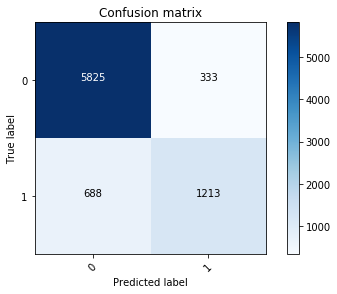

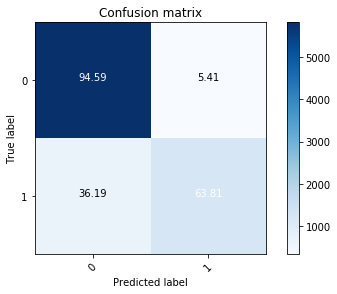

In [6]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm =  np.round(100 * cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], decimals=2)
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

plot_confusion_matrix(confusion_matrix(y_true=y_validation, y_pred=y_prediction), classes=["0", "1"])
plt.figure()
plot_confusion_matrix(confusion_matrix(y_true=y_validation, y_pred=y_prediction), classes=["0", "1"], normalize=True)

In [7]:
f1_score(y_validation, y_prediction, average='micro')

0.8733093435910163

# Train on whole dataset using optimised set of parameters

In [8]:
# final_model = lgb.LGBMClassifier(**gb_gridsearch.best_params_, random_state=42
final_model = lgb.LGBMClassifier(**best_params, random_state=42)
final_model.fit(X_train, y_train)

LGBMClassifier(boosting_type='gbdt', bootstrap=True, class_weight=None,
        colsample_bytree=1.0, dart=False, importance_type='split',
        learning_rate=0.001, max_bin=50, max_depth=10,
        min_child_samples=20, min_child_weight=0.001, min_data_in_leaf=40,
        min_split_gain=0.0, n_estimators=10000, n_jobs=-1, num_leaves=50,
        objective='binary', random_state=42, reg_alpha=0, reg_lambda=0.1,
        silent=True, subsample=1.0, subsample_for_bin=200000,
        subsample_freq=0)

# Predict on test and save

In [9]:
# issue: one country 'native-country_ Holand-Netherlands' in test but not in train
X_test = X_test.drop('native-country_ Holand-Netherlands', axis=1)

/Users/hanae/opt/anaconda3/envs/default/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


,prediction
id,
1,0
2,0
3,0
4,0
5,0


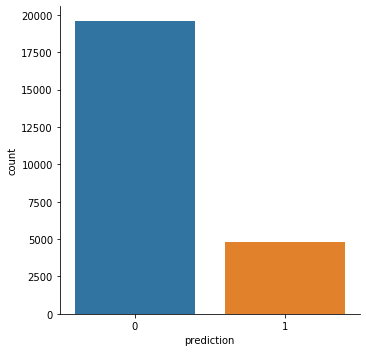

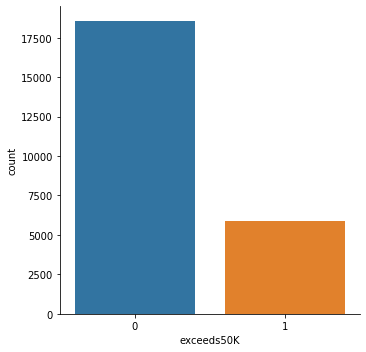

In [10]:
y_test = final_model.predict(X_test)

res = {}
res["prediction"] = y_test
df = pd.DataFrame(res)
df.index += 1
df.index.name = 'id'
sns.catplot(x="prediction", kind="count", data=df)
sns.catplot(x="exceeds50K", kind="count", data=train)
df.head()

In [11]:
# experience name
experience = 'LightGBM_simpleonehotencoding_f1micro'

if not os.path.exists(os.path.join('dump', experience)):
    os.mkdir(os.path.join('dump', experience))

X_train.to_csv(os.path.join('dump', experience, 'X_train.csv'))
X_test.to_csv(os.path.join('dump', experience, 'X_test.csv'))
pickle.dump(final_model, open(os.path.join('dump', experience, 'model'), 'wb'))
df.to_csv(os.path.join('dump', experience, experience+'.csv'))

# Feature importance

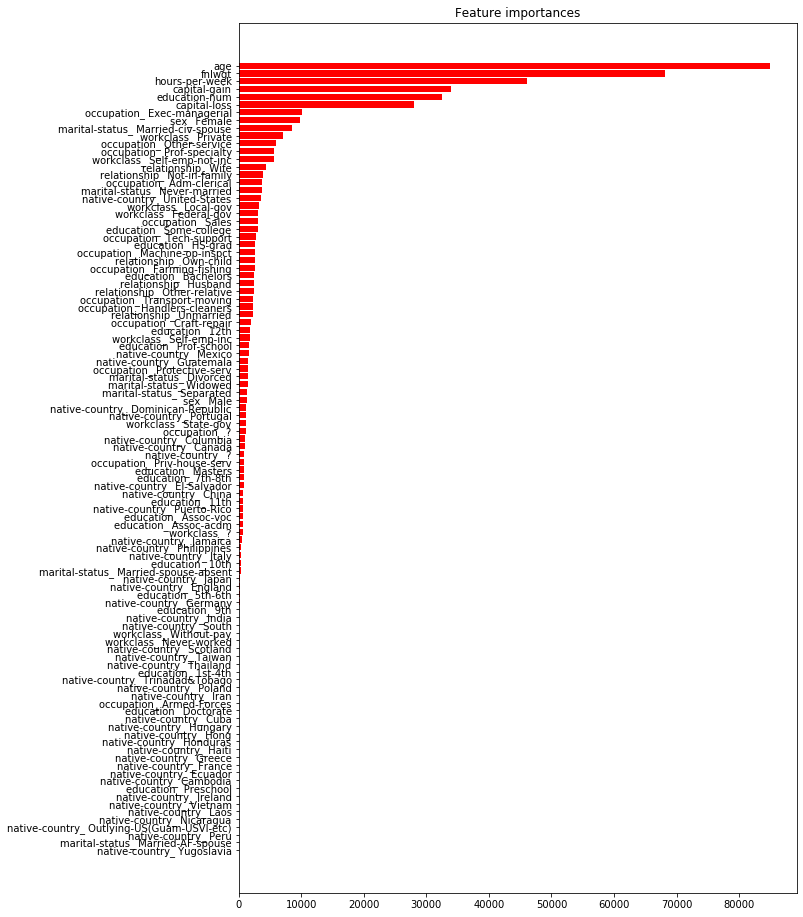

In [12]:
importances = final_model.feature_importances_
indices = np.argsort(importances)[::-1]
colnames = list(X_train)

fig, ax = plt.subplots(1, 1, figsize=(10,16))
ax.set_title("Feature importances")
ax.barh(range(len(colnames)), importances[indices[::-1]],
        color="r", align="center")
ax.set_yticks(range(len(colnames)))
ax.set_yticklabels(np.array(colnames)[indices][::-1])
plt.show()

In [13]:
experience = 'LightGBM_simpleonehotencoding_f1micro'
X_train = pd.read_csv(os.path.join('dump', experience, 'X_train.csv'), index_col=0)
final_model = pickle.load(open(os.path.join('dump', experience, 'model'), 'rb'))
lgb.create_tree_digraph(final_model).save(directory=os.path.join('dump', experience), filename='tree.dot')
call(['dot', '-Tpng', os.path.join('dump', experience, 'tree.dot'),
      '-o', os.path.join('dump', experience, 'tree.png'), '-Gdpi=600'])
# Display in jupyter notebook
Image(filename = os.path.join('dump', experience, 'tree.png'))

ImportError: You must install graphviz to plot tree.